<a href="https://colab.research.google.com/github/RoyMukta/Data-Science-Research-Project-Part_B-/blob/main/Temporal_Tracking_and_Network_Model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Define your project folder path
project_path = "/content/drive/My Drive/Project_N"

In [ ]:
# ==============================================================
# OBJECTIVE 2: TEMPORAL TRACKING + MARKOV TRANSITION MODEL
# ==============================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ==============================================================
# 1. LOAD DATA FROM GOOGLE DRIVE
# ==============================================================

file_path = "/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv"
df = pd.read_csv(file_path)

# Rename for consistency
df = df.rename(columns={
    'User ID': 'UserID',
    'Post Date': 'PostDate'
})

# Ensure date type
df['PostDate'] = pd.to_datetime(df['PostDate'], errors='coerce')

# Sort chronologically per user
df = df.sort_values(['UserID', 'PostDate'])


# ==============================================================
# 2. MAP LABELS → NUMERIC SCORES
# ==============================================================

depression_map = {'mild':1, 'moderate':2, 'severe':3}
anxiety_map    = {'low':1, 'medium':2, 'high':3}
suicide_map    = {'no_risk':0, 'medium_risk':1, 'high_risk':2}

df['DepressionScore'] = df['Depression'].map(depression_map)
df['AnxietyScore']    = df['Anxiety'].map(anxiety_map)
df['SuicideScore']    = df['SuicidalThought'].map(suicide_map)


# ==============================================================
# 3. USER-LEVEL TRAJECTORY SUMMARY TABLE
# ==============================================================

trajectory_summary = df.groupby("UserID").agg(
    First_Dep=('DepressionScore', 'first'),
    Last_Dep=('DepressionScore', 'last'),
    Dep_Change=('DepressionScore', lambda x: x.iloc[-1] - x.iloc[0]),

    First_Anx=('AnxietyScore', 'first'),
    Last_Anx=('AnxietyScore', 'last'),
    Anx_Change=('AnxietyScore', lambda x: x.iloc[-1] - x.iloc[0]),

    First_Sui=('SuicideScore', 'first'),
    Last_Sui=('SuicideScore', 'last'),
    Sui_Change=('SuicideScore', lambda x: x.iloc[-1] - x.iloc[0]),
)

trajectory_summary.to_csv(
    "/content/drive/MyDrive/Project_N/User_Trajectory_Summary.csv"
)


# ==============================================================
# 4. PLOT SAMPLE USER TRAJECTORIES (FIRST 5 USERS)
# ==============================================================

sample_users = df['UserID'].unique()[:5]

for u in sample_users:
    temp = df[df['UserID'] == u]

    plt.figure(figsize=(10,5))
    plt.plot(temp['PostDate'], temp['DepressionScore'], marker='o', label="Depression")
    plt.plot(temp['PostDate'], temp['AnxietyScore'], marker='o', label="Anxiety")
    plt.plot(temp['PostDate'], temp['SuicideScore'], marker='o', label="Suicide Risk")

    plt.title(f"Mental Health Trajectory for User {u}")
    plt.xlabel("Post Date")
    plt.ylabel("Severity Level")
    plt.grid(True)
    plt.legend()

    plt.savefig(f"/content/drive/MyDrive/Project_N/User_{u}_Trajectory.png")
    plt.close()



# ==============================================================
# 5. MARKOV TRANSITION MODEL (SAFE VERSION — NO WARNINGS)
# ==============================================================

def build_transition_matrix(sequence, num_states):
    """
    Builds a Markov transition matrix with safe division.
    Avoids divide-by-zero warnings.
    """
    matrix = np.zeros((num_states, num_states))

    # Count transitions
    for i in range(len(sequence) - 1):
        current = sequence[i]
        nxt = sequence[i+1]
        matrix[current][nxt] += 1

    # Safe divide (avoid division by zero)
    row_sums = matrix.sum(axis=1, keepdims=True)
    row_sums[row_sums == 0] = 1
    matrix = matrix / row_sums

    return matrix



# ==============================================================
# 5.1 DEPRESSION MARKOV MODEL
# ==============================================================

dep_transitions = []
for uid, group in df.groupby("UserID"):
    seq = group['DepressionScore'].tolist()
    if len(seq) > 1:
        dep_transitions.extend(list(zip(seq[:-1], seq[1:])))

dep_seq = [t[0] for t in dep_transitions]
matrix_dep = build_transition_matrix(dep_seq, 4)

df_dep_mat = pd.DataFrame(
    matrix_dep[1:4, 1:4],
    index=['mild','moderate','severe'],
    columns=['→mild','→moderate','→severe']
)

df_dep_mat.to_csv("/content/drive/MyDrive/Project_N/Depression_Markov_Transitions.csv")

plt.figure(figsize=(6,5))
sns.heatmap(df_dep_mat, annot=True, cmap="Blues")
plt.title("Depression Markov Transition Matrix")
plt.savefig("/content/drive/MyDrive/Project_N/Depression_Markov_Heatmap.png")
plt.close()



# ==============================================================
# 5.2 ANXIETY MARKOV MODEL
# ==============================================================

anx_transitions = []
for uid, group in df.groupby("UserID"):
    seq = group['AnxietyScore'].tolist()
    if len(seq) > 1:
        anx_transitions.extend(list(zip(seq[:-1], seq[1:])))

anx_seq = [t[0] for t in anx_transitions]
matrix_anx = build_transition_matrix(anx_seq, 4)

df_anx_mat = pd.DataFrame(
    matrix_anx[1:4, 1:4],
    index=['low','medium','high'],
    columns=['→low','→medium','→high']
)

df_anx_mat.to_csv("/content/drive/MyDrive/Project_N/Anxiety_Markov_Transitions.csv")

plt.figure(figsize=(6,5))
sns.heatmap(df_anx_mat, annot=True, cmap="Greens")
plt.title("Anxiety Markov Transition Matrix")
plt.savefig("/content/drive/MyDrive/Project_N/Anxiety_Markov_Heatmap.png")
plt.close()



# ==============================================================
# 5.3 SUICIDAL RISK MARKOV MODEL
# ==============================================================

sui_transitions = []
for uid, group in df.groupby("UserID"):
    seq = group['SuicideScore'].tolist()
    if len(seq) > 1:
        sui_transitions.extend(list(zip(seq[:-1], seq[1:])))

sui_seq = [t[0] for t in sui_transitions]
matrix_sui = build_transition_matrix(sui_seq, 3)

df_sui_mat = pd.DataFrame(
    matrix_sui,
    index=['no_risk','medium_risk','high_risk'],
    columns=['→no_risk','→medium_risk','→high_risk']
)

df_sui_mat.to_csv("/content/drive/MyDrive/Project_N/Suicide_Markov_Transitions.csv")

plt.figure(figsize=(6,5))
sns.heatmap(df_sui_mat, annot=True, cmap="Reds")
plt.title("Suicidal Risk Markov Transition Matrix")
plt.savefig("/content/drive/MyDrive/Project_N/Suicide_Markov_Heatmap.png")
plt.close()


print("Objective 2 completed successfully. All outputs saved to Drive.")


Objective 2 completed successfully. All outputs saved to Drive.


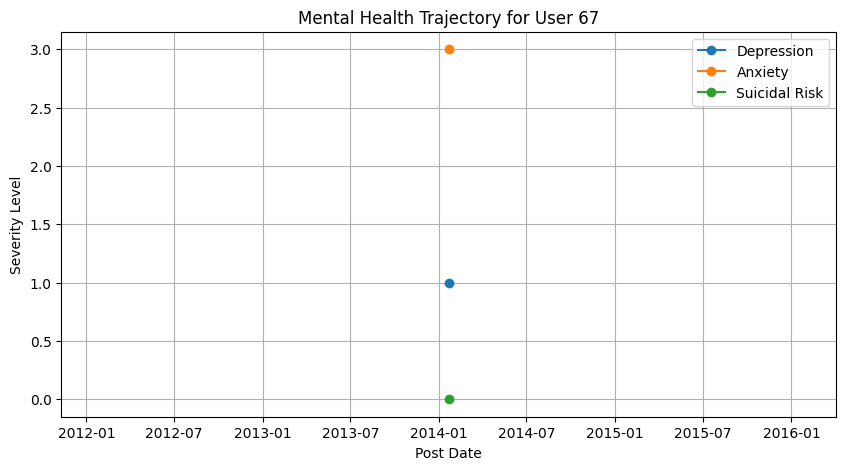

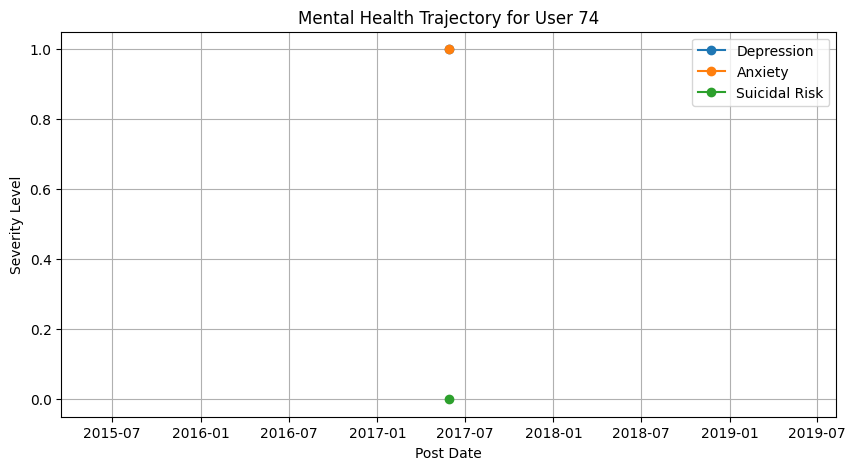

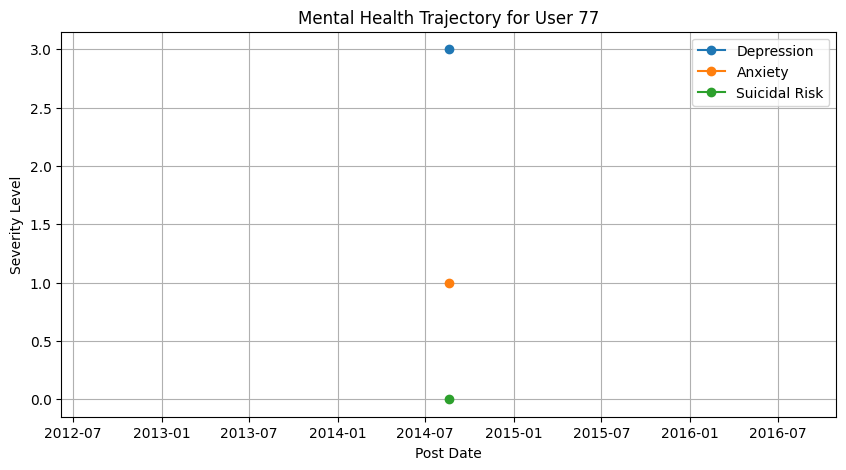

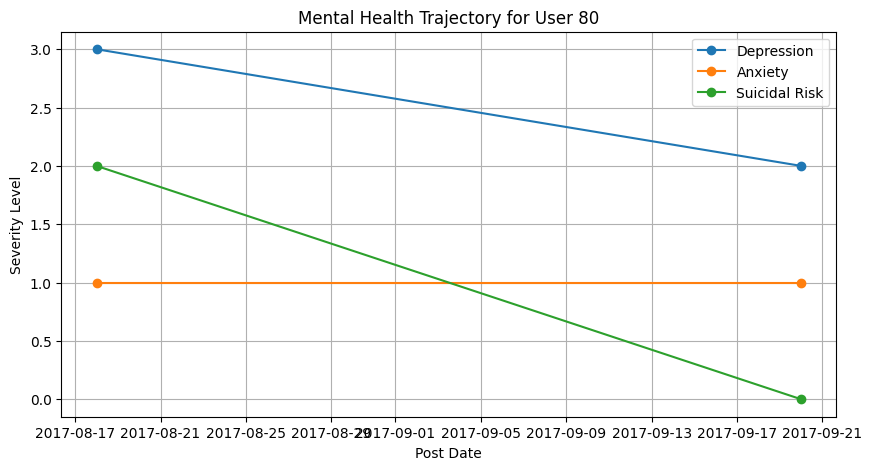

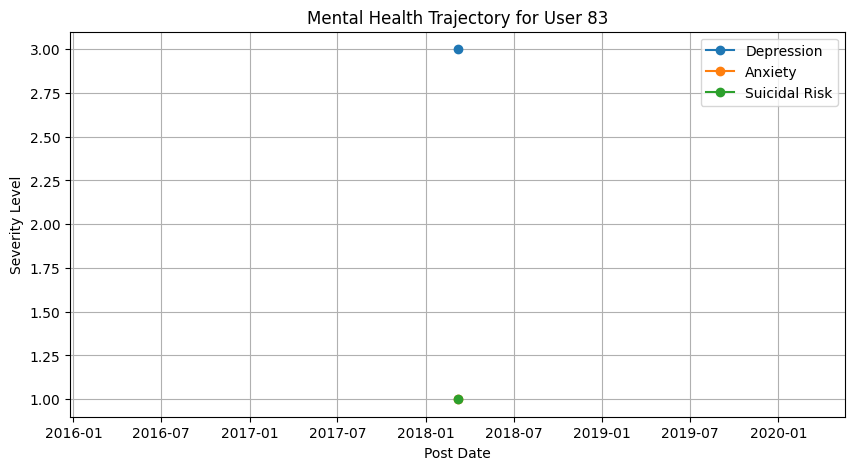

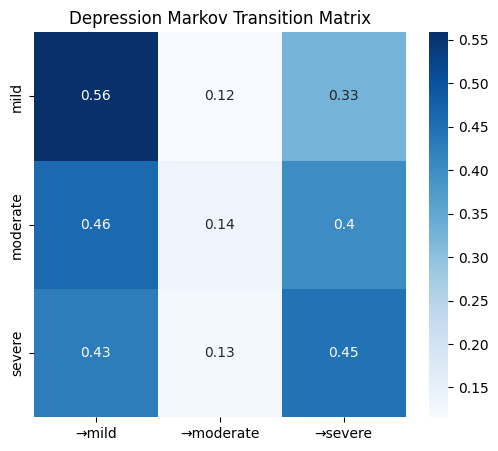

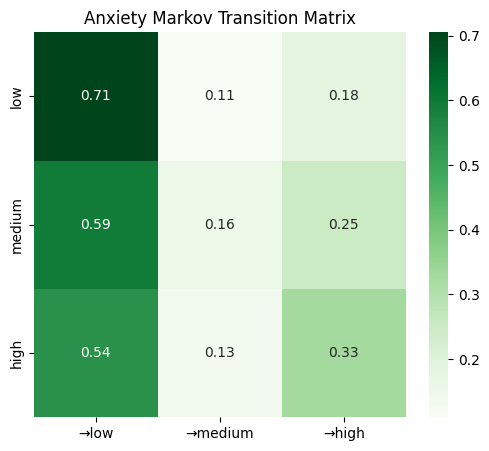

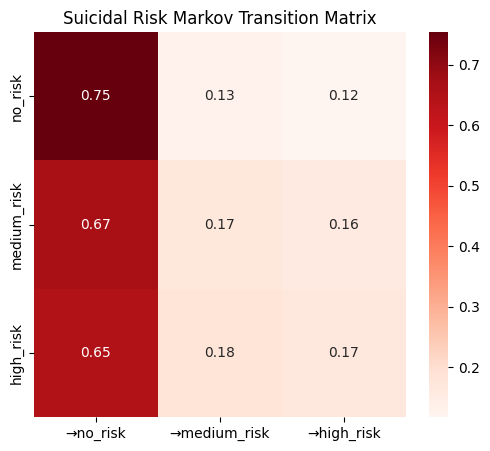

Objective 2 complete. Graphs displayed, CSV files saved to Drive.


In [ ]:
# ==============================================================
# OBJECTIVE 2: TEMPORAL TRACKING + MARKOV TRANSITION MODEL
# ==============================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ==============================================================
# 1. LOAD DATA FROM GOOGLE DRIVE
# ==============================================================

file_path = "/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv"
df = pd.read_csv(file_path)

# Rename for consistency
df = df.rename(columns={
    'User ID': 'UserID',
    'Post Date': 'PostDate'
})

# Parse date
df['PostDate'] = pd.to_datetime(df['PostDate'], errors='coerce')

# Sort by time sequence
df = df.sort_values(['UserID', 'PostDate'])


# ==============================================================
# 2. MAP LABELS → NUMERIC SCORES
# ==============================================================

depression_map = {'mild':1, 'moderate':2, 'severe':3}
anxiety_map    = {'low':1, 'medium':2, 'high':3}
suicide_map    = {'no_risk':0, 'medium_risk':1, 'high_risk':2}

df['DepressionScore'] = df['Depression'].map(depression_map)
df['AnxietyScore']    = df['Anxiety'].map(anxiety_map)
df['SuicideScore']    = df['SuicidalThought'].map(suicide_map)


# ==============================================================
# 3. USER-LEVEL SUMMARY (SAVE TO DRIVE)
# ==============================================================

trajectory_summary = df.groupby("UserID").agg(
    First_Dep=('DepressionScore','first'),
    Last_Dep=('DepressionScore','last'),
    Dep_Change=('DepressionScore', lambda x: x.iloc[-1] - x.iloc[0]),

    First_Anx=('AnxietyScore','first'),
    Last_Anx=('AnxietyScore','last'),
    Anx_Change=('AnxietyScore', lambda x: x.iloc[-1] - x.iloc[0]),

    First_Sui=('SuicideScore','first'),
    Last_Sui=('SuicideScore','last'),
    Sui_Change=('SuicideScore', lambda x: x.iloc[-1] - x.iloc[0])
)

trajectory_summary.to_csv("/content/drive/MyDrive/Project_N/User_Trajectory_Summary.csv")


# ==============================================================
# 4. PLOT TRAJECTORIES (DISPLAY IN NOTEBOOK)
# ==============================================================

sample_users = df['UserID'].unique()[:5]

for u in sample_users:
    temp = df[df['UserID'] == u]

    plt.figure(figsize=(10,5))
    plt.plot(temp['PostDate'], temp['DepressionScore'], marker='o', label="Depression")
    plt.plot(temp['PostDate'], temp['AnxietyScore'], marker='o', label="Anxiety")
    plt.plot(temp['PostDate'], temp['SuicideScore'], marker='o', label="Suicidal Risk")

    plt.title(f"Mental Health Trajectory for User {u}")
    plt.xlabel("Post Date")
    plt.ylabel("Severity Level")
    plt.grid(True)
    plt.legend()

    plt.show()  # 👈 SHOW IN NOTEBOOK



# ==============================================================
# 5. SAFE MARKOV TRANSITION FUNCTION
# ==============================================================

def build_transition_matrix(sequence, num_states):
    matrix = np.zeros((num_states, num_states))

    # Count transitions
    for i in range(len(sequence)-1):
        current = sequence[i]
        nxt = sequence[i+1]
        matrix[current][nxt] += 1

    # Safe divide to avoid warnings
    row_sums = matrix.sum(axis=1, keepdims=True)
    row_sums[row_sums == 0] = 1  # prevent division by zero
    matrix = matrix / row_sums

    return matrix



# ==============================================================
# 5.1 DEPRESSION MARKOV MODEL
# ==============================================================

dep_transitions = []
for uid, group in df.groupby("UserID"):
    seq = group['DepressionScore'].tolist()
    if len(seq) > 1:
        dep_transitions.extend(list(zip(seq[:-1], seq[1:])))

dep_seq = [t[0] for t in dep_transitions]
matrix_dep = build_transition_matrix(dep_seq, 4)

df_dep_mat = pd.DataFrame(
    matrix_dep[1:4, 1:4],
    index=['mild','moderate','severe'],
    columns=['→mild','→moderate','→severe']
)

df_dep_mat.to_csv("/content/drive/MyDrive/Project_N/Depression_Markov_Transitions.csv")

# DISPLAY HEATMAP
plt.figure(figsize=(6,5))
sns.heatmap(df_dep_mat, annot=True, cmap="Blues")
plt.title("Depression Markov Transition Matrix")
plt.show()



# ==============================================================
# 5.2 ANXIETY MARKOV MODEL
# ==============================================================

anx_transitions = []
for uid, group in df.groupby("UserID"):
    seq = group['AnxietyScore'].tolist()
    if len(seq) > 1:
        anx_transitions.extend(list(zip(seq[:-1], seq[1:])))

anx_seq = [t[0] for t in anx_transitions]
matrix_anx = build_transition_matrix(anx_seq, 4)

df_anx_mat = pd.DataFrame(
    matrix_anx[1:4, 1:4],
    index=['low','medium','high'],
    columns=['→low','→medium','→high']
)

df_anx_mat.to_csv("/content/drive/MyDrive/Project_N/Anxiety_Markov_Transitions.csv")

# DISPLAY HEATMAP
plt.figure(figsize=(6,5))
sns.heatmap(df_anx_mat, annot=True, cmap="Greens")
plt.title("Anxiety Markov Transition Matrix")
plt.show()



# ==============================================================
# 5.3 SUICIDAL RISK MARKOV MODEL
# ==============================================================

sui_transitions = []
for uid, group in df.groupby("UserID"):
    seq = group['SuicideScore'].tolist()
    if len(seq) > 1:
        sui_transitions.extend(list(zip(seq[:-1], seq[1:])))

sui_seq = [t[0] for t in sui_transitions]
matrix_sui = build_transition_matrix(sui_seq, 3)

df_sui_mat = pd.DataFrame(
    matrix_sui,
    index=['no_risk','medium_risk','high_risk'],
    columns=['→no_risk','→medium_risk','→high_risk']
)

df_sui_mat.to_csv("/content/drive/MyDrive/Project_N/Suicide_Markov_Transitions.csv")

# DISPLAY HEATMAP
plt.figure(figsize=(6,5))
sns.heatmap(df_sui_mat, annot=True, cmap="Reds")
plt.title("Suicidal Risk Markov Transition Matrix")
plt.show()


print("Objective 2 complete. Graphs displayed, CSV files saved to Drive.")


In [ ]:
df = pd.read_csv("/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv")
df.head()


,Post ID,Post Title,Post Content,Post Author,User ID,Post Date,Post Category,admiration,amusement,anger,...,realization,relief,remorse,sadness,surprise,neutral,Top_5_Emotions,Depression,Anxiety,SuicidalThought
0,607679,Hi Check out this post if youre not sure how t...,Hi there and welcome to the Anxiety section of...,BeyondBlue,54597,3/4/2025,Anxiety,0.011947,0.000128,0.000071,...,0.000428,0.000517,0.000090,0.000224,0.000207,0.000667,"gratitude:0.9687, admiration:0.0119, excitemen...",mild,low,no_risk
1,180185,I had a car accident,And it was entirely my own fault I tried cross...,grovi,12724,5/21/2016,Anxiety,0.005364,0.002298,0.004039,...,0.032309,0.006464,0.022705,0.064524,0.001799,0.007187,"fear:0.5752, nervousness:0.1214, sadness:0.064...",mild,high,no_risk
2,516409,Horrible week,Hi everyone Im having a horrible week so just ...,Whatsinaname,7809,9/25/2020,Anxiety,0.002001,0.002999,0.002499,...,0.012879,0.009477,0.007282,0.104841,0.002449,0.021860,"fear:0.2703, optimism:0.2263, nervousness:0.14...",mild,medium,no_risk
3,605332,New relationship anxiety,Dear All Just need a connection to feel the su...,Sammy,52665,1/10/2025,Anxiety,0.012412,0.001048,0.002596,...,0.009246,0.017817,0.067084,0.157380,0.000685,0.005930,"gratitude:0.2129, desire:0.1604, sadness:0.157...",mild,low,no_risk
4,610948,Persistent constant anxiety,Hi there just reaching out to anyone who might...,Beepboop,55341,6/3/2025,Anxiety,0.002594,0.001911,0.001610,...,0.021769,0.006503,0.002845,0.067626,0.001583,0.026680,"nervousness:0.6225, fear:0.1034, sadness:0.067...",mild,high,no_risk


In [ ]:
total_users = df['User ID'].nunique()
print("Total unique users:", total_users)


Total unique users: 18698


In [ ]:
unique_users = df['User ID'].unique()
unique_users


array([54597, 12724,  7809, ..., 46662, 46683, 46673])

In [ ]:
user_post_counts = df.groupby('User ID')['Post ID'].count().reset_index()
user_post_counts = user_post_counts.rename(columns={'Post ID': 'PostCount'})

user_post_counts


,User ID,PostCount
0,67,1
1,74,1
2,77,1
3,80,2
4,83,1
...,...,...
18693,55446,1
18694,55450,1
18695,55451,1
18696,55462,1


In [ ]:
user_post_counts.to_csv(
    "/content/drive/MyDrive/Project_N/User_Post_Counts.csv",
    index=False
)


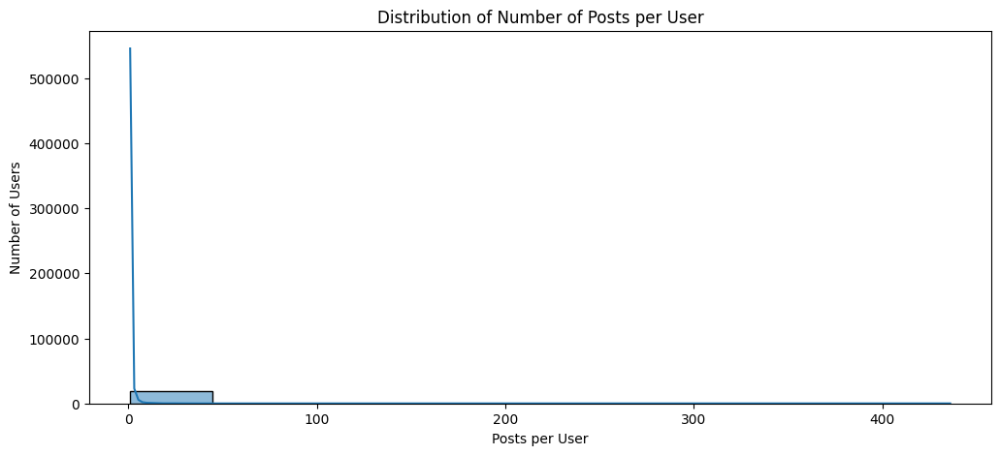

In [ ]:
plt.figure(figsize=(12,5))
sns.histplot(user_post_counts['PostCount'], bins=10, kde=True)
plt.title("Distribution of Number of Posts per User")
plt.xlabel("Posts per User")
plt.ylabel("Number of Users")
plt.show()


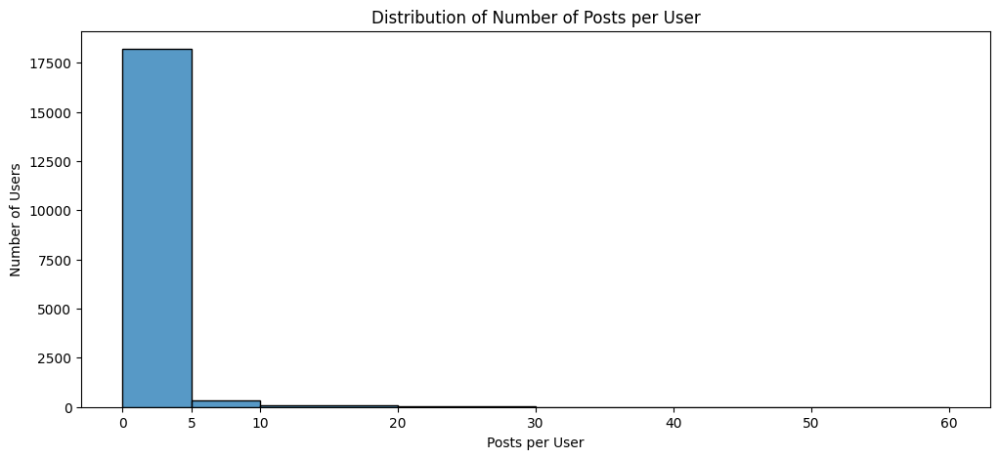

In [ ]:
import numpy as np

# Custom bins
bins = [0, 5, 10, 20, 30, 40, 50, 60]

plt.figure(figsize=(12,5))
sns.histplot(user_post_counts['PostCount'], bins=bins, kde=False, edgecolor='black')
plt.title("Distribution of Number of Posts per User")
plt.xlabel("Posts per User")
plt.ylabel("Number of Users")
plt.xticks(bins)
plt.show()


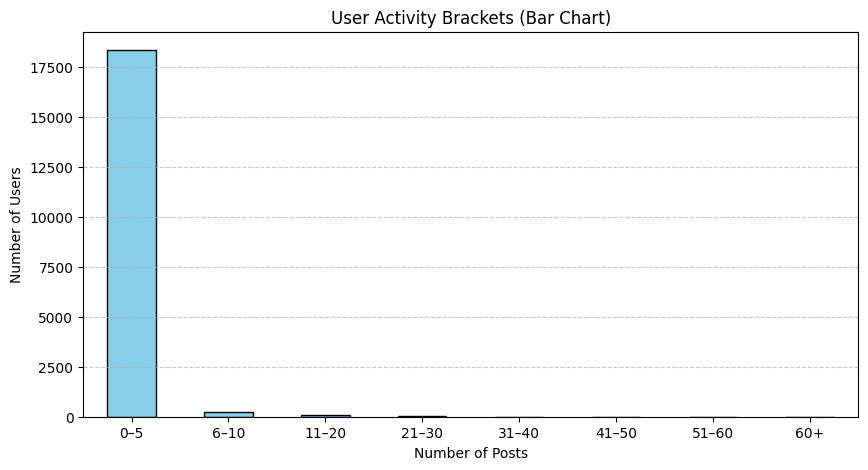

In [ ]:
import numpy as np

# Define bins
bins = [0, 5, 10, 20, 30, 40, 50, 60, user_post_counts['PostCount'].max()]

# Cut users into bins
user_post_counts['Bracket'] = pd.cut(
    user_post_counts['PostCount'],
    bins=bins,
    labels=['0–5','6–10','11–20','21–30','31–40','41–50','51–60','60+'],
    include_lowest=True
)

# Count users per bracket
bracket_counts = user_post_counts['Bracket'].value_counts().sort_index()

# Plot bar chart
plt.figure(figsize=(10,5))
bracket_counts.plot(kind='bar', color='skyblue', edgecolor='black')

plt.title("User Activity Brackets (Bar Chart)")
plt.xlabel("Number of Posts")
plt.ylabel("Number of Users")
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


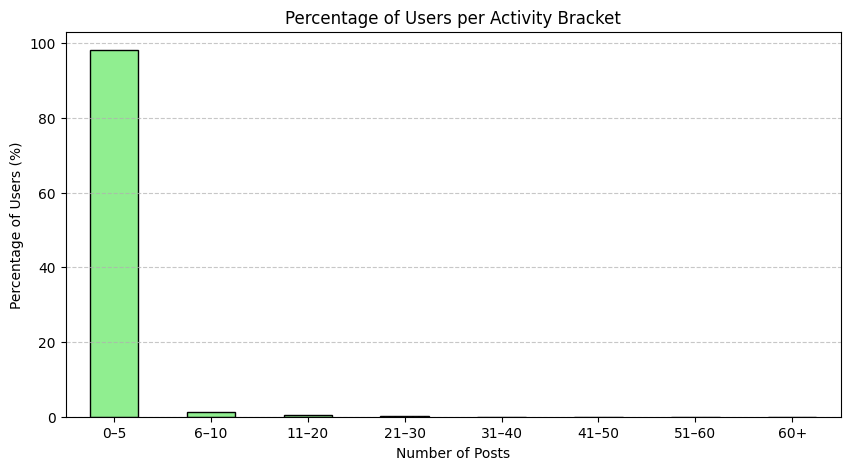

,count
Bracket,
0–5,98.176276
6–10,1.149856
11–20,0.470639
21–30,0.171141
31–40,0.021393
41–50,0.000000
51–60,0.000000
60+,0.010696


In [ ]:
# Convert to percentages
percentage_dist = (bracket_counts / bracket_counts.sum()) * 100

# Plot percentage bar chart
plt.figure(figsize=(10,5))
percentage_dist.plot(kind='bar', color='lightgreen', edgecolor='black')

plt.title("Percentage of Users per Activity Bracket")
plt.xlabel("Number of Posts")
plt.ylabel("Percentage of Users (%)")
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# Show percentage table
percentage_dist


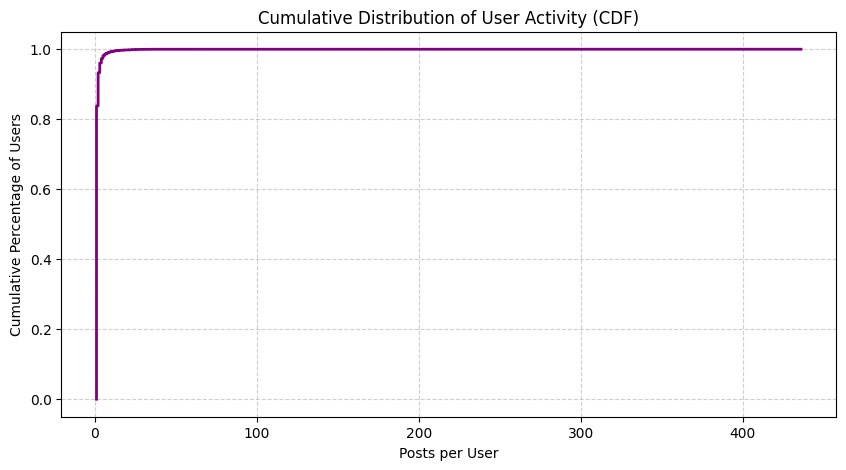

In [ ]:
# Sort post counts
sorted_counts = np.sort(user_post_counts['PostCount'])

# Compute CDF
cdf = np.arange(1, len(sorted_counts) + 1) / len(sorted_counts)

# Plot CDF
plt.figure(figsize=(10,5))
plt.plot(sorted_counts, cdf, linewidth=2, color='purple')

plt.title("Cumulative Distribution of User Activity (CDF)")
plt.xlabel("Posts per User")
plt.ylabel("Cumulative Percentage of Users")
plt.grid(True, linestyle='--', alpha=0.6)

plt.show()


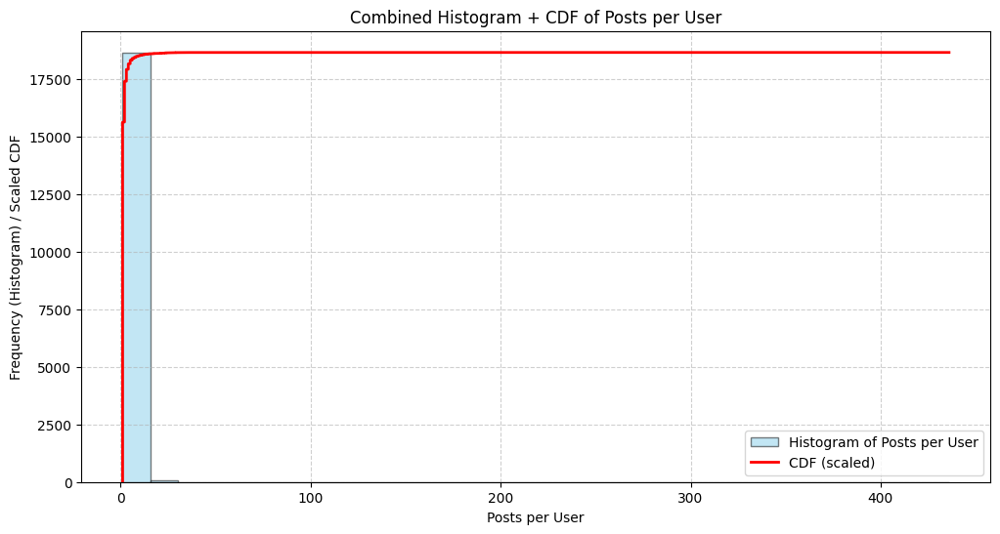

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Data
data = user_post_counts['PostCount']

plt.figure(figsize=(12,6))

# ------------------------------------------
# 1️⃣ Histogram
# ------------------------------------------
counts, bins, patches = plt.hist(
    data,
    bins=30,          # You can reduce bins if needed
    alpha=0.5,
    color='skyblue',
    edgecolor='black',
    label='Histogram of Posts per User'
)

# ------------------------------------------
# 2️⃣ CDF Curve
# ------------------------------------------
sorted_counts = np.sort(data)
cdf = np.arange(1, len(sorted_counts) + 1) / len(sorted_counts)

plt.plot(sorted_counts, cdf * max(counts),  # scale CDF to histogram height
         color='red', linewidth=2, label='CDF (scaled)')

# ------------------------------------------
# Plot Formatting
# ------------------------------------------
plt.title("Combined Histogram + CDF of Posts per User")
plt.xlabel("Posts per User")
plt.ylabel("Frequency (Histogram) / Scaled CDF")
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend()

plt.show()


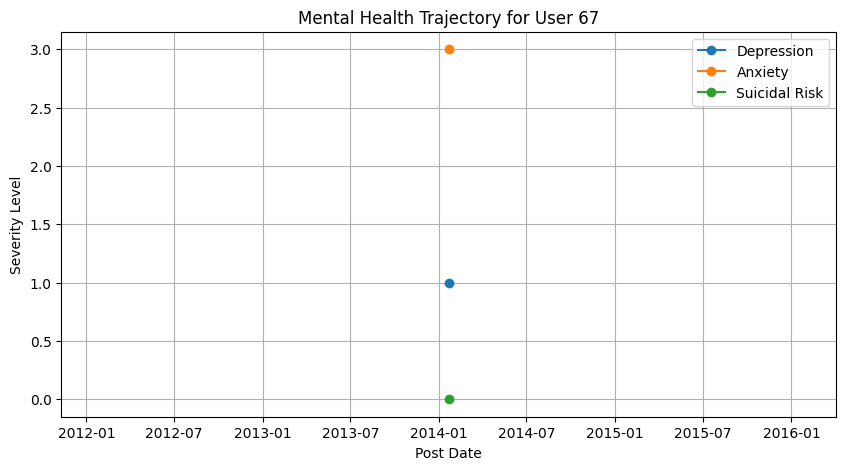

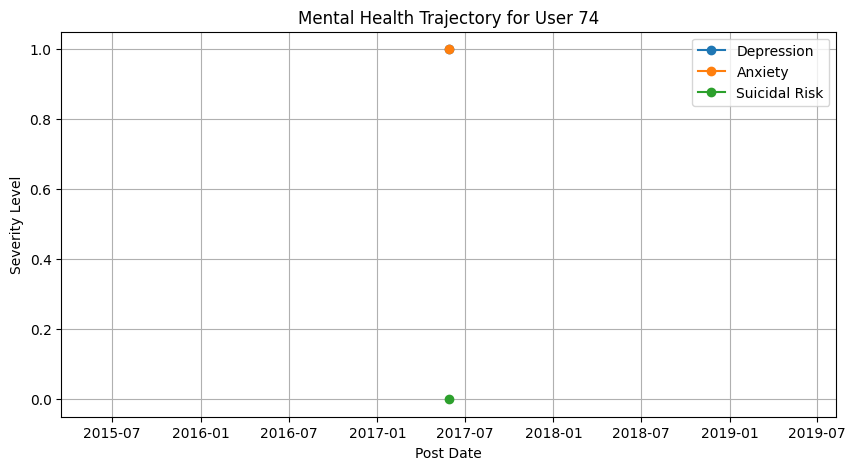

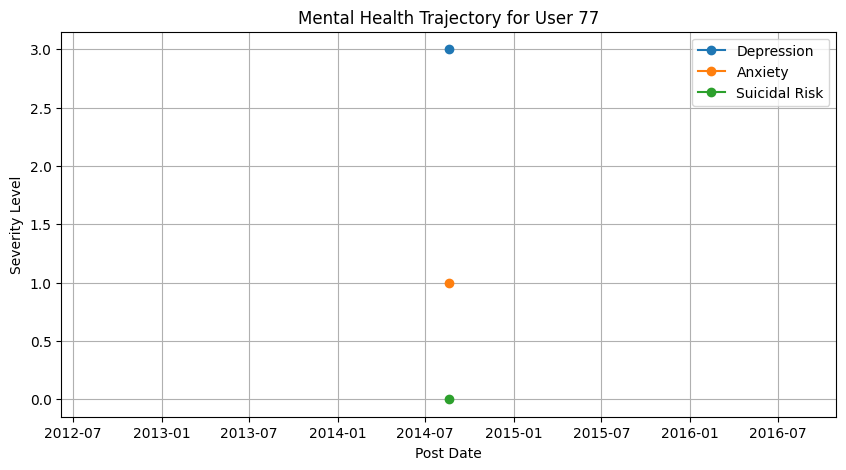

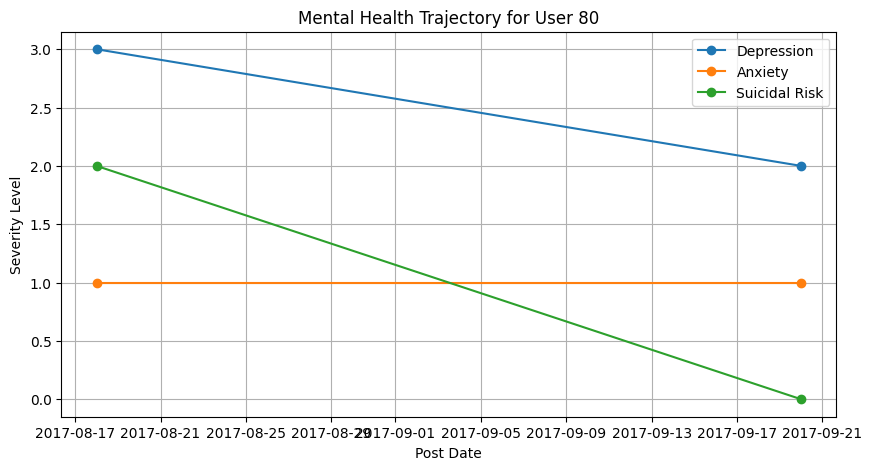

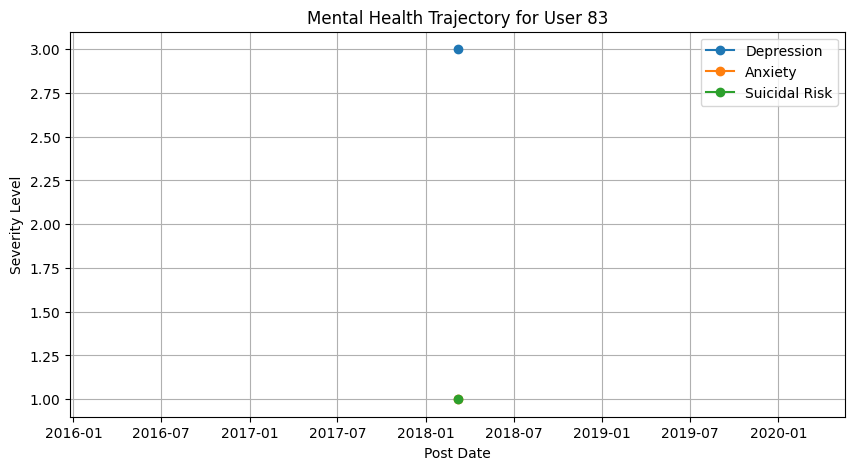

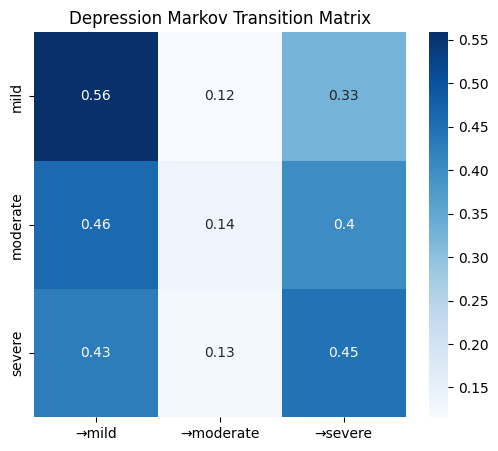

In [ ]:
# ==============================================================
# LOAD LIBRARIES
# ==============================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ==============================================================
# 1. LOAD DATA FROM GOOGLE DRIVE
# ==============================================================
file_path = "/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv"
df = pd.read_csv(file_path)

# Fix column names
df = df.rename(columns={
    'User ID': 'UserID',
    'Post Date': 'PostDate'
})

df['PostDate'] = pd.to_datetime(df['PostDate'], errors='coerce')
df = df.sort_values(['UserID', 'PostDate'])


# ==============================================================
# 2. MAP LABELS TO NUMERIC (NEEDED FOR TRAJECTORIES + MARKOV)
# ==============================================================
depression_map = {'mild':1, 'moderate':2, 'severe':3}
anxiety_map    = {'low':1, 'medium':2, 'high':3}
suicide_map    = {'no_risk':0, 'medium_risk':1, 'high_risk':2}

df['DepressionScore'] = df['Depression'].map(depression_map)
df['AnxietyScore']    = df['Anxiety'].map(anxiety_map)
df['SuicideScore']    = df['SuicidalThought'].map(suicide_map)


# ==============================================================
# PART B – TRAJECTORY MODELLING (LINE GRAPHS)
# ==============================================================
sample_users = df['UserID'].unique()[:5]   # first 5 users for report visuals

for u in sample_users:
    temp = df[df['UserID'] == u]

    plt.figure(figsize=(10,5))
    plt.plot(temp['PostDate'], temp['DepressionScore'], marker='o', label="Depression")
    plt.plot(temp['PostDate'], temp['AnxietyScore'], marker='o', label="Anxiety")
    plt.plot(temp['PostDate'], temp['SuicideScore'], marker='o', label="Suicidal Risk")

    plt.title(f"Mental Health Trajectory for User {u}")
    plt.xlabel("Post Date")
    plt.ylabel("Severity Level")
    plt.grid(True)
    plt.legend()
    plt.show()


# ==============================================================
# PART C – MARKOV TRANSITION MODELLING
# ==============================================================

# --- Safe Markov function (no warnings) ---
def build_transition_matrix(sequence, num_states):
    matrix = np.zeros((num_states, num_states))

    for i in range(len(sequence)-1):
        current = sequence[i]
        nxt = sequence[i+1]
        matrix[current][nxt] += 1

    row_sums = matrix.sum(axis=1, keepdims=True)
    row_sums[row_sums == 0] = 1  # prevent division by zero
    matrix = matrix / row_sums

    return matrix


# ----------------------------
# Depression Markov Matrix
# ----------------------------
dep_transitions = []
for uid, group in df.groupby("UserID"):
    seq = group['DepressionScore'].tolist()
    if len(seq) > 1:
        dep_transitions.extend(list(zip(seq[:-1], seq[1:])))

matrix_dep = build_transition_matrix([t[0] for t in dep_transitions], 4)

df_dep_mat = pd.DataFrame(
    matrix_dep[1:4, 1:4],
    index=['mild','moderate','severe'],
    columns=['→mild','→moderate','→severe']
)

df_dep_mat.to_csv("/content/drive/MyDrive/Project_N/Depression_Markov_Transitions.csv")

plt.figure(figsize=(6,5))
sns.heatmap(df_dep_mat, annot=True, cmap="Blues")
plt.title("Depression Markov Transition Matrix")
plt.show()


# ----------------------------
# Anxiety Markov Matrix
# ----------------------------
anx_transitions = []
for uid, group in df.groupby("UserID"):
    seq = group['AnxietyScore'].tolist()
    if len(seq) > 1:
        anx_transitions.extend(list(zip(seq[:-1], seq[1:])))

matrix_anx = build_transition_matrix([t[0] for t in anx_transitions], 4)

df_anx_mat = pd.DataFrame(
    matrix_anx[1:4, 1:4],
    index=['low','medium','high'],
    columns=['→low','→medium','→high']
)


In [ ]:
# ==============================================================
# LOAD LIBRARIES
# ==============================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ==============================================================
# 1. LOAD DATA FROM GOOGLE DRIVE
# ==============================================================
file_path = "/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv"
df = pd.read_csv(file_path)

# Fix column names
df = df.rename(columns={
    'User ID': 'UserID',
    'Post Date': 'PostDate'
})

df['PostDate'] = pd.to_datetime(df['PostDate'], errors='coerce')
df = df.sort_values(['UserID', 'PostDate'])


# ==============================================================
# 2. IDENTIFY TOP 5 MOST ACTIVE USERS
# ==============================================================
user_post_counts = df.groupby("UserID")["Post ID"].count().reset_index()
user_post_counts = user_post_counts.rename(columns={'Post ID': 'PostCount'})

top5_users = user_post_counts.sort_values("PostCount", ascending=False).head(5)['UserID']
print("Top 5 Users:", top5_users.tolist())

# Filter df for only these 5 users
df_top5 = df[df['UserID'].isin(top5_users)]


# ==============================================================
# 3. MAP LABELS TO NUMERIC
# ==============================================================
depression_map = {'mild':1, 'moderate':2, 'severe':3}
anxiety_map    = {'low':1, 'medium':2, 'high':3}
suicide_map    = {'no_risk':0, 'medium_risk':1, 'high_risk':2}

df_top5['DepressionScore'] = df_top5['Depression'].map(depression_map)
df_top5['AnxietyScore']    = df_top5['An]()


SyntaxError: unterminated string literal (detected at line 46) (ipython-input-3842736010.py, line 46)

Top 5 Users: [19707, 17566, 17509, 40416, 33966]


/tmp/ipython-input-1976613756.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top5['DepressionScore'] = df_top5['Depression'].map(depression_map)
/tmp/ipython-input-1976613756.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top5['AnxietyScore']    = df_top5['Anxiety'].map(anxiety_map)
/tmp/ipython-input-1976613756.py:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the d

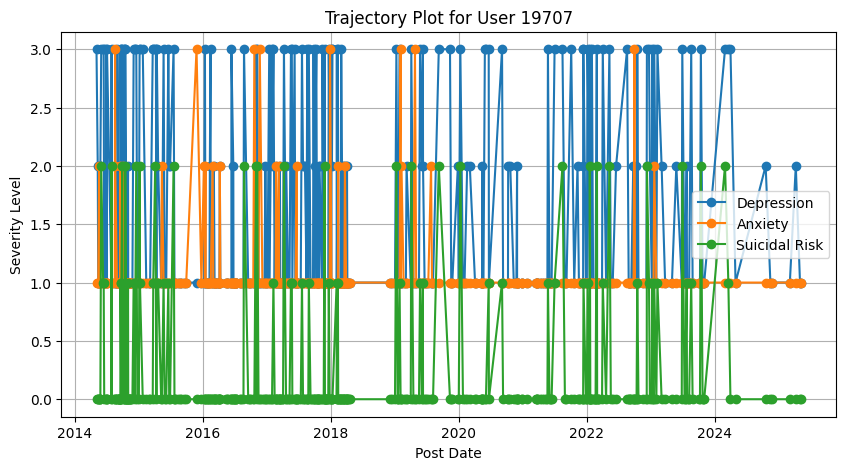

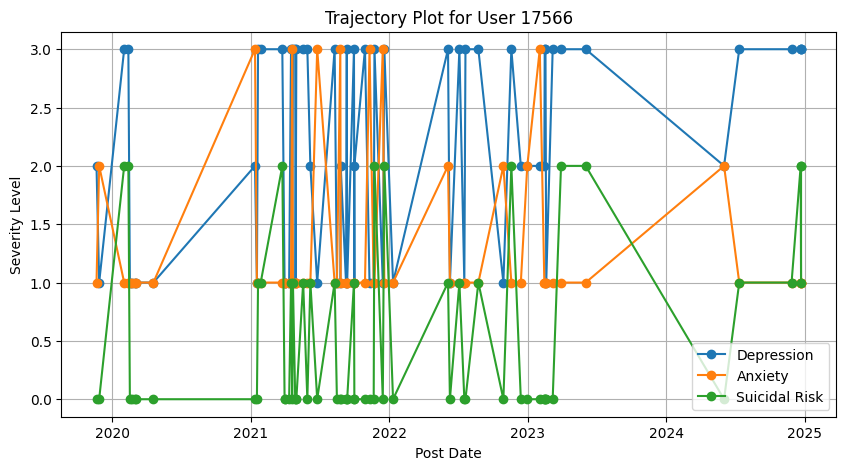

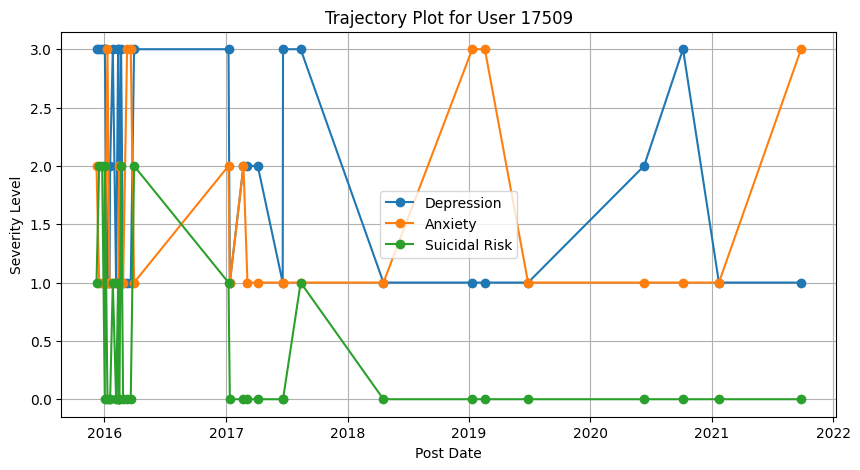

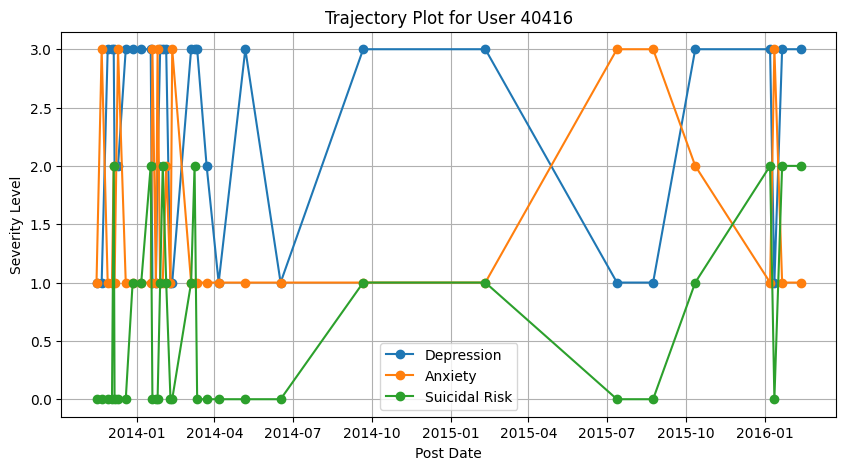

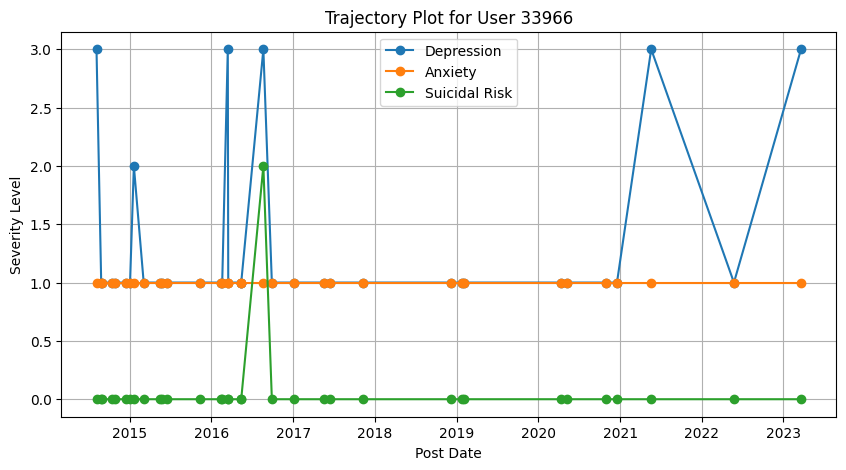

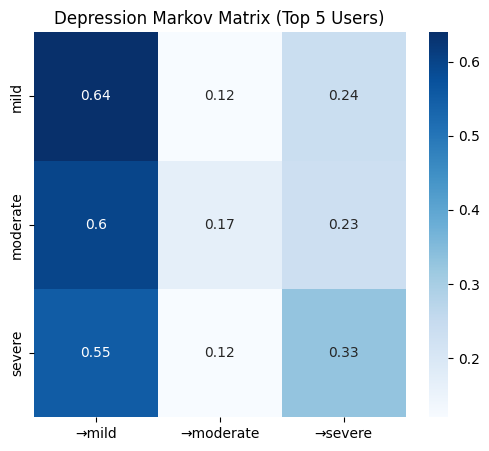

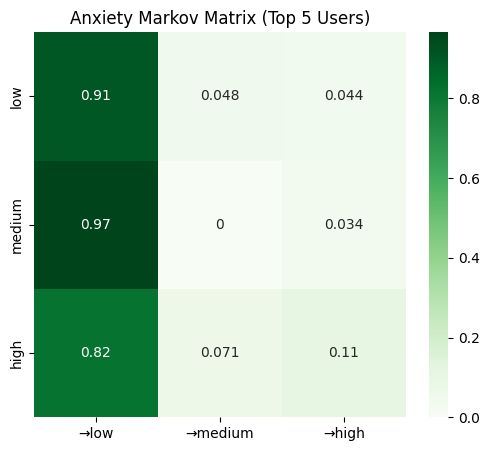

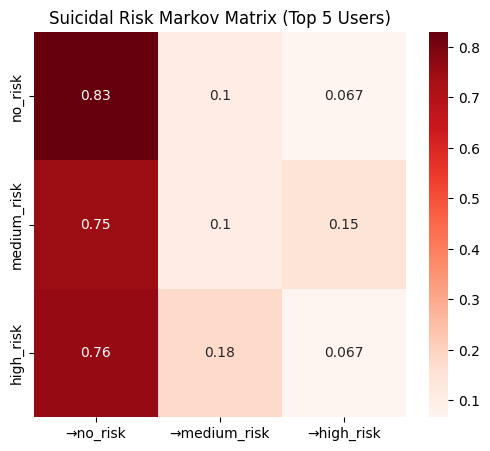

Trajectory + Markov modelling completed for top 5 users.


In [ ]:
# ==============================================================
# LOAD LIBRARIES
# ==============================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ==============================================================
# 1. LOAD DATA FROM GOOGLE DRIVE
# ==============================================================
file_path = "/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv"
df = pd.read_csv(file_path)

# Fix column names
df = df.rename(columns={
    'User ID': 'UserID',
    'Post Date': 'PostDate'
})

df['PostDate'] = pd.to_datetime(df['PostDate'], errors='coerce')
df = df.sort_values(['UserID', 'PostDate'])


# ==============================================================
# 2. IDENTIFY TOP 5 MOST ACTIVE USERS
# ==============================================================
user_post_counts = df.groupby("UserID")["Post ID"].count().reset_index()
user_post_counts = user_post_counts.rename(columns={'Post ID': 'PostCount'})

top5_users = user_post_counts.sort_values("PostCount", ascending=False).head(5)['UserID']
print("Top 5 Users:", top5_users.tolist())

# Filter df for only these 5 users
df_top5 = df[df['UserID'].isin(top5_users)]


# ==============================================================
# 3. MAP LABELS TO NUMERIC
# ==============================================================
depression_map = {'mild':1, 'moderate':2, 'severe':3}
anxiety_map    = {'low':1, 'medium':2, 'high':3}
suicide_map    = {'no_risk':0, 'medium_risk':1, 'high_risk':2}

df_top5['DepressionScore'] = df_top5['Depression'].map(depression_map)
df_top5['AnxietyScore']    = df_top5['Anxiety'].map(anxiety_map)
df_top5['SuicideScore']    = df_top5['SuicidalThought'].map(suicide_map)


# ==============================================================
# PART B – TRAJECTORY PLOTS (TOP 5 USERS)
# ==============================================================

for u in top5_users:
    temp = df_top5[df_top5['UserID'] == u]

    plt.figure(figsize=(10,5))
    plt.plot(temp['PostDate'], temp['DepressionScore'], marker='o', label="Depression")
    plt.plot(temp['PostDate'], temp['AnxietyScore'], marker='o', label="Anxiety")
    plt.plot(temp['PostDate'], temp['SuicideScore'], marker='o', label="Suicidal Risk")

    plt.title(f"Trajectory Plot for User {u}")
    plt.xlabel("Post Date")
    plt.ylabel("Severity Level")
    plt.grid(True)
    plt.legend()
    plt.show()



# ==============================================================
# PART C – MARKOV TRANSITION MODELLING (TOP 5 USERS)
# ==============================================================

def build_transition_matrix(sequence, num_states):
    matrix = np.zeros((num_states, num_states))

    for i in range(len(sequence)-1):
        current = sequence[i]
        nxt = sequence[i+1]
        matrix[current][nxt] += 1

    row_sums = matrix.sum(axis=1, keepdims=True)
    row_sums[row_sums == 0] = 1  # avoid divide by zero
    matrix = matrix / row_sums

    return matrix


# ----------------------------
# Depression Markov Matrix (Top 5)
# ----------------------------
dep_transitions = []
for uid, group in df_top5.groupby("UserID"):
    seq = group['DepressionScore'].tolist()
    if len(seq) > 1:
        dep_transitions.extend(list(zip(seq[:-1], seq[1:])))

matrix_dep = build_transition_matrix([t[0] for t in dep_transitions], 4)

df_dep_mat = pd.DataFrame(
    matrix_dep[1:4, 1:4],
    index=['mild','moderate','severe'],
    columns=['→mild','→moderate','→severe']
)

df_dep_mat.to_csv("/content/drive/MyDrive/Project_N/Top5_Depression_Markov.csv")

plt.figure(figsize=(6,5))
sns.heatmap(df_dep_mat, annot=True, cmap="Blues")
plt.title("Depression Markov Matrix (Top 5 Users)")
plt.show()


# ----------------------------
# Anxiety Markov Matrix (Top 5)
# ----------------------------
anx_transitions = []
for uid, group in df_top5.groupby("UserID"):
    seq = group['AnxietyScore'].tolist()
    if len(seq) > 1:
        anx_transitions.extend(list(zip(seq[:-1], seq[1:])))

matrix_anx = build_transition_matrix([t[0] for t in anx_transitions], 4)

df_anx_mat = pd.DataFrame(
    matrix_anx[1:4, 1:4],
    index=['low','medium','high'],
    columns=['→low','→medium','→high']
)

df_anx_mat.to_csv("/content/drive/MyDrive/Project_N/Top5_Anxiety_Markov.csv")

plt.figure(figsize=(6,5))
sns.heatmap(df_anx_mat, annot=True, cmap="Greens")
plt.title("Anxiety Markov Matrix (Top 5 Users)")
plt.show()


# ----------------------------
# Suicidal Risk Markov Matrix (Top 5)
# ----------------------------
sui_transitions = []
for uid, group in df_top5.groupby("UserID"):
    seq = group['SuicideScore'].tolist()
    if len(seq) > 1:
        sui_transitions.extend(list(zip(seq[:-1], seq[1:])))

matrix_sui = build_transition_matrix([t[0] for t in sui_transitions], 3)

df_sui_mat = pd.DataFrame(
    matrix_sui,
    index=['no_risk','medium_risk','high_risk'],
    columns=['→no_risk','→medium_risk','→high_risk']
)

df_sui_mat.to_csv("/content/drive/MyDrive/Project_N/Top5_SuicidalRisk_Markov.csv")

plt.figure(figsize=(6,5))
sns.heatmap(df_sui_mat, annot=True, cmap="Reds")
plt.title("Suicidal Risk Markov Matrix (Top 5 Users)")
plt.show()

print("Trajectory + Markov modelling completed for top 5 users.")


Top 6 Users: [19707, 17566, 17509, 40416, 33966, 40276]


/tmp/ipython-input-977289787.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top6['DepressionScore'] = df_top6['Depression'].map(depression_map)
/tmp/ipython-input-977289787.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top6['AnxietyScore']    = df_top6['Anxiety'].map(anxiety_map)
/tmp/ipython-input-977289787.py:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

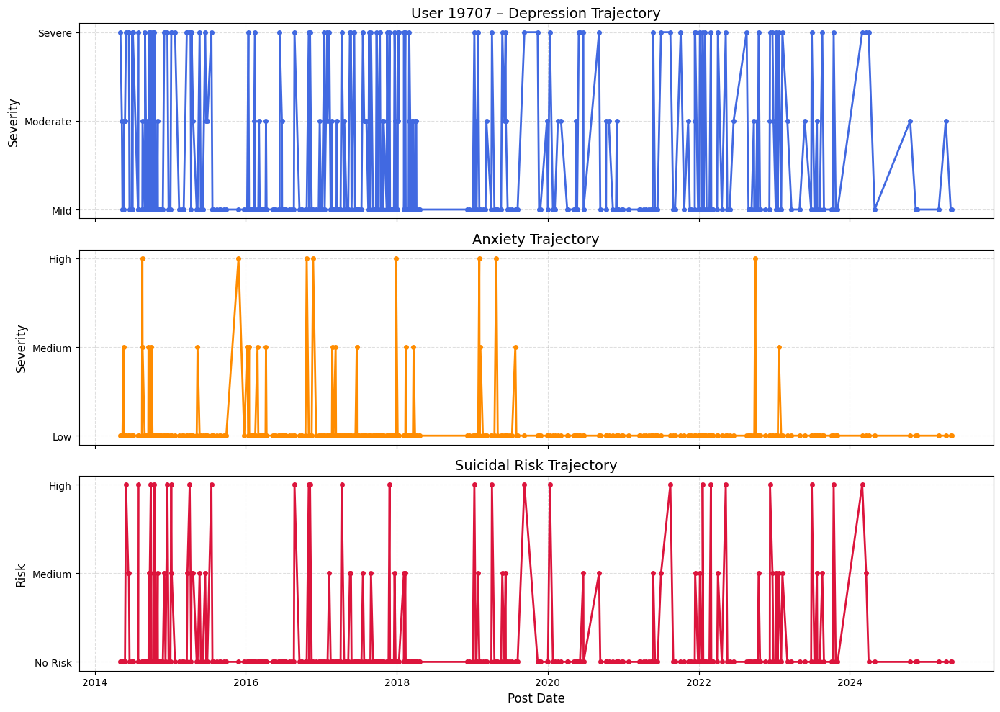

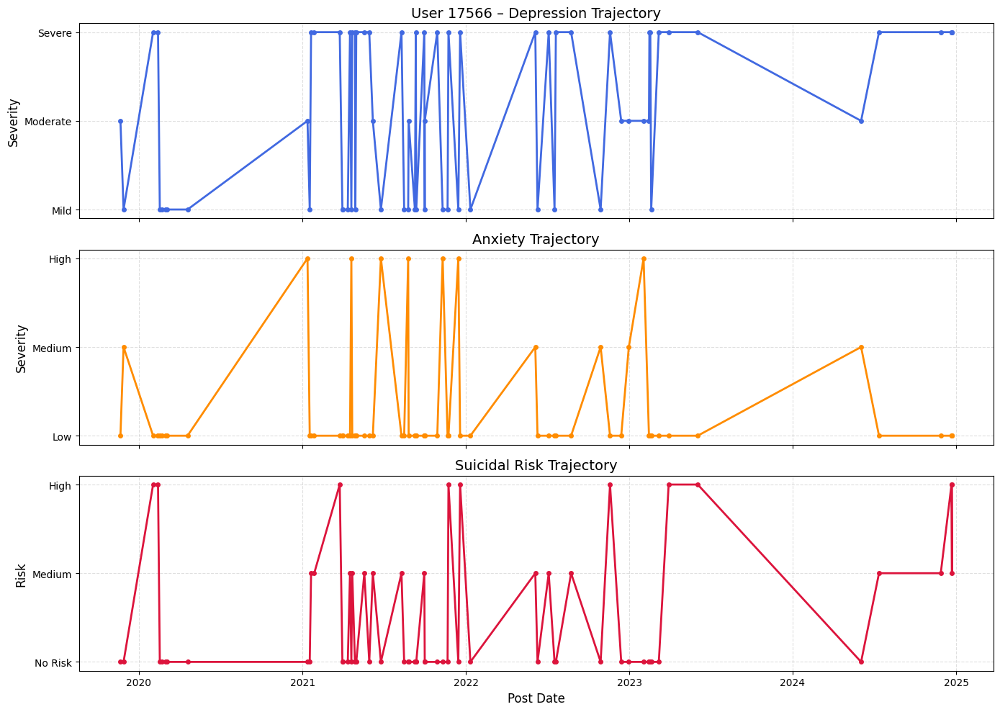

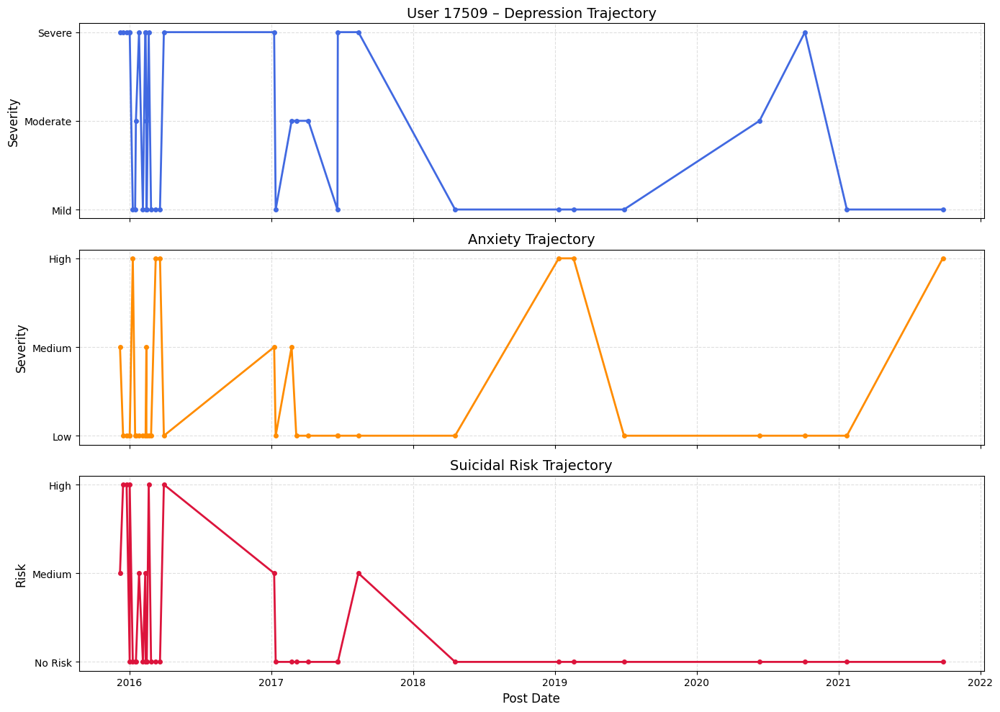

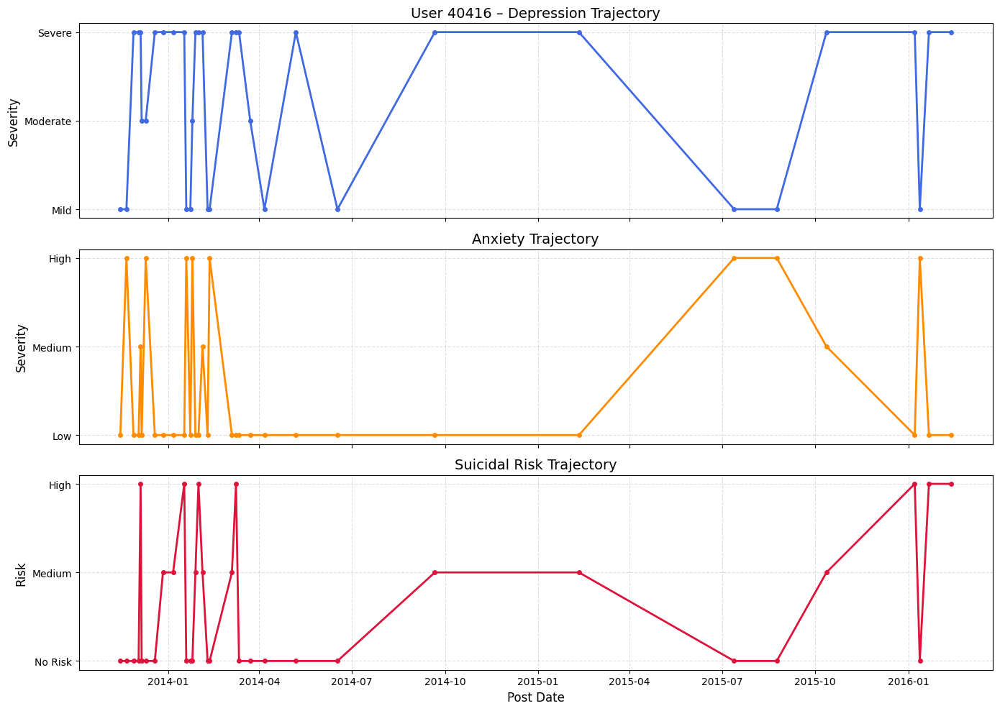

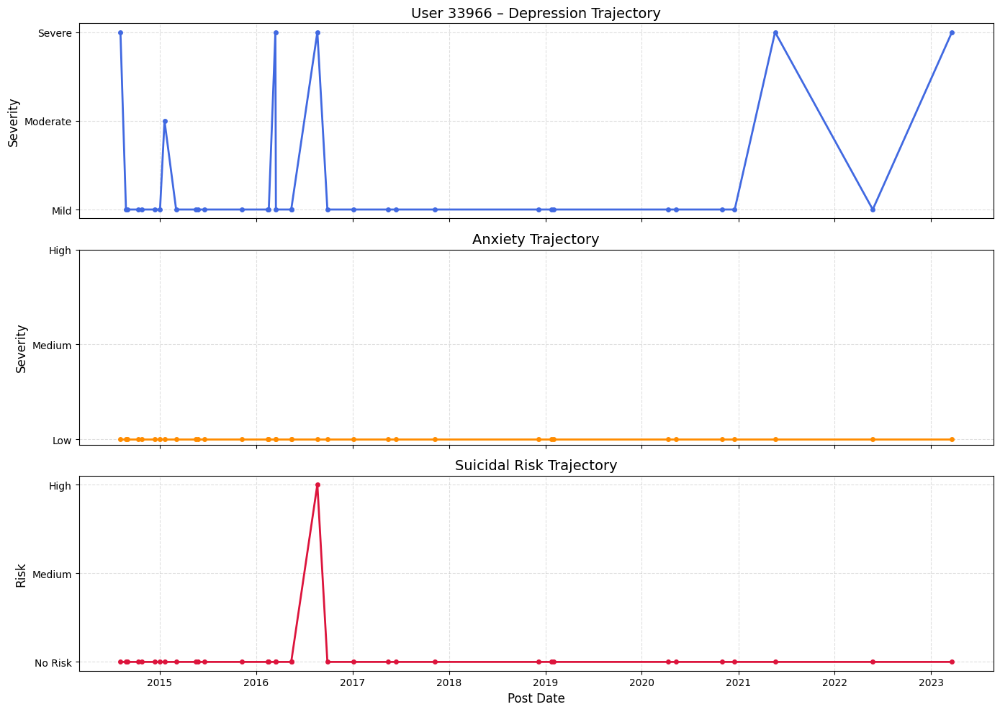

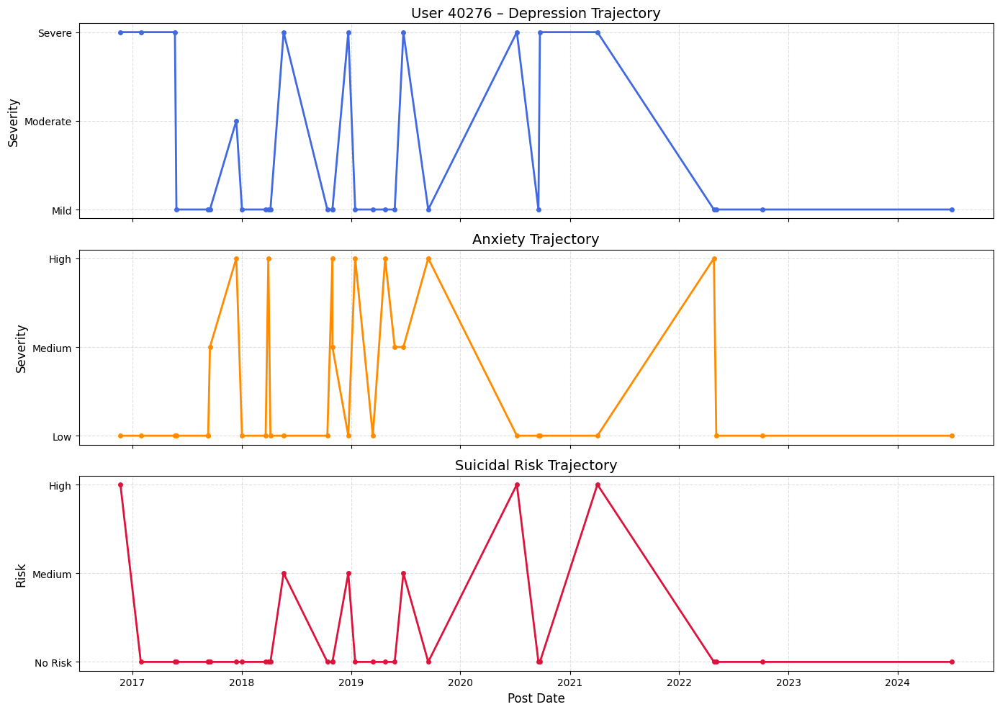

In [ ]:
# ==============================================================
# LOAD LIBRARIES
# ==============================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ==============================================================
# 1. LOAD DATA FROM GOOGLE DRIVE
# ==============================================================
file_path = "/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv"
df = pd.read_csv(file_path)

# Fix column names
df = df.rename(columns={
    'User ID': 'UserID',
    'Post Date': 'PostDate'
})

df['PostDate'] = pd.to_datetime(df['PostDate'], errors='coerce')
df = df.sort_values(['UserID', 'PostDate'])


# ==============================================================
# 2. IDENTIFY TOP 6 MOST ACTIVE USERS
# ==============================================================
user_post_counts = df.groupby("UserID")["Post ID"].count().reset_index()
user_post_counts = user_post_counts.rename(columns={'Post ID': 'PostCount'})

top6_users = user_post_counts.sort_values("PostCount", ascending=False).head(6)['UserID']
print("Top 6 Users:", top6_users.tolist())

# Filter only these users
df_top6 = df[df['UserID'].isin(top6_users)]


# ==============================================================
# 3. MAP LABELS TO NUMERIC SCORES
# ==============================================================
depression_map = {'mild':1, 'moderate':2, 'severe':3}
anxiety_map    = {'low':1, 'medium':2, 'high':3}
suicide_map    = {'no_risk':0, 'medium_risk':1, 'high_risk':2}

df_top6['DepressionScore'] = df_top6['Depression'].map(depression_map)
df_top6['AnxietyScore']    = df_top6['Anxiety'].map(anxiety_map)
df_top6['SuicideScore']    = df_top6['SuicidalThought'].map(suicide_map)


# ==============================================================
# 4. PART B – TRAJECTORY PLOTS (TOP 6 USERS, 3 SUBPLOTS EACH)
# ==============================================================

for u in top6_users:
    temp = df_top6[df_top6['UserID'] == u].copy()

    fig, axes = plt.subplots(3, 1, figsize=(14,10), sharex=True)

    # ----- Depression -----
    axes[0].plot(temp['PostDate'], temp['DepressionScore'], marker='o',
                 color='royalblue', linewidth=2, markersize=4)
    axes[0].set_title(f"User {u} – Depression Trajectory", fontsize=14)
    axes[0].set_ylabel("Severity", fontsize=12)
    axes[0].grid(True, linestyle='--', alpha=0.4)
    axes[0].set_yticks([1,2,3])
    axes[0].set_yticklabels(['Mild','Moderate','Severe'])

    # ----- Anxiety -----
    axes[1].plot(temp['PostDate'], temp['AnxietyScore'], marker='o',
                 color='darkorange', linewidth=2, markersize=4)
    axes[1].set_title("Anxiety Trajectory", fontsize=14)
    axes[1].set_ylabel("Severity", fontsize=12)
    axes[1].grid(True, linestyle='--', alpha=0.4)
    axes[1].set_yticks([1,2,3])
    axes[1].set_yticklabels(['Low','Medium','High'])

    # ----- Suicidal Risk -----
    axes[2].plot(temp['PostDate'], temp['SuicideScore'], marker='o',
                 color='crimson', linewidth=2, markersize=4)
    axes[2].set_title("Suicidal Risk Trajectory", fontsize=14)
    axes[2].set_ylabel("Risk", fontsize=12)
    axes[2].grid(True, linestyle='--', alpha=0.4)
    axes[2].set_yticks([0,1,2])
    axes[2].set_yticklabels(['No Risk','Medium','High'])
    axes[2].set_xlabel("Post Date", fontsize=12)

    plt.tight_layout()
    plt.show()


#### PNG for trend

Top 6 Users: [19707, 17566, 17509, 40416, 33966, 40276]


/tmp/ipython-input-3088514468.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top6['DepressionScore'] = df_top6['Depression'].map(depression_map)
/tmp/ipython-input-3088514468.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top6['AnxietyScore']    = df_top6['Anxiety'].map(anxiety_map)
/tmp/ipython-input-3088514468.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the d

Saved PNG: /content/drive/MyDrive/Project_N/User_19707_Trajectory.png


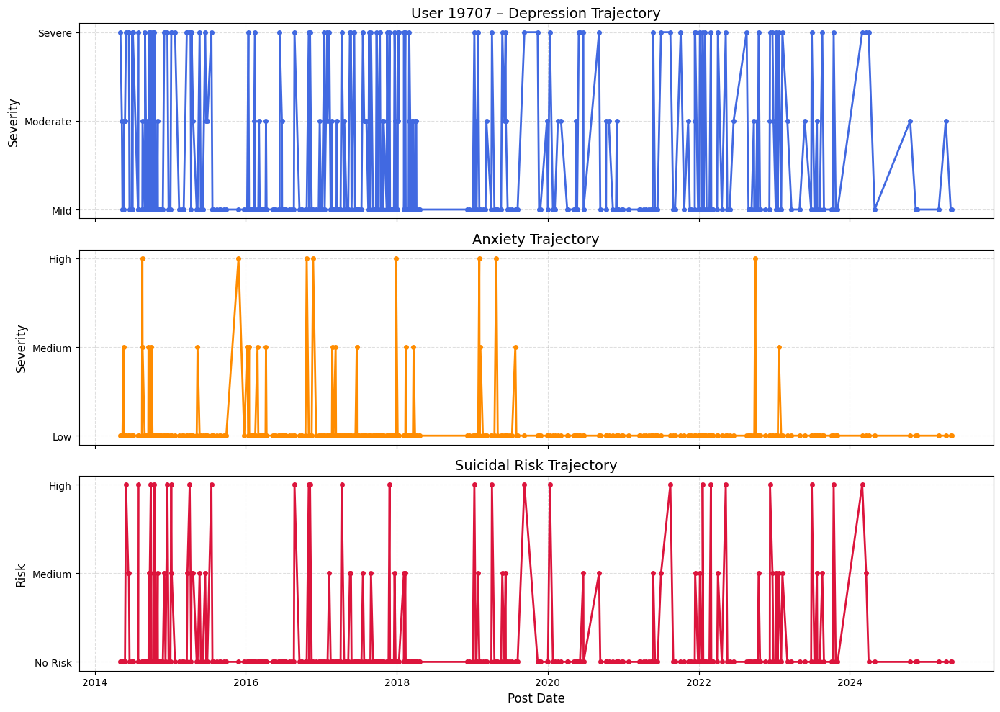

Saved PNG: /content/drive/MyDrive/Project_N/User_17566_Trajectory.png


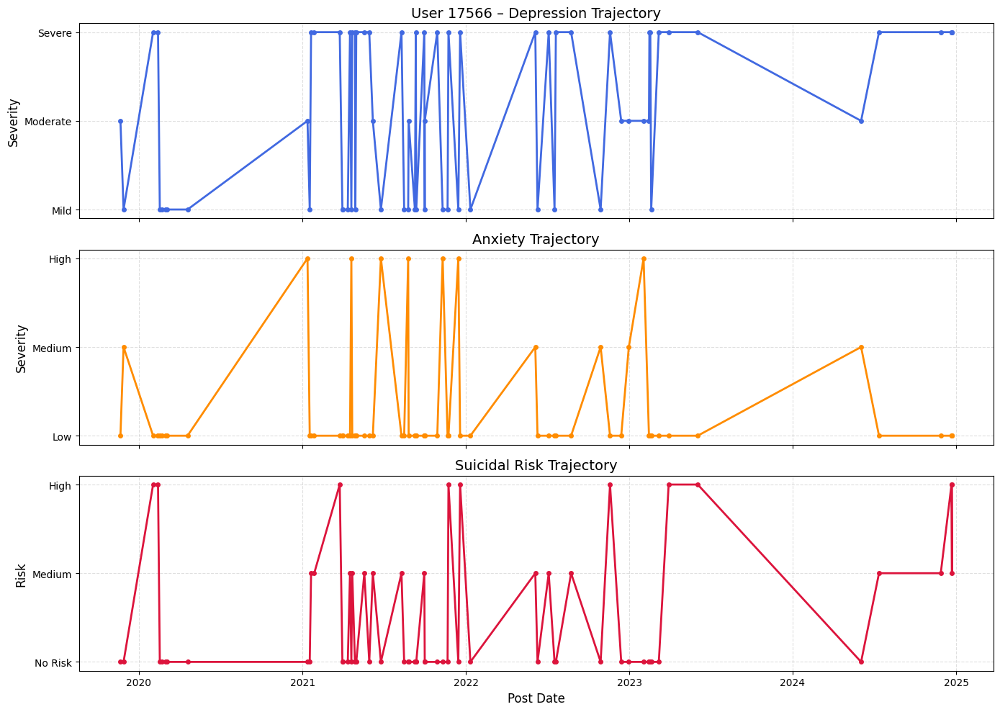

Saved PNG: /content/drive/MyDrive/Project_N/User_17509_Trajectory.png


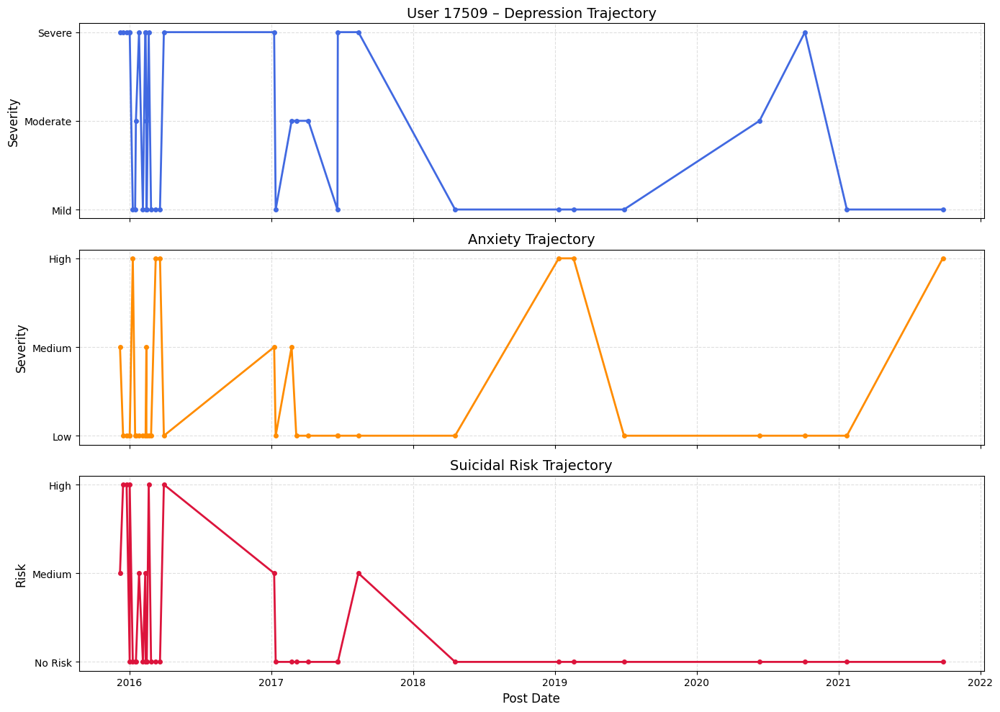

Saved PNG: /content/drive/MyDrive/Project_N/User_40416_Trajectory.png


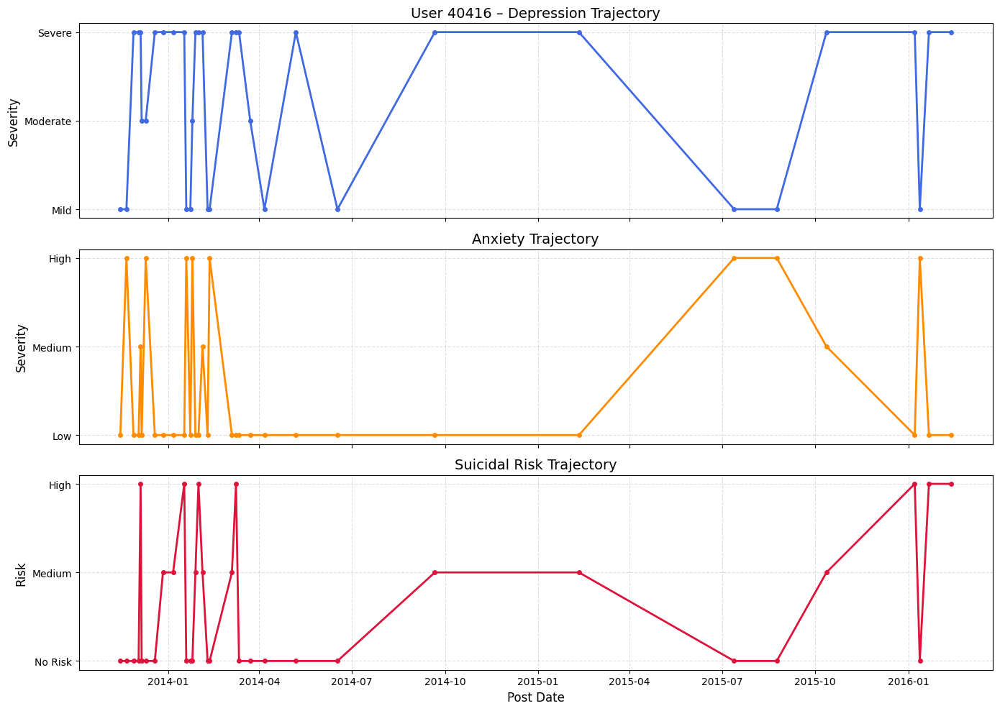

Saved PNG: /content/drive/MyDrive/Project_N/User_33966_Trajectory.png


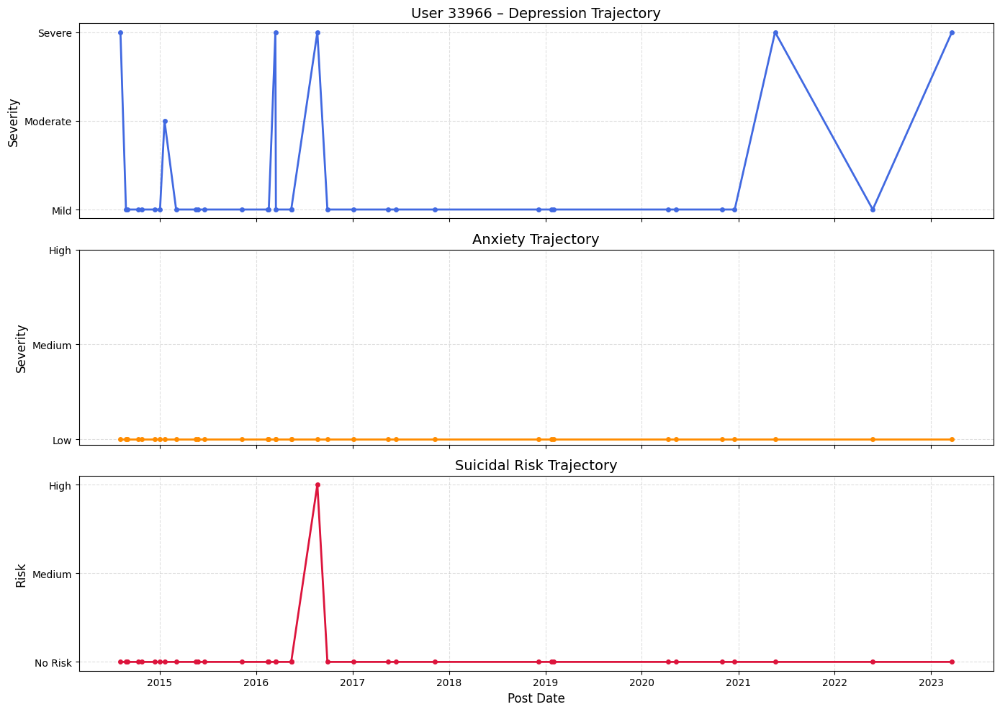

Saved PNG: /content/drive/MyDrive/Project_N/User_40276_Trajectory.png


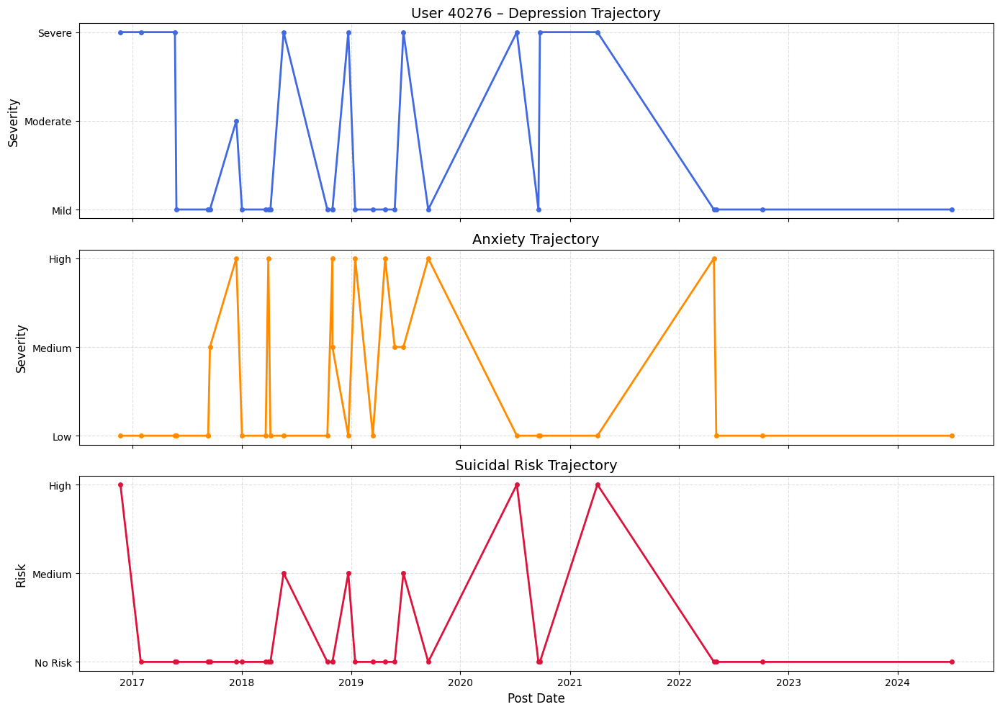

In [ ]:
# ==============================================================
# LOAD LIBRARIES
# ==============================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

# ==============================================================
# 1. LOAD DATA FROM GOOGLE DRIVE
# ==============================================================
file_path = "/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv"
df = pd.read_csv(file_path)

# Fix column names
df = df.rename(columns={
    'User ID': 'UserID',
    'Post Date': 'PostDate'
})

df['PostDate'] = pd.to_datetime(df['PostDate'], errors='coerce')
df = df.sort_values(['UserID', 'PostDate'])

# ==============================================================
# 2. IDENTIFY TOP 6 MOST ACTIVE USERS
# ==============================================================
user_post_counts = df.groupby("UserID")["Post ID"].count().reset_index()
user_post_counts = user_post_counts.rename(columns={'Post ID': 'PostCount'})

top6_users = user_post_counts.sort_values("PostCount", ascending=False).head(6)['UserID']
print("Top 6 Users:", top6_users.tolist())

# Filter only these users
df_top6 = df[df['UserID'].isin(top6_users)]

# ==============================================================
# 3. MAP LABELS TO NUMERIC SCORES
# ==============================================================
depression_map = {'mild':1, 'moderate':2, 'severe':3}
anxiety_map    = {'low':1, 'medium':2, 'high':3}
suicide_map    = {'no_risk':0, 'medium_risk':1, 'high_risk':2}

df_top6['DepressionScore'] = df_top6['Depression'].map(depression_map)
df_top6['AnxietyScore']    = df_top6['Anxiety'].map(anxiety_map)
df_top6['SuicideScore']    = df_top6['SuicidalThought'].map(suicide_map)

# ==============================================================
# 4. SAVE PNG OUTPUT LOCATION
# ==============================================================
output_dir = "/content/drive/MyDrive/Project_N/"
os.makedirs(output_dir, exist_ok=True)

# ==============================================================
# 5. TRAJECTORY PLOTS FOR TOP 6 USERS (SAVE PNG)
# ==============================================================
for u in top6_users:
    temp = df_top6[df_top6['UserID'] == u].copy()

    fig, axes = plt.subplots(3, 1, figsize=(14,10), sharex=True)

    # ----- Depression -----
    axes[0].plot(temp['PostDate'], temp['DepressionScore'], marker='o',
                 color='royalblue', linewidth=2, markersize=4)
    axes[0].set_title(f"User {u} – Depression Trajectory", fontsize=14)
    axes[0].set_ylabel("Severity", fontsize=12)
    axes[0].grid(True, linestyle='--', alpha=0.4)
    axes[0].set_yticks([1,2,3])
    axes[0].set_yticklabels(['Mild','Moderate','Severe'])

    # ----- Anxiety -----
    axes[1].plot(temp['PostDate'], temp['AnxietyScore'], marker='o',
                 color='darkorange', linewidth=2, markersize=4)
    axes[1].set_title("Anxiety Trajectory", fontsize=14)
    axes[1].set_ylabel("Severity", fontsize=12)
    axes[1].grid(True, linestyle='--', alpha=0.4)
    axes[1].set_yticks([1,2,3])
    axes[1].set_yticklabels(['Low','Medium','High'])

    # ----- Suicidal Risk -----
    axes[2].plot(temp['PostDate'], temp['SuicideScore'], marker='o',
                 color='crimson', linewidth=2, markersize=4)
    axes[2].set_title("Suicidal Risk Trajectory", fontsize=14)
    axes[2].set_ylabel("Risk", fontsize=12)
    axes[2].grid(True, linestyle='--', alpha=0.4)
    axes[2].set_yticks([0,1,2])
    axes[2].set_yticklabels(['No Risk','Medium','High'])
    axes[2].set_xlabel("Post Date", fontsize=12)

    plt.tight_layout()

    # SAVE PNG
    save_path = f"{output_dir}User_{u}_Trajectory.png"
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    print("Saved PNG:", save_path)

    plt.show()


In [ ]:
# ==============================================================
# LOAD LIBRARIES
# ==============================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ==============================================================
# 1. LOAD DATA FROM GOOGLE DRIVE
# ==============================================================
file_path = "/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv"
df = pd.read_csv(file_path)

# Fix column names
df = df.rename(columns={
    'User ID': 'UserID',
    'Post Date': 'PostDate'
})

df['PostDate'] = pd.to_datetime(df['PostDate'], errors='coerce')
df = df.sort_values(['UserID', 'PostDate'])


# ==============================================================
# 2. IDENTIFY TOP 6 MOST ACTIVE USERS
# ==============================================================
user_post_counts = df.groupby("UserID")["Post ID"].count().reset_index()
user_post_counts = user_post_counts.rename(columns={'Post ID': 'PostCount'})

top6_users = user_post_counts.sort_values("PostCount", ascending=False).head(6)['UserID']
print("Top 6 Users:", top6_users.tolist())

df_top6 = df[df['UserID'].isin(top6_users)]


# ==============================================================
# 3. MAP LABELS TO NUMERIC
# ==============================================================
depression_map = {'mild':1, 'moderate':2, 'severe':3}
anxiety_map    = {'low':1, 'medium':2, 'high':3}
suicide_map    = {'no_risk':0, 'medium_risk':1, 'high_risk':2}

df_top6['DepressionScore'] = df_top6['Depression'].map(depression_map)
df_top6['AnxietyScore']    = df_top6['Anxiety'].map(anxiety_map)
df_top6['SuicideScore']    = df_top6['SuicidalThought'].map(suicide_map)


# ==============================================================
# 4. FUNCTION: PER-USER TRANSITION PROBABILITY MATRIX
# ==============================================================

def user_transition_probabilities(sequence, num_states):
    matrix = np.zeros((num_states, num_states))

    for i in range(len(sequence)-1):
        current = sequence[i]
        nxt = sequence[i+1]
        matrix[current][nxt] += 1

    # safe divide
    row_sums = matrix.sum(axis=1, keepdims=True)
    row_sums[row_sums == 0] = 1
    matrix = matrix / row_sums

    return matrix


# ==============================================================
# 5. CALCULATE TRANSITIONS FOR EACH OF THE TOP 6 USERS
# ==============================================================

user_dep_prob = {}
user_anx_prob = {}
user_sui_prob = {}

for uid in top6_users:
    temp = df_top6[df_top6['UserID'] == uid]

    dep_seq = temp['DepressionScore'].tolist()
    anx_seq = temp['AnxietyScore'].tolist()
    sui_seq = temp['SuicideScore'].tolist()

    user_dep_prob[uid] = user_transition_probabilities(dep_seq, 4)
    user_anx_prob[uid] = user_transition_probabilities(anx_seq, 4)
    user_sui_prob[uid] = user_transition_probabilities(sui_seq, 3)


# ==============================================================
# 6. PRINT TRANSITION MATRICES CLEARLY FOR EACH USER
# ==============================================================

print("\n================ DEPRESSION TRANSITION PROBABILITIES ================\n")
for uid in top6_users:
    print(f"\n----- User {uid} -----")
    mat = pd.DataFrame(
        user_dep_prob[uid][1:4, 1:4],
        index=['mild','moderate','severe'],
        columns=['→mild','→moderate','→severe']
    )
    print(mat)


print("\n================ ANXIETY TRANSITION PROBABILITIES ================\n")
for uid in top6_users:
    print(f"\n----- User {uid} -----")
    mat = pd.DataFrame(
        user_anx_prob[uid][1:4, 1:4],
        index=['low','medium','high'],
        columns=['→low','→medium','→high']
    )
    print(mat)


print("\n================ SUICIDAL RISK TRANSITION PROBABILITIES ================\n")
for uid in top6_users:
    print(f"\n----- User {uid} -----")
    mat = pd.DataFrame(
        user_sui_prob[uid],
        index=['no_risk','medium_risk','high_risk'],
        columns=['→no_risk','→medium_risk','→high_risk']
    )
    print(mat)


print("\n\nAll per-user transition probabilities successfully generated.")


Top 6 Users: [19707, 17566, 17509, 40416, 33966, 40276]

================ DEPRESSION TRANSITION PROBABILITIES ================


----- User 19707 -----
             →mild  →moderate   →severe
mild      0.670139   0.125000  0.204861
moderate  0.678571   0.125000  0.196429
severe    0.637363   0.142857  0.219780

----- User 17566 -----
             →mild  →moderate   →severe
mild      0.307692   0.115385  0.576923
moderate  0.400000   0.300000  0.300000
severe    0.451613   0.096774  0.451613

----- User 17509 -----
             →mild  →moderate   →severe
mild      0.533333   0.200000  0.266667
moderate  0.333333   0.333333  0.333333
severe    0.428571   0.071429  0.500000

----- User 40416 -----
             →mild  →moderate   →severe
mild      0.363636   0.090909  0.545455
moderate  0.250000   0.250000  0.500000
severe    0.263158   0.105263  0.631579

----- User 33966 -----
             →mild  →moderate   →severe
mild      0.827586   0.034483  0.137931
moderate  1.000000   0.000000  0

/tmp/ipython-input-1906380362.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top6['DepressionScore'] = df_top6['Depression'].map(depression_map)
/tmp/ipython-input-1906380362.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top6['AnxietyScore']    = df_top6['Anxiety'].map(anxiety_map)
/tmp/ipython-input-1906380362.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the d

In [ ]:
# ==============================================================
# LOAD LIBRARIES
# ==============================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ==============================================================
# 1. LOAD DATA FROM GOOGLE DRIVE
# ==============================================================
file_path = "/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv"
df = pd.read_csv(file_path)

# Fix column names
df = df.rename(columns={
    'User ID': 'UserID',
    'Post Date': 'PostDate'
})

df['PostDate'] = pd.to_datetime(df['PostDate'], errors='coerce')
df = df.sort_values(['UserID', 'PostDate'])


# ==============================================================
# 2. IDENTIFY TOP 6 MOST ACTIVE USERS
# ==============================================================
user_post_counts = df.groupby("UserID")["Post ID"].count().reset_index()
user_post_counts = user_post_counts.rename(columns={'Post ID': 'PostCount'})

top6_users = user_post_counts.sort_values("PostCount", ascending=False).head(6)['UserID']
print("Top 6 Users:", top6_users.tolist())

df_top6 = df[df['UserID'].isin(top6_users)]


# ==============================================================
# 3. MAP LABELS TO NUMERIC
# ==============================================================
depression_map = {'mild':1, 'moderate':2, 'severe':3}
anxiety_map    = {'low':1, 'medium':2, 'high':3}
suicide_map    = {'no_risk':0, 'medium_risk':1, 'high_risk':2}

df_top6['DepressionScore'] = df_top6['Depression'].map(depression_map)
df_top6['AnxietyScore']    = df_top6['Anxiety'].map(anxiety_map)
df_top6['SuicideScore']    = df_top6['SuicidalThought'].map(suicide_map)


# ==============================================================
# 4. FUNCTION: PER-USER TRANSITION PROBABILITY MATRIX
# ==============================================================

def user_transition_probabilities(sequence, num_states):
    matrix = np.zeros((num_states, num_states))

    for i in range(len(sequence)-1):
        current = sequence[i]
        nxt = sequence[i+1]
        matrix[current][nxt] += 1

    # safe divide
    row_sums = matrix.sum(axis=1, keepdims=True)
    row_sums[row_sums == 0] = 1
    matrix = matrix / row_sums

    return matrix


# ==============================================================
# 5. CALCULATE TRANSITIONS FOR EACH OF THE TOP 6 USERS
# ==============================================================

user_dep_prob = {}
user_anx_prob = {}
user_sui_prob = {}

for uid in top6_users:
    temp = df_top6[df_top6['UserID'] == uid]

    dep_seq = temp['DepressionScore'].tolist()
    anx_seq = temp['AnxietyScore'].tolist()
    sui_seq = temp['SuicideScore'].tolist()

    user_dep_prob[uid] = user_transition_probabilities(dep_seq, 4)
    user_anx_prob[uid] = user_transition_probabilities(anx_seq, 4)
    user_sui_prob[uid] = user_transition_probabilities(sui_seq, 3)


# ==============================================================
# 6. PRINT TRANSITION MATRICES AS PERCENTAGES (%)
# ==============================================================

print("\n================ DEPRESSION TRANSITION PERCENTAGES ================\n")
for uid in top6_users:
    print(f"\n----- User {uid} -----")
    mat = pd.DataFrame(
        user_dep_prob[uid][1:4, 1:4] * 100,
        index=['mild','moderate','severe'],
        columns=['→mild','→moderate','→severe']
    ).round(2)
    print(mat)


print("\n================ ANXIETY TRANSITION PERCENTAGES ================\n")
for uid in top6_users:
    print(f"\n----- User {uid} -----")
    mat = pd.DataFrame(
        user_anx_prob[uid][1:4, 1:4] * 100,
        index=['low','medium','high'],
        columns=['→low','→medium','→high']
    ).round(2)
    print(mat)


print("\n================ SUICIDAL RISK TRANSITION PERCENTAGES ================\n")
for uid in top6_users:
    print(f"\n----- User {uid} -----")
    mat = pd.DataFrame(
        user_sui_prob[uid] * 100,
        index=['no_risk','medium_risk','high_risk'],
        columns=['→no_risk','→medium_risk','→high_risk']
    ).round(2)
    print(mat)


print("\n\nAll per-user transition percentage matrices successfully generated.")


Top 6 Users: [19707, 17566, 17509, 40416, 33966, 40276]

================ DEPRESSION TRANSITION PERCENTAGES ================


----- User 19707 -----
          →mild  →moderate  →severe
mild      67.01      12.50    20.49
moderate  67.86      12.50    19.64
severe    63.74      14.29    21.98

----- User 17566 -----
          →mild  →moderate  →severe
mild      30.77      11.54    57.69
moderate  40.00      30.00    30.00
severe    45.16       9.68    45.16

----- User 17509 -----
          →mild  →moderate  →severe
mild      53.33      20.00    26.67
moderate  33.33      33.33    33.33
severe    42.86       7.14    50.00

----- User 40416 -----
          →mild  →moderate  →severe
mild      36.36       9.09    54.55
moderate  25.00      25.00    50.00
severe    26.32      10.53    63.16

----- User 33966 -----
           →mild  →moderate  →severe
mild       82.76       3.45    13.79
moderate  100.00       0.00     0.00
severe    100.00       0.00     0.00

----- User 40276 -----
      

/tmp/ipython-input-127012455.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top6['DepressionScore'] = df_top6['Depression'].map(depression_map)
/tmp/ipython-input-127012455.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top6['AnxietyScore']    = df_top6['Anxiety'].map(anxiety_map)
/tmp/ipython-input-127012455.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu


====== DEPRESSION TRANSITION HEATMAPS ======



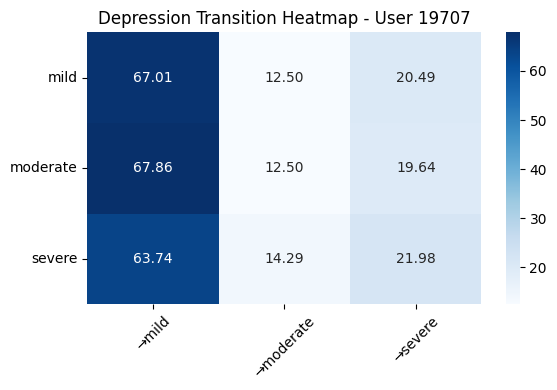

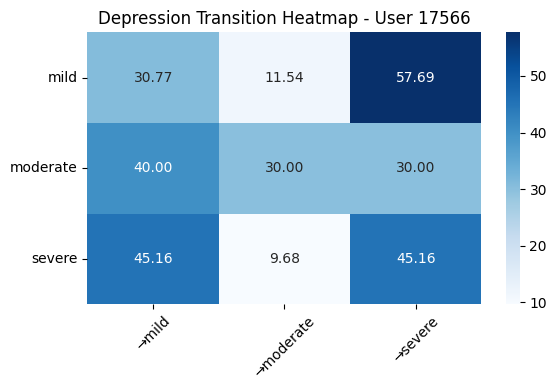

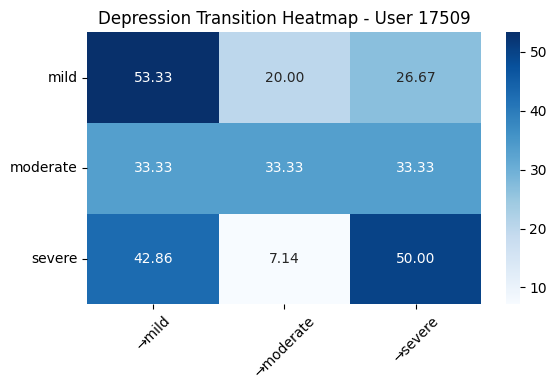

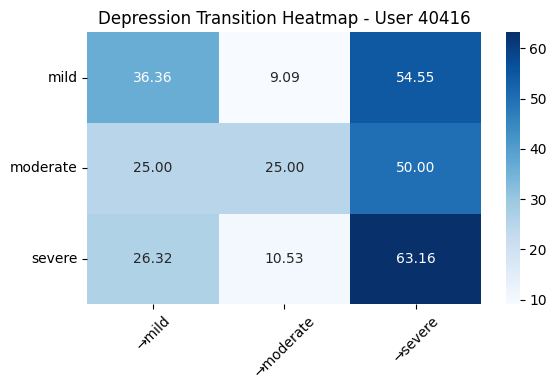

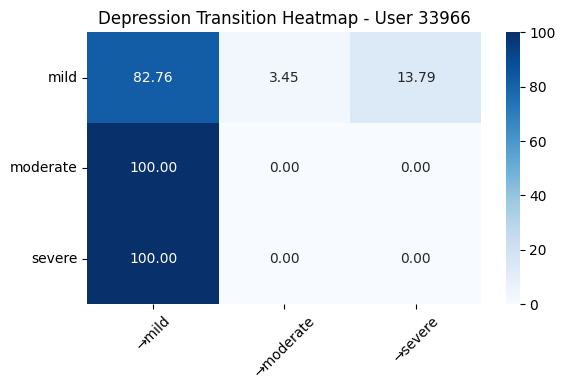

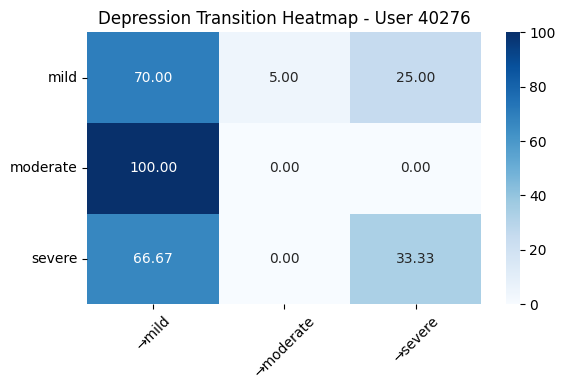


====== ANXIETY TRANSITION HEATMAPS ======



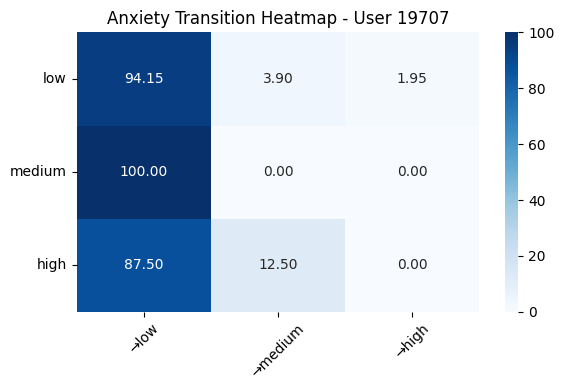

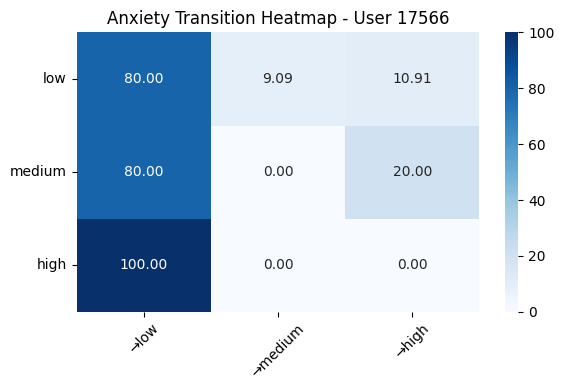

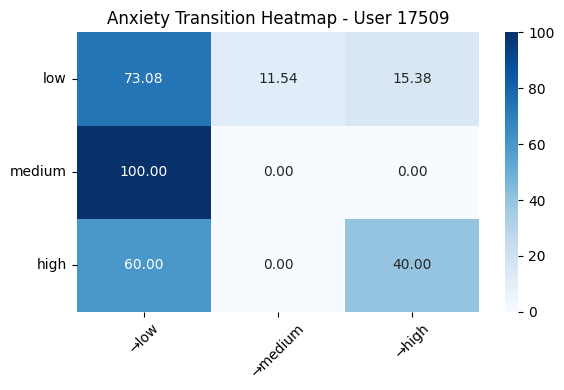

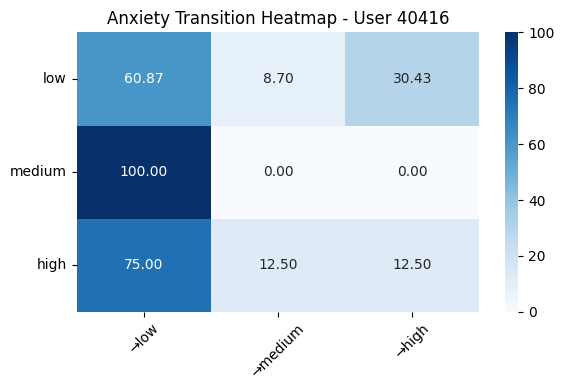

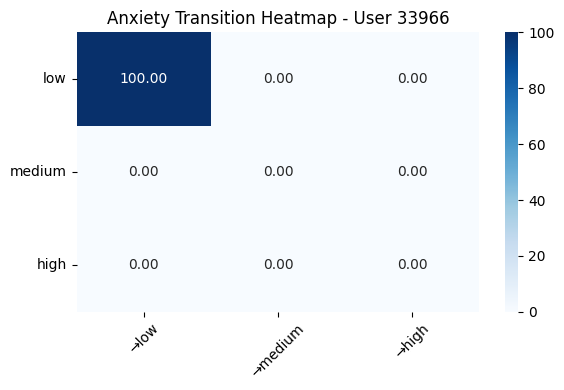

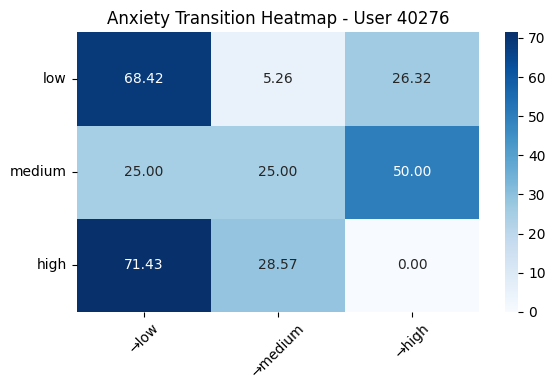


====== SUICIDAL RISK TRANSITION HEATMAPS ======



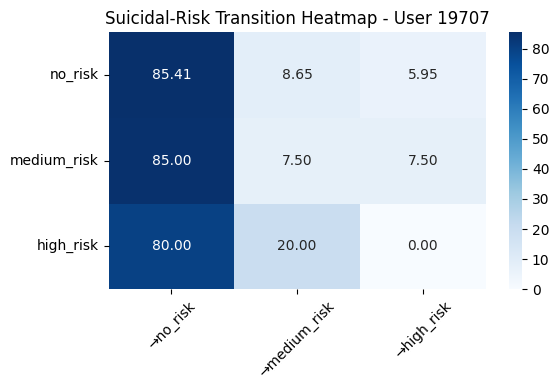

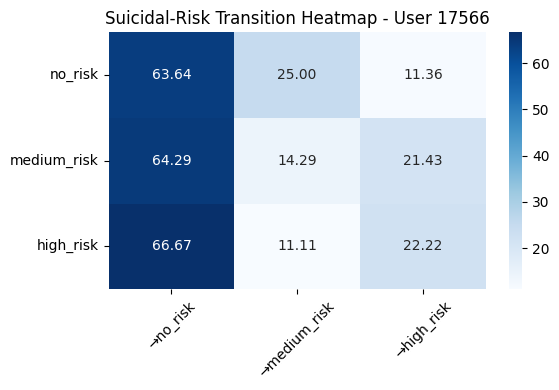

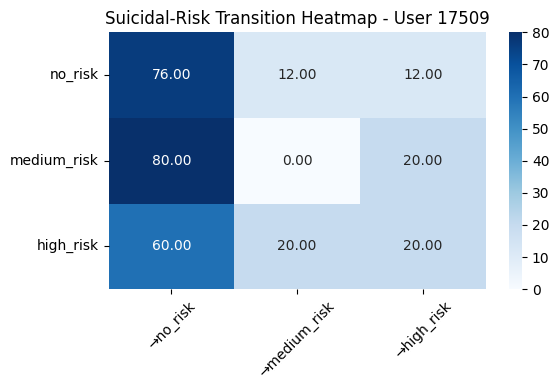

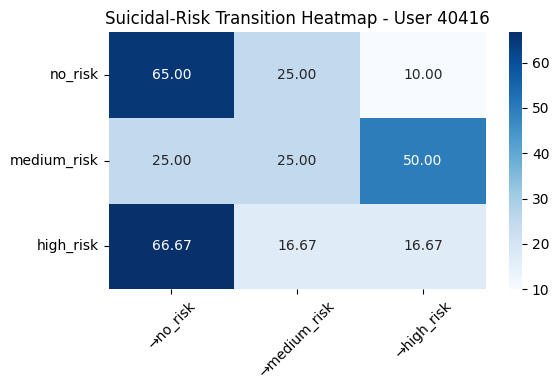

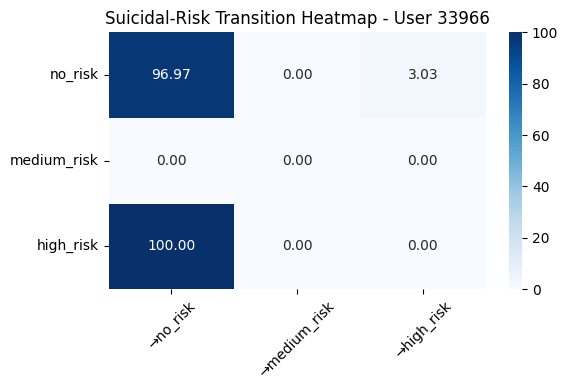

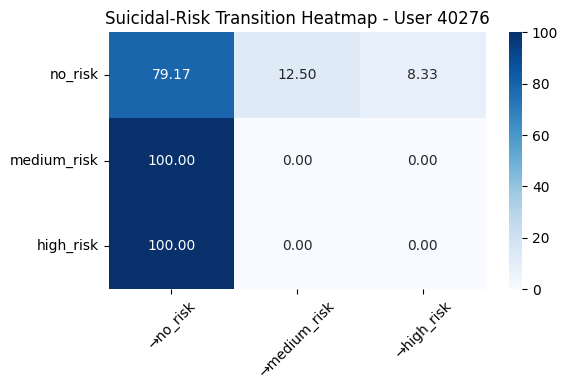

In [ ]:
# ==============================================================
# HEATMAPS FOR TRANSITION PERCENTAGES (TOP 6 USERS)
# ==============================================================

import seaborn as sns
import matplotlib.pyplot as plt

# ---------- Function to plot heatmap ----------
def plot_heatmap(matrix, title, index_labels, col_labels):
    plt.figure(figsize=(6,4))
    sns.heatmap(matrix, annot=True, cmap="Blues", fmt=".2f")
    plt.title(title)
    plt.yticks(np.arange(len(index_labels)) + 0.5, index_labels, rotation=0)
    plt.xticks(np.arange(len(col_labels)) + 0.5, col_labels, rotation=45)
    plt.tight_layout()
    plt.show()


# ==============================================================
# DEPRESSION HEATMAPS
# ==============================================================
print("\n====== DEPRESSION TRANSITION HEATMAPS ======\n")

for uid in top6_users:
    mat = pd.DataFrame(
        user_dep_prob[uid][1:4, 1:4] * 100,
        index=['mild','moderate','severe'],
        columns=['→mild','→moderate','→severe']
    )

    plot_heatmap(
        mat,
        f"Depression Transition Heatmap - User {uid}",
        ['mild','moderate','severe'],
        ['→mild','→moderate','→severe']
    )


# ==============================================================
# ANXIETY HEATMAPS
# ==============================================================
print("\n====== ANXIETY TRANSITION HEATMAPS ======\n")

for uid in top6_users:
    mat = pd.DataFrame(
        user_anx_prob[uid][1:4, 1:4] * 100,
        index=['low','medium','high'],
        columns=['→low','→medium','→high']
    )

    plot_heatmap(
        mat,
        f"Anxiety Transition Heatmap - User {uid}",
        ['low','medium','high'],
        ['→low','→medium','→high']
    )


# ==============================================================
# SUICIDAL RISK HEATMAPS
# ==============================================================
print("\n====== SUICIDAL RISK TRANSITION HEATMAPS ======\n")

for uid in top6_users:
    mat = pd.DataFrame(
        user_sui_prob[uid] * 100,
        index=['no_risk','medium_risk','high_risk'],
        columns=['→no_risk','→medium_risk','→high_risk']
    )

    plot_heatmap(
        mat,
        f"Suicidal-Risk Transition Heatmap - User {uid}",
        ['no_risk','medium_risk','high_risk'],
        ['→no_risk','→medium_risk','→high_risk']
    )


In [ ]:
# ==============================================================
# PART 2 — USER-LEVEL PATTERN CLUSTERING
# ==============================================================

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import numpy as np
import pandas as pd

# ---------------------------
# 1. Create feature vectors for each user
# ---------------------------

user_vectors = []
user_ids_list = []

for uid in top6_users:
    vec = []

    # Depression transitions (3x3 = 9 values)
    dep_mat = user_dep_prob[uid][1:4, 1:4].flatten() * 100
    vec.extend(dep_mat)

    # Anxiety transitions (3x3 = 9 values)
    anx_mat = user_anx_prob[uid][1:4, 1:4].flatten() * 100
    vec.extend(anx_mat)

    # Suicidal risk transitions (3x3 = 9 values)
    sui_mat = user_sui_prob[uid].flatten() * 100
    vec.extend(sui_mat)

    user_vectors.append(vec)
    user_ids_list.append(uid)

user_vectors = np.array(user_vectors)

# ---------------------------
# 2. Scale the features for clustering (recommended)
# ---------------------------

scaler = StandardScaler()
X_scaled = scaler.fit_transform(user_vectors)

# ---------------------------
# 3. Perform K-Means clustering
# ---------------------------

kmeans = KMeans(n_clusters=3, random_state=42)
cluster_labels = kmeans.fit_predict(X_scaled)

# ---------------------------
# 4. Show results
# ---------------------------

print("\n===== USER CLUSTER RESULTS (Top 6 Users) =====\n")
for uid, c in zip(user_ids_list, cluster_labels):
    print(f"User {uid} → Cluster {c}")

# ---------------------------
# 5. Create a DataFrame with all clustered users
# ---------------------------

cluster_df = pd.DataFrame({
    'UserID': user_ids_list,
    'Cluster': cluster_labels
})

print("\n===== CLUSTER DATAFRAME =====\n")
print(cluster_df)

# Optional: save to Drive
cluster_df.to_csv("/content/drive/MyDrive/Project_N/User_Cluster_Assignment.csv", index=False)
print("\nCluster assignments saved to Google Drive.")



===== USER CLUSTER RESULTS (Top 6 Users) =====

User 19707 → Cluster 2
User 17566 → Cluster 0
User 17509 → Cluster 0
User 40416 → Cluster 0
User 33966 → Cluster 2
User 40276 → Cluster 1

===== CLUSTER DATAFRAME =====

   UserID  Cluster
0   19707        2
1   17566        0
2   17509        0
3   40416        0
4   33966        2
5   40276        1

Cluster assignments saved to Google Drive.


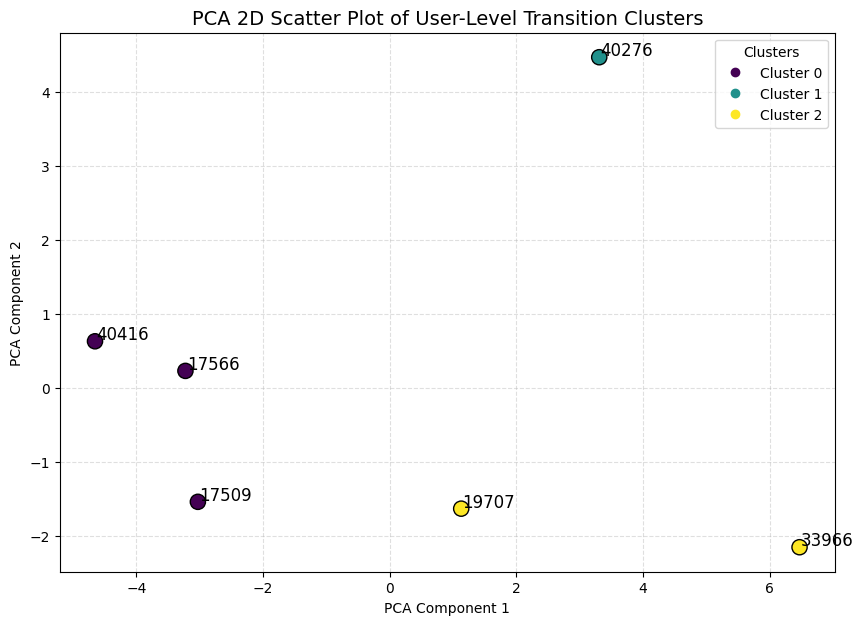

In [ ]:
# ==============================================================
# PCA 2D CLUSTER SCATTER PLOT FOR USER-LEVEL TRANSITION PATTERNS
# ==============================================================

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

# 1. Perform PCA on the scaled feature vectors
pca = PCA(n_components=2)
pca_result = pca.fit_transform(X_scaled)

# 2. Extract PCA components
pca_x = pca_result[:, 0]
pca_y = pca_result[:, 1]

# 3. Create scatter plot
plt.figure(figsize=(10, 7))

scatter = plt.scatter(pca_x, pca_y,
                      c=cluster_labels,
                      cmap='viridis',
                      s=120,
                      edgecolors='black')

# 4. Add User ID labels on each point
for i, uid in enumerate(user_ids_list):
    plt.text(pca_x[i] + 0.02, pca_y[i] + 0.02, str(uid), fontsize=12)

# 5. Add plot formatting
plt.title("PCA 2D Scatter Plot of User-Level Transition Clusters", fontsize=14)
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.grid(True, linestyle="--", alpha=0.4)

# Legend using cluster labels
handles, _ = scatter.legend_elements()
plt.legend(handles, [f"Cluster {i}" for i in range(3)], title="Clusters")

plt.show()


In [ ]:
print("User vectors:\n", user_vectors)
print("\nCluster labels:", cluster_labels)


User vectors:
 [[ 67.01388889  12.5         20.48611111  67.85714286  12.5
   19.64285714  63.73626374  14.28571429  21.97802198  94.14634146
    3.90243902   1.95121951 100.           0.           0.
   87.5         12.5          0.          85.40540541   8.64864865
    5.94594595  85.           7.5          7.5         80.
   20.           0.        ]
 [ 30.76923077  11.53846154  57.69230769  40.          30.
   30.          45.16129032   9.67741935  45.16129032  80.
    9.09090909  10.90909091  80.           0.          20.
  100.           0.           0.          63.63636364  25.
   11.36363636  64.28571429  14.28571429  21.42857143  66.66666667
   11.11111111  22.22222222]
 [ 53.33333333  20.          26.66666667  33.33333333  33.33333333
   33.33333333  42.85714286   7.14285714  50.          73.07692308
   11.53846154  15.38461538 100.           0.           0.
   60.           0.          40.          76.          12.
   12.          80.           0.          20.          60.
 

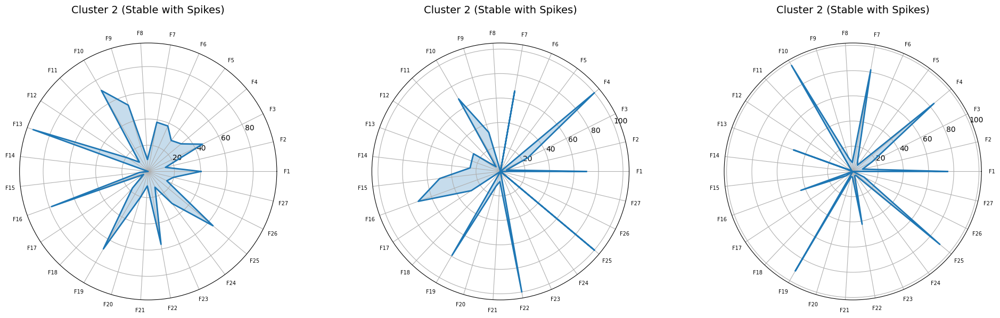

In [ ]:
# ==============================================================
# RADAR CHARTS FOR EACH CLUSTER (27 FEATURES)
# ==============================================================

import numpy as np
import matplotlib.pyplot as plt
from math import pi

# Convert user_vectors + cluster_labels into cluster means
cluster_ids = np.unique(cluster_labels)
cluster_means = []

for cid in cluster_ids:
    cluster_means.append(user_vectors[np.where(cluster_labels == cid)].mean(axis=0))

cluster_means = np.array(cluster_means)

# Feature count
N = cluster_means.shape[1]

# Angles for radar chart
angles = np.linspace(0, 2 * np.pi, N, endpoint=False).tolist()
angles += angles[:1]  # loop back

feature_labels = [f"F{i+1}" for i in range(N)]  # optional label

# Create radar plots
fig, axs = plt.subplots(1, 3, figsize=(20, 6), subplot_kw=dict(polar=True))
titles = ["Cluster 0 (Volatile Users)", "Cluster 1 (Highly Stable)", "Cluster 2 (Stable with Spikes)"]

for i, ax in enumerate(axs):
    values = cluster_means[i].tolist()
    values += values[:1]  # loop

    ax.plot(angles, values, linewidth=2)
    ax.fill(angles, values, alpha=0.25)
    #ax.set_title(titles[i], size=14)
    ax.set_title(titles[idx], fontsize=14, y=1.10)
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(feature_labels, fontsize=7)

plt.tight_layout()
plt.show()


In [ ]:
# ==============================================================
# RISK INDEX SCORE FOR EACH TOP-6 USER
# ==============================================================

def compute_risk_index(matrix_dep, matrix_anx, matrix_sui):
    # Escalation transitions: moving to higher severity
    escalation = (
        matrix_dep[1,2] + matrix_dep[0,1] + matrix_dep[0,2] +
        matrix_anx[1,2] + matrix_anx[0,1] + matrix_anx[0,2] +
        matrix_sui[1,2] + matrix_sui[0,1] + matrix_sui[0,2]
    )

    # Recovery transitions (inverse risk)
    recovery = (
        matrix_dep[2,1] + matrix_dep[2,0] + matrix_dep[1,0] +
        matrix_anx[2,1] + matrix_anx[2,0] + matrix_anx[1,0] +
        matrix_sui[2,1] + matrix_sui[2,0] + matrix_sui[1,0]
    )

    # Volatility = total transitions happening (non-zero)
    volatility = (matrix_dep.sum() + matrix_anx.sum() + matrix_sui.sum())

    # Normalised Risk Index
    risk_score = 0.5*escalation + 0.3*volatility - 0.2*recovery
    return risk_score

risk_scores = {}

for i, uid in enumerate(user_ids_list):
    dep_mat = user_dep_prob[uid][1:4,1:4]
    anx_mat = user_anx_prob[uid][1:4,1:4]
    sui_mat = user_sui_prob[uid]

    risk_scores[uid] = compute_risk_index(dep_mat, anx_mat, sui_mat)

risk_scores


{19707: np.float64(2.041127865167499),
 17566: np.float64(2.851310481633062),
 17509: np.float64(2.647948717948718),
 40416: np.float64(3.173483114901879),
 33966: np.float64(1.301358411703239),
 40276: np.float64(2.378728070175438)}

### Network modeling

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

file_path = "/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv"
df = pd.read_csv(file_path)


In [ ]:
emotion_cols = [
    'sadness','fear','anger','joy','disgust','surprise','nervousness','disappointment',
    'remorse','confusion','grief','embarrassment','optimism','love','curiosity','desire',
    'admiration','amusement','relief','pride','gratitude','approval','realization',
    'caring','annoyance','disapproval','excitement','neutral'
]

df_emotions = df[emotion_cols]
df_emotions.head()

# Compute correlation matrix (NEM version)
corr_matrix = df_emotions.corr()


Visualize Co-Occurrence Heatmap

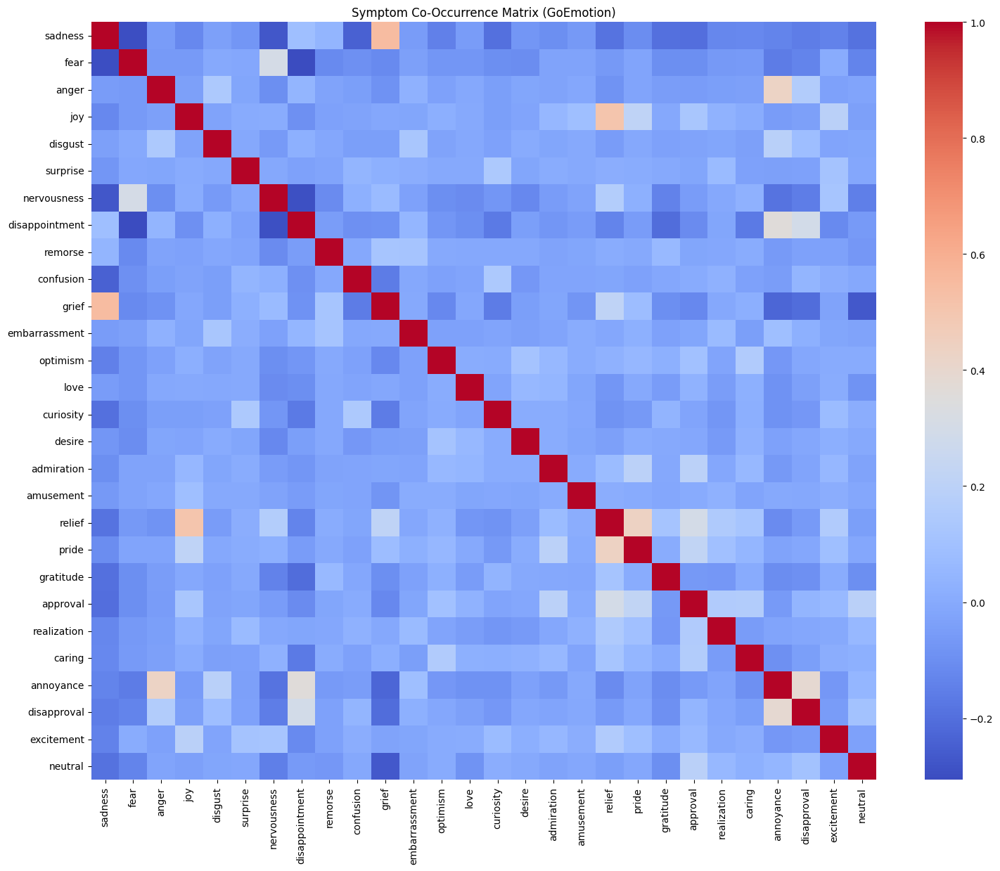

In [ ]:
plt.figure(figsize=(18, 14))
sns.heatmap(corr_matrix, cmap="coolwarm", annot=False)
plt.title("Symptom Co-Occurrence Matrix (GoEmotion)")
plt.show()


In [ ]:
import networkx as nx

# Create graph
G = nx.Graph()

# Add nodes
for col in emotion_cols:
    G.add_node(col)

# Add edges for correlations above threshold
threshold = 0.20   # keep only meaningful connections

for i in range(len(emotion_cols)):
    for j in range(i+1, len(emotion_cols)):
        corr_value = corr_matrix.iloc[i, j]
        if abs(corr_value) > threshold:
            # Use absolute value of correlation as weight to ensure non-negative values
            G.add_edge(emotion_cols[i], emotion_cols[j], weight=abs(corr_value))

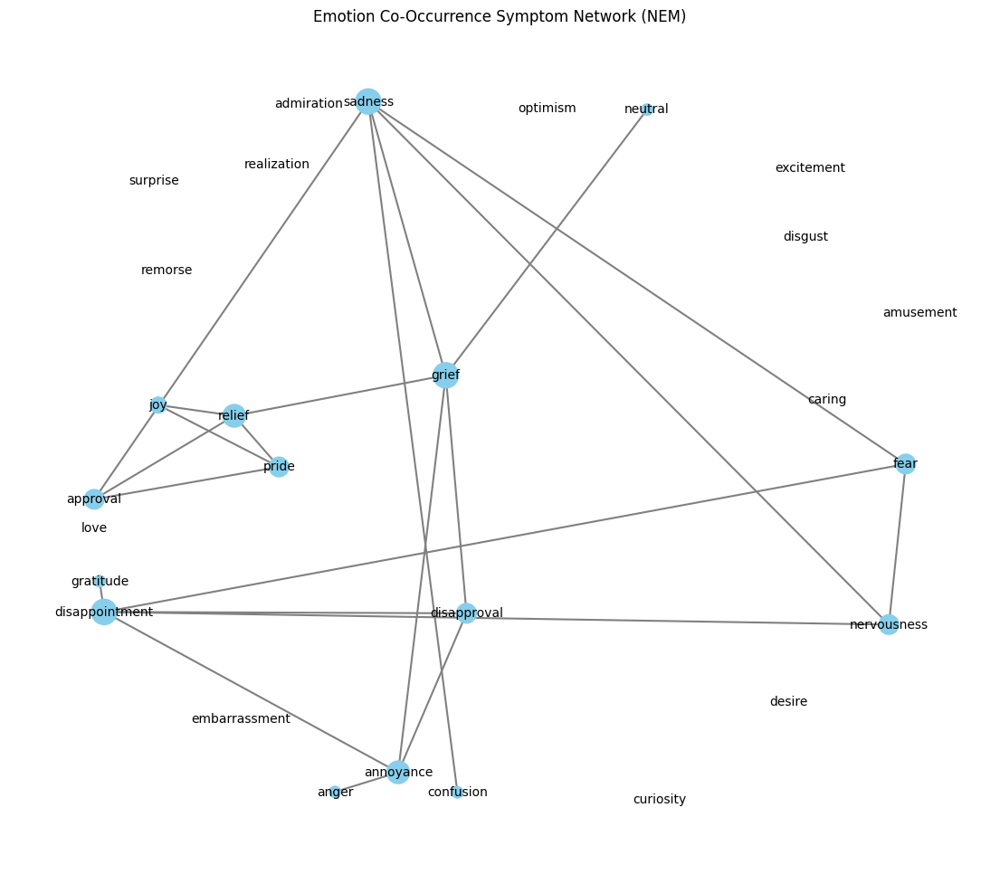

In [ ]:
plt.figure(figsize=(14, 12))

pos = nx.spring_layout(G, k=0.45, seed=42)

# Node centrality controls node size
centrality = nx.degree_centrality(G)
node_sizes = [v * 2200 for v in centrality.values()]

# Draw network
nx.draw_networkx(
    G,
    pos,
    node_color='skyblue',
    node_size=node_sizes,
    edge_color='gray',
    width=1.5,
    with_labels=True,
    font_size=10
)

plt.title("Emotion Co-Occurrence Symptom Network (NEM)")
plt.axis('off')
plt.show()


In [ ]:
pos = nx.kamada_kawai_layout(G)
# Alternative:
# pos = nx.spring_layout(G, k=0.7, iterations=50, seed=42)


In [ ]:
degree_cent = nx.degree_centrality(G)
node_sizes = [degree_cent[n] * 3000 for n in G.nodes()]
node_colors = [degree_cent[n] for n in G.nodes()]


In [ ]:
edge_widths = [abs(G[u][v]['weight']) * 5 for u, v in G.edges()]


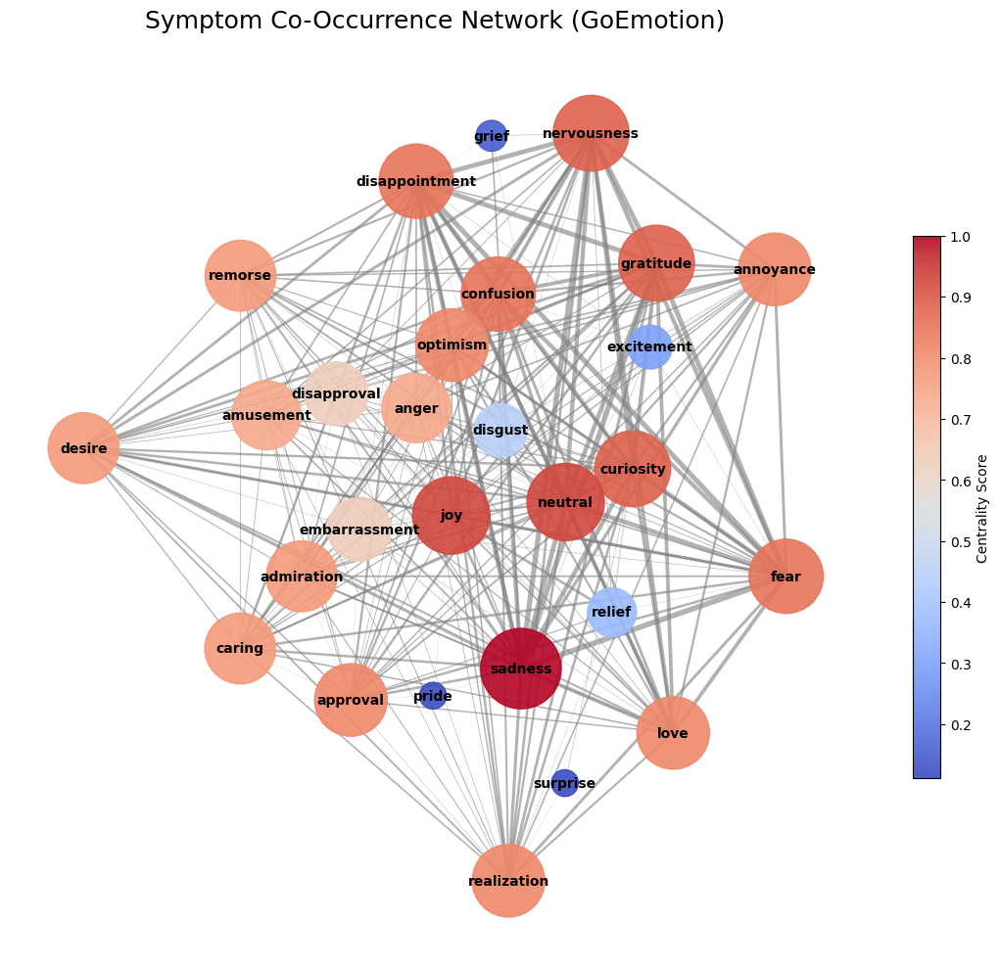

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx

plt.figure(figsize=(14, 12))

# Layout (beautiful)
pos = nx.kamada_kawai_layout(G)

# Node centrality for size & color
degree_cent = nx.degree_centrality(G)
node_sizes = [degree_cent[n] * 3500 for n in G.nodes()]
node_colors = [degree_cent[n] for n in G.nodes()]

# Edge width from correlation
edge_widths = [abs(G[u][v]['weight']) * 5 for u, v in G.edges()]

# Draw edges
nx.draw_networkx_edges(
    G,
    pos,
    width=edge_widths,
    alpha=0.6,
    edge_color="gray"
)

# Draw nodes
nodes = nx.draw_networkx_nodes(
    G,
    pos,
    node_size=node_sizes,
    node_color=node_colors,
    cmap="coolwarm",
    alpha=0.9
)

# Add labels
nx.draw_networkx_labels(
    G,
    pos,
    font_size=10,
    font_weight="bold"
)

# Title
plt.title("Symptom Co-Occurrence Network (GoEmotion)", fontsize=18, pad=20)

# Colorbar
# sm = plt.cm.ScalarMappable(cmap="coolwarm")
# sm.set_array([])
plt.colorbar(nodes, shrink=0.6, label="Centrality Score") # Changed sm to nodes

plt.axis("off")
plt.show()

/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:185: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_graph_lasso.py:140: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.3022049158873273e-08, tolerance: 1.6690574197125532e-10
  coefs, _, _, _ = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_graph_lasso.py:140: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.1881659283015378e-06, tolerance: 3.920391798135993e-10
  coefs, _, _, _ = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_graph_lasso.py:140: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.447248299648207e-07, tolerance: 

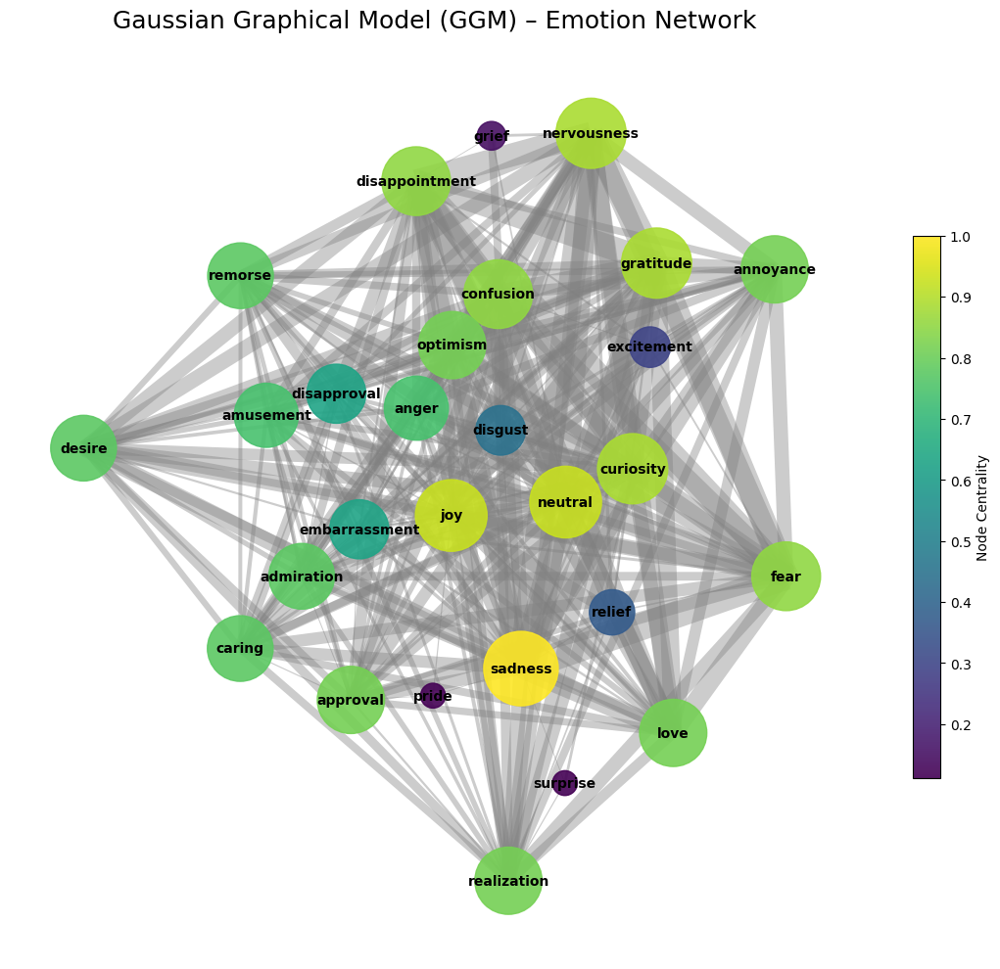

GGM Emotion Network successfully generated!


In [ ]:
# ==============================================================
# OBJECTIVE 3: Gaussian Graphical Model (GGM) Symptom Network
# ==============================================================

# 1. IMPORT LIBRARIES
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
from sklearn.covariance import GraphicalLassoCV

# ==============================================================
# 2. LOAD DATA
# ==============================================================

file_path = "/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv"
df = pd.read_csv(file_path)

# ==============================================================
# 3. SELECT EMOTION FEATURES (GOEMOTION)
# ==============================================================

emotion_cols = [
    'sadness','fear','anger','joy','disgust','surprise','nervousness','disappointment',
    'remorse','confusion','grief','embarrassment','optimism','love','curiosity','desire',
    'admiration','amusement','relief','pride','gratitude','approval','realization',
    'caring','annoyance','disapproval','excitement','neutral'
]

data = df[emotion_cols].dropna()

# ==============================================================
# 4. FIT GAUSSIAN GRAPHICAL MODEL (GRAPHICAL LASSO)
# ==============================================================

model = GraphicalLassoCV()
model.fit(data)

# Precision matrix → partial correlations
precision = model.precision_
d = np.sqrt(np.diag(precision))
partial_corr = -precision / np.outer(d, d)
np.fill_diagonal(partial_corr, 1)

# Handle potential NaNs in partial_corr before using for graph construction
if np.isnan(partial_corr).any():
    print("Warning: partial_corr contains NaN values. Replacing with 0.")
    partial_corr = np.nan_to_num(partial_corr)

# ==============================================================
# 5. BUILD NETWORK USING PARTIAL CORRELATIONS
# ==============================================================

G = nx.Graph()
threshold = 0.02  # keep only meaningful edges

for i, var1 in enumerate(emotion_cols):
    for j, var2 in enumerate(emotion_cols):
        if i < j:
            value = partial_corr[i, j]
            if abs(value) > threshold:
                # Use absolute value for weight to avoid negative weights in layout algorithms
                G.add_edge(var1, var2, weight=abs(value))

# ==============================================================
# 6. VISUALIZE GGM NETWORK (PROFESSIONAL STYLE)
# ==============================================================

plt.figure(figsize=(14, 12))

# Best psychological layout
pos = nx.kamada_kawai_layout(G)

# Node centrality → size & color
centrality = nx.degree_centrality(G)
node_sizes = [centrality[n] * 3000 for n in G.nodes()]
node_colors = [centrality[n] for n in G.nodes()]

# Edge width → partial correlation strength
edge_widths = [abs(G[u][v]['weight']) * 25 for u, v in G.edges()]

# Draw edges
nx.draw_networkx_edges(
    G,
    pos,
    width=edge_widths,
    alpha=0.4,
    edge_color="gray"
)

# Draw nodes
nodes = nx.draw_networkx_nodes(
    G,
    pos,
    node_size=node_sizes,
    node_color=node_colors,
    cmap="viridis",
    alpha=0.9
)

# Draw labels
nx.draw_networkx_labels(
    G,
    pos,
    font_size=10,
    font_weight="bold"
)

plt.title("Gaussian Graphical Model (GGM) – Emotion Network", fontsize=18, pad=20)

# Add colorbar
# The previous error was because plt.colorbar() needs a mappable object that is part of an axes.
# 'nodes' (the PathCollection from nx.draw_networkx_nodes) is such an object.
# 'sm' was just a ScalarMappable created without a direct link to the plot elements.
plt.colorbar(nodes, shrink=0.6, label="Node Centrality")

plt.axis("off")
plt.show()

# ==============================================================
print("GGM Emotion Network successfully generated!")

In [ ]:
# ==============================================================
# FULL EMOTION CORRELATION NETWORK (All 28 GoEmotions)
# ==============================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx

# Load data
file_path = "/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv"
df = pd.read_csv(file_path)

# Use ALL emotion columns
emotion_cols = [
    'sadness','fear','anger','joy','disgust','surprise','nervousness','disappointment',
    'remorse','confusion','grief','embarrassment','optimism','love','curiosity','desire',
    'admiration','amusement','relief','pride','gratitude','approval','realization',
    'caring','annoyance','disapproval','excitement','neutral'
]

data = df[emotion_cols].dropna()

# Compute correlations
corr = data.corr()

# Build graph
G = nx.Graph()
threshold = 0.20   # good threshold for many emotions

for i in range(len(emotion_cols)):
    for j in range(i+1, len(emotion_cols)):
        value = corr.iloc[i, j]
        if abs(value) > threshold:
            G.add_edge(emotion_cols[i], emotion_cols[j], weight=value)

# Community detection
!pip install python-louvain
import community.community_louvain as community_louvain
partition = community_louvain.best_partition(G)
node_colors = [partition[n] for n in G.nodes()]

# Draw network
plt.figure(figsize=(16, 14))
pos = nx.kamada_kawai_layout(G)

nx.draw_networkx_edges(G, pos,
                       width=[abs(G[u][v]['weight'])*4 for u,v in G.edges()],
                       edge_color='gray',
                       alpha=0.5)

nx.draw_networkx_nodes(G, pos,
                       node_size=2300,
                       node_color=node_colors,
                       cmap='tab20',
                       alpha=0.95)

nx.draw_networkx_labels(G, pos,
                        font_size=10,
                        font_weight='bold')

plt.title("Correlation Network (All GoEmotion Features)", fontsize=20)
plt.axis("off")
plt.show()

print("Correlation Network using ALL emotions completed.")


ValueError: Bad node degree (-0.47166002501145743)

In [ ]:
# ==============================================================
# CLEAN & PROFESSIONAL GGM NETWORK
# ==============================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
from sklearn.covariance import GraphicalLassoCV
import community as co # Louvain community detection - standard alias

# --------------------------------------------------------------
# 1. Load data
# --------------------------------------------------------------
file_path = "/content/drive/My Drive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv"
df = pd.read_csv(file_path)

emotion_cols = [
    'sadness','fear','anger','joy','disgust','surprise','nervousness','disappointment',
    'remorse','confusion','grief','embarrassment','optimism','love','curiosity','desire',
    'admiration','amusement','relief','pride','gratitude','approval','realization',
    'caring','annoyance','disapproval','excitement','neutral'
]

data = df[emotion_cols].dropna()

# --------------------------------------------------------------
# 2. Fit Gaussian Graphical Model (GGM)
# --------------------------------------------------------------
model = GraphicalLassoCV()
model.fit(data)

precision = model.precision_
d = np.sqrt(np.diag(precision))
partial_corr = -precision / np.outer(d, d)
np.fill_diagonal(partial_corr, 1)

# --------------------------------------------------------------
# 3. Build a sparse network (keep strongest edges only)
# --------------------------------------------------------------
G = nx.Graph()

# Higher threshold = fewer edges = clearer graph
threshold = 0.08

for i, var1 in enumerate(emotion_cols):
    for j, var2 in enumerate(emotion_cols):
        if i < j:
            value = partial_corr[i, j]
            if abs(value) > threshold:
                # Use absolute value for weight to ensure non-negative values for community detection
                G.add_edge(var1, var2, weight=abs(value))

# --------------------------------------------------------------
# 4. Community detection (Louvain)
# --------------------------------------------------------------
partition = co.best_partition(G)
communities = list(set(partition.values()))

# Assign colors by community
node_colors = [partition[n] for n in G.nodes()]

# --------------------------------------------------------------
# 5. Node centrality for size
# --------------------------------------------------------------
centrality = nx.degree_centrality(G)
node_sizes = [centrality[n] * 3000 for n in G.nodes()]

# --------------------------------------------------------------
# 6. Layout (kamada-kawai = best clarity)
# --------------------------------------------------------------
pos = nx.kamada_kawai_layout(G)

# --------------------------------------------------------------
# 7. Draw clean graph
# --------------------------------------------------------------
plt.figure(figsize=(16, 14))

nx.draw_networkx_edges(
    G, pos,
    width=[G[u][v]['weight']*8 for u,v in G.edges()], # Use stored positive weight
    alpha=0.4,
    edge_color="gray"
)

nx.draw_networkx_nodes(
    G, pos,
    node_size=node_sizes,
    node_color=node_colors,
    cmap="tab20",
    alpha=0.95
)

nx.draw_networkx_labels(
    G, pos,
    font_size=10,
    font_weight="bold"
)

plt.title("Clean Gaussian Graphical Model (GGM) – Emotion Network", fontsize=20)
plt.axis("off")
plt.show()

/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:185: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_graph_lasso.py:140: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.3022049158873273e-08, tolerance: 1.6690574197125532e-10
  coefs, _, _, _ = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_graph_lasso.py:140: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.1881659283015378e-06, tolerance: 3.920391798135993e-10
  coefs, _, _, _ = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_graph_lasso.py:140: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.447248299648207e-07, tolerance: 

AttributeError: module 'community' has no attribute 'best_partition'

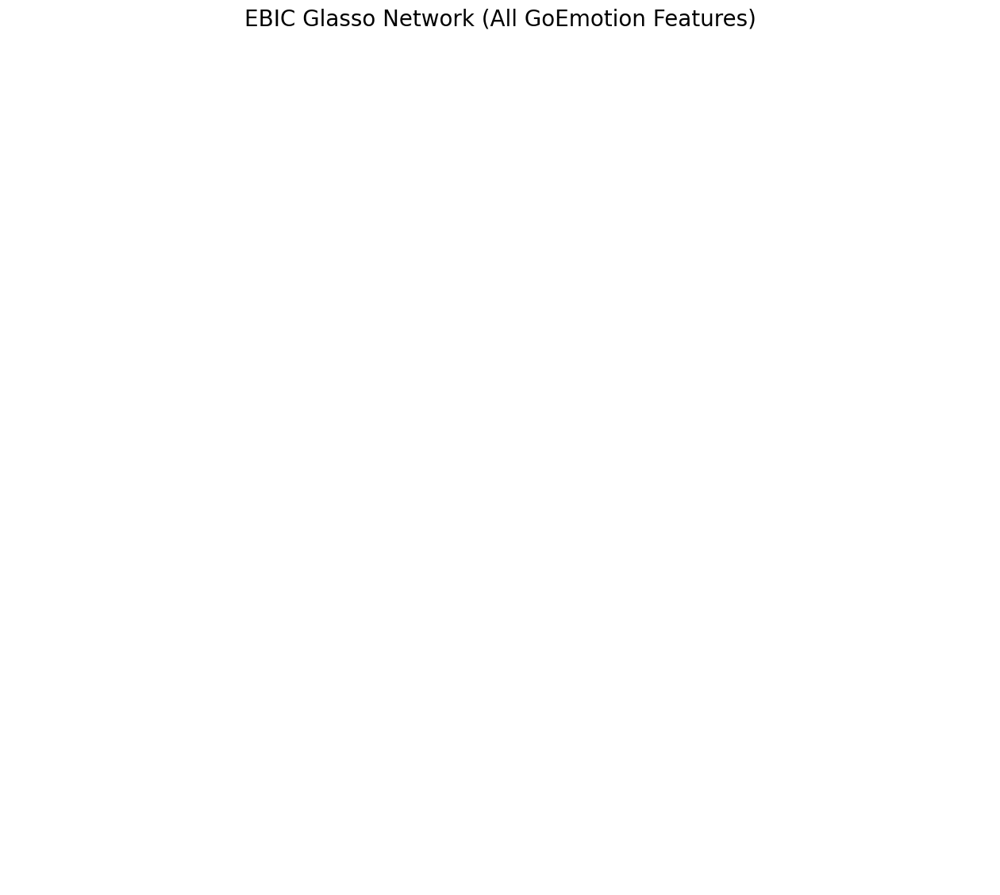

In [ ]:
# ==============================================================
# EBIC GLASSO NETWORK (Python Implementation)
# ==============================================================

# 1. Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
from sklearn.covariance import GraphicalLasso
!pip install python-louvain
import community.community_louvain as community_louvain

# --------------------------------------------------------------
# 2. Load Data
# --------------------------------------------------------------
file_path = "/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv"
df = pd.read_csv(file_path)

# ALL 28 GoEmotion features
emotion_cols = [
    'sadness','fear','anger','joy','disgust','surprise','nervousness','disappointment',
    'remorse','confusion','grief','embarrassment','optimism','love','curiosity','desire',
    'admiration','amusement','relief','pride','gratitude','approval','realization',
    'caring','annoyance','disapproval','excitement','neutral'
]

X = df[emotion_cols].dropna().values

# --------------------------------------------------------------
# 3. EBIC GLASSO Function
# --------------------------------------------------------------
def ebic_glasso(X, gammas=[0.25, 0.5, 0.75]):
    S = np.cov(X.T)
    n, p = X.shape

    best_score = np.inf
    best_precision = None

    for gamma in gammas:
        model = GraphicalLasso(alpha=gamma, max_iter=300)
        model.fit(X)

        precision = model.precision_
        k = np.sum(precision != 0)

        log_like = n * (np.log(np.linalg.det(precision)) - np.trace(S @ precision))
        bic = -2 * log_like + k * np.log(n) + 4 * gamma * k * np.log(p)

        if bic < best_score:
            best_score = bic
            best_precision = precision

    return best_precision

precision = ebic_glasso(X)

# --------------------------------------------------------------
# 4. Partial Correlation Matrix
# --------------------------------------------------------------
d = np.sqrt(np.diag(precision))
pcor = -precision / np.outer(d, d)
np.fill_diagonal(pcor, 1)

# --------------------------------------------------------------
# 5. Build Network with Threshold
# --------------------------------------------------------------
G = nx.Graph()
threshold = 0.03   # good for all emotions

for i, v1 in enumerate(emotion_cols):
    for j, v2 in enumerate(emotion_cols):
        if i < j and abs(pcor[i, j]) > threshold:
            G.add_edge(v1, v2, weight=pcor[i, j])

# --------------------------------------------------------------
# 6. Community Detection (Louvain)
# --------------------------------------------------------------
partition = community_louvain.best_partition(G)
node_colors = [partition[n] for n in G.nodes()]

# --------------------------------------------------------------
# 7. Plot Network
# --------------------------------------------------------------
plt.figure(figsize=(16, 14))
pos = nx.kamada_kawai_layout(G)

nx.draw_networkx_edges(
    G, pos,
    width=[abs(G[u][v]['weight']) * 8 for u, v in G.edges()],
    alpha=0.4, edge_color="gray"
)

nx.draw_networkx_nodes(
    G, pos,
    node_size=2600,
    node_color=node_colors,
    cmap="tab20",
    alpha=0.95
)

nx.draw_networkx_labels(G, pos, font_size=10, font_weight="bold")

plt.title("EBIC Glasso Network (All GoEmotion Features)", fontsize=20)
plt.axis("off")
plt.show()


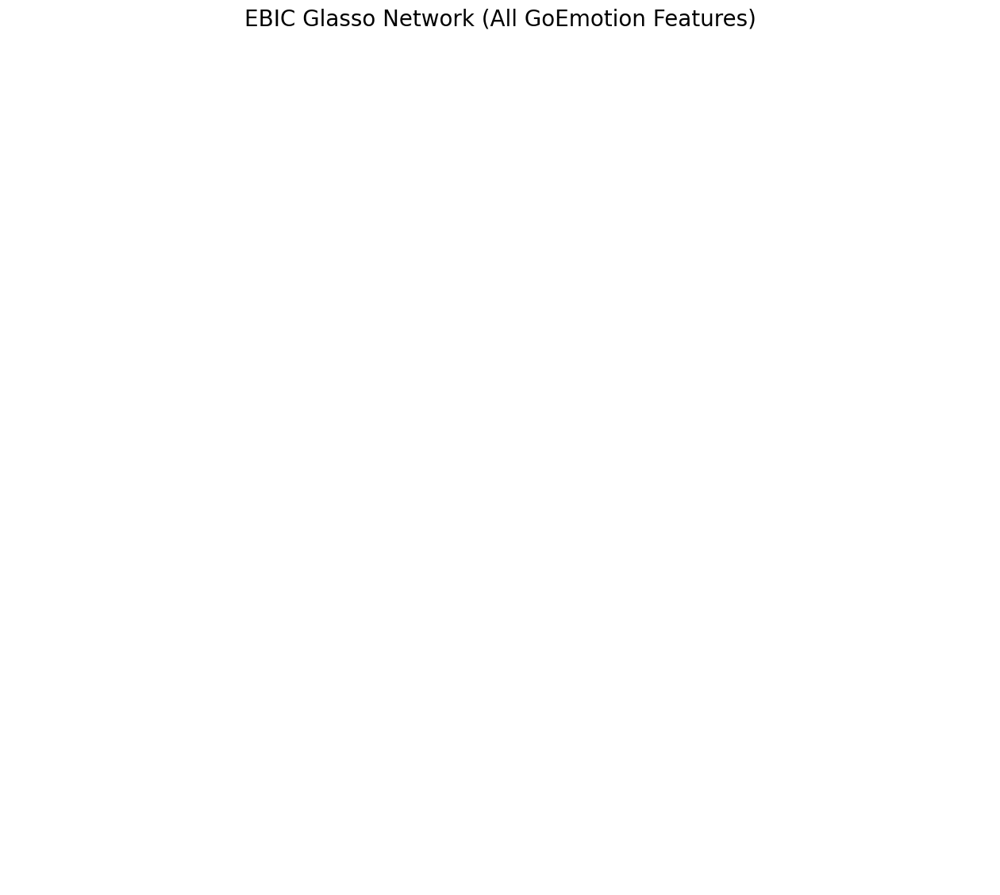

In [ ]:
# ==============================================================
# EBIC GLASSO NETWORK (Python Implementation)
# ==============================================================

# 1. Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
from sklearn.covariance import GraphicalLasso
!pip install python-louvain
import community.community_louvain as community_louvain

# --------------------------------------------------------------
# 2. Load Data
# --------------------------------------------------------------
file_path = "/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv"
df = pd.read_csv(file_path)

# ALL 28 GoEmotion features
emotion_cols = [
    'sadness','fear','anger','joy','disgust','surprise','nervousness','disappointment',
    'remorse','confusion','grief','embarrassment','optimism','love','curiosity','desire',
    'admiration','amusement','relief','pride','gratitude','approval','realization',
    'caring','annoyance','disapproval','excitement','neutral'
]

X = df[emotion_cols].dropna().values

# --------------------------------------------------------------
# 3. EBIC GLASSO Function
# --------------------------------------------------------------
def ebic_glasso(X, gammas=[0.25, 0.5, 0.75]):
    S = np.cov(X.T)
    n, p = X.shape

    best_score = np.inf
    best_precision = None

    for gamma in gammas:
        model = GraphicalLasso(alpha=gamma, max_iter=300)
        model.fit(X)

        precision = model.precision_
        k = np.sum(precision != 0)

        log_like = n * (np.log(np.linalg.det(precision)) - np.trace(S @ precision))
        bic = -2 * log_like + k * np.log(n) + 4 * gamma * k * np.log(p)

        if bic < best_score:
            best_score = bic
            best_precision = precision

    return best_precision

precision = ebic_glasso(X)

# --------------------------------------------------------------
# 4. Partial Correlation Matrix
# --------------------------------------------------------------
d = np.sqrt(np.diag(precision))
pcor = -precision / np.outer(d, d)
np.fill_diagonal(pcor, 1)

# --------------------------------------------------------------
# 5. Build Network with Threshold
# --------------------------------------------------------------
G = nx.Graph()
threshold = 0.03   # good for all emotions

for i, v1 in enumerate(emotion_cols):
    for j, v2 in enumerate(emotion_cols):
        if i < j and abs(pcor[i, j]) > threshold:
            G.add_edge(v1, v2, weight=pcor[i, j])

# --------------------------------------------------------------
# 6. Community Detection (Louvain)
# --------------------------------------------------------------
partition = community_louvain.best_partition(G)
node_colors = [partition[n] for n in G.nodes()]

# --------------------------------------------------------------
# 7. Plot Network
# --------------------------------------------------------------
plt.figure(figsize=(16, 14))
pos = nx.kamada_kawai_layout(G)

nx.draw_networkx_edges(
    G, pos,
    width=[abs(G[u][v]['weight']) * 8 for u, v in G.edges()],
    alpha=0.4, edge_color="gray"
)

nx.draw_networkx_nodes(
    G, pos,
    node_size=2600,
    node_color=node_colors,
    cmap="tab20",
    alpha=0.95
)

nx.draw_networkx_labels(G, pos, font_size=10, font_weight="bold")

plt.title("EBIC Glasso Network (All GoEmotion Features)", fontsize=20)
plt.axis("off")
plt.show()


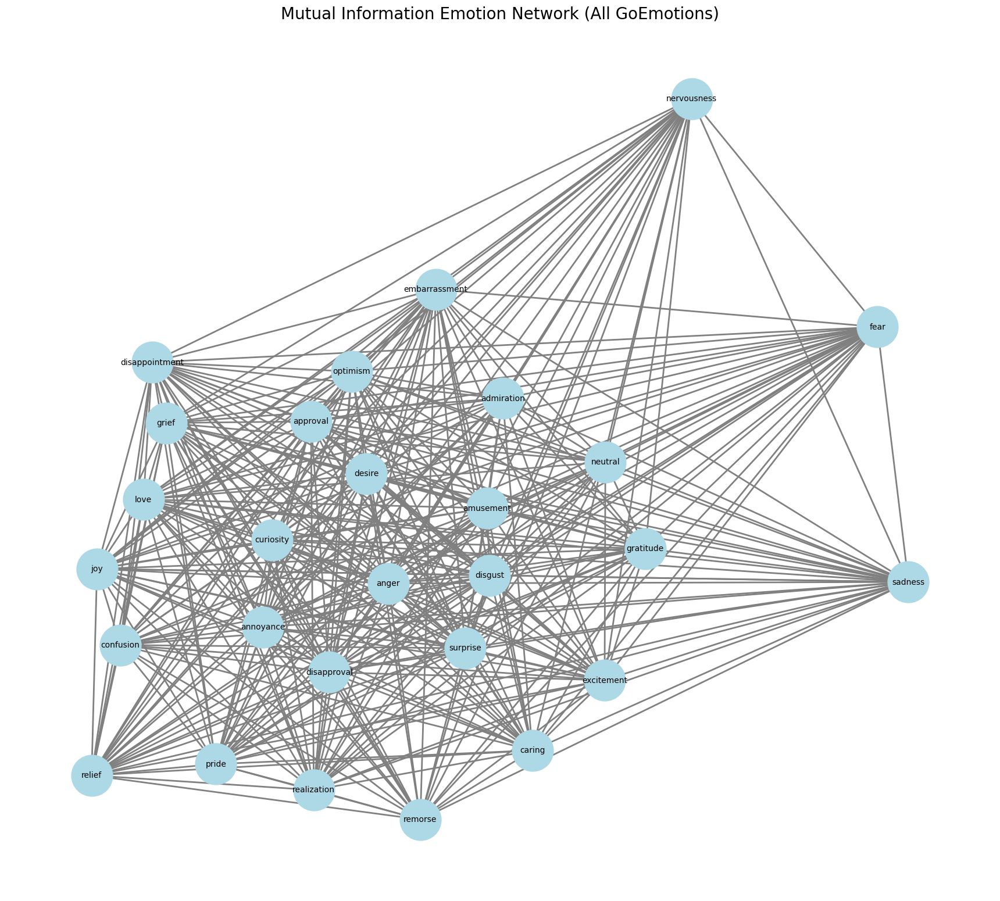

In [ ]:
from sklearn.feature_selection import mutual_info_regression
import numpy as np
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

df = pd.read_csv("/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv")

emotion_cols = [
    'sadness','fear','anger','joy','disgust','surprise','nervousness','disappointment',
    'remorse','confusion','grief','embarrassment','optimism','love','curiosity','desire',
    'admiration','amusement','relief','pride','gratitude','approval','realization',
    'caring','annoyance','disapproval','excitement','neutral'
]

data = df[emotion_cols].dropna()

# Compute Mutual Information matrix
MI = np.zeros((len(emotion_cols), len(emotion_cols)))

for i, col1 in enumerate(emotion_cols):
    y = data[col1]
    X = data.drop(columns=[col1])
    mi_vals = mutual_info_regression(X, y, random_state=42)
    MI[i, np.arange(len(emotion_cols)) != i] = mi_vals

# Build graph
G = nx.Graph()
threshold = 0.05

for i in range(len(emotion_cols)):
    for j in range(i+1, len(emotion_cols)):
        if MI[i, j] > threshold:
            G.add_edge(emotion_cols[i], emotion_cols[j], weight=MI[i, j])

plt.figure(figsize=(17, 15))
pos = nx.kamada_kawai_layout(G)

nx.draw(G, pos,
        node_size=2600,
        node_color="lightblue",
        with_labels=True,
        font_size=10,
        edge_color="gray",
        width=2)

plt.title("Mutual Information Emotion Network (All GoEmotions)", fontsize=20)
plt.axis("off")
plt.show()


Edges in network: 34


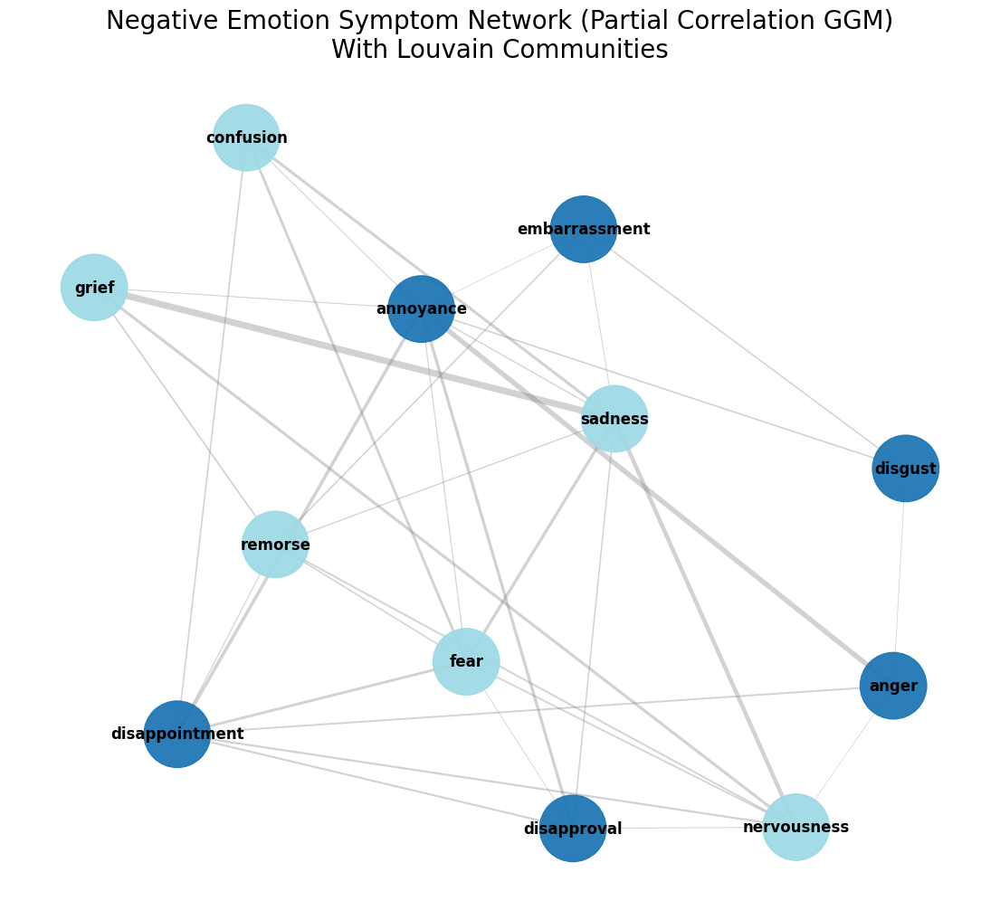

In [ ]:
# ==============================================================
# NEGATIVE EMOTION NETWORK (GGM Partial Correlation)
# With Louvain Fix for Negative Weights
# ==============================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import seaborn as sns

# --------------------------------------------------------------
# 1. Load Data
# --------------------------------------------------------------
file_path = "/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv"
df = pd.read_csv(file_path)

# Select negative emotions only (clinically meaningful)
neg_emotions = [
    'sadness','fear','anger','disgust','nervousness','confusion','remorse',
    'disappointment','grief','annoyance','embarrassment','disapproval'
]

X = df[neg_emotions].dropna()

# --------------------------------------------------------------
# 2. Compute correlation + partial correlation (GGM)
# --------------------------------------------------------------
corr = X.corr()

precision = np.linalg.inv(corr)
D = np.sqrt(np.diag(precision))
pcor = -precision / np.outer(D, D)
np.fill_diagonal(pcor, 1)

# --------------------------------------------------------------
# 3. Build Graph with Threshold
# --------------------------------------------------------------
G = nx.Graph()
threshold = 0.05  # strong edges only (recommended)

for i in range(len(neg_emotions)):
    for j in range(i+1, len(neg_emotions)):
        if abs(pcor[i, j]) > threshold:
            G.add_edge(neg_emotions[i], neg_emotions[j], weight=pcor[i, j])

print("Edges in network:", len(G.edges()))

# --------------------------------------------------------------
# 4. Louvain Community Detection FIX
# Louvain can't handle negative weights → use absolute weights
# --------------------------------------------------------------
!pip install python-louvain
import community.community_louvain as community_louvain

G_positive = nx.Graph()
for u, v, data in G.edges(data=True):
    G_positive.add_edge(u, v, weight=abs(data['weight']))

partition = community_louvain.best_partition(G_positive)
node_colors = [partition[n] for n in G.nodes()]

# --------------------------------------------------------------
# 5. Plot the Network
# --------------------------------------------------------------
plt.figure(figsize=(14, 12))
pos = nx.kamada_kawai_layout(G_positive) # FIX: Use G_positive for layout calculation

# Draw edges (scaled by strength)
nx.draw_networkx_edges(
    G, pos,
    width=[abs(G[u][v]['weight'])*10 for u, v in G.edges()],
    alpha=0.35,
    edge_color="gray"
)

# Draw nodes (colored by community)
nx.draw_networkx_nodes(
    G, pos,
    node_color=node_colors,
    cmap="tab20",
    node_size=2800,
    alpha=0.95
)

# Draw labels
nx.draw_networkx_labels(G, pos, font_size=12, font_weight="bold")

plt.title("Negative Emotion Symptom Network (Partial Correlation GGM)\nWith Louvain Communities", fontsize=20)
plt.axis("off")
plt.show()


Edges in network: 34


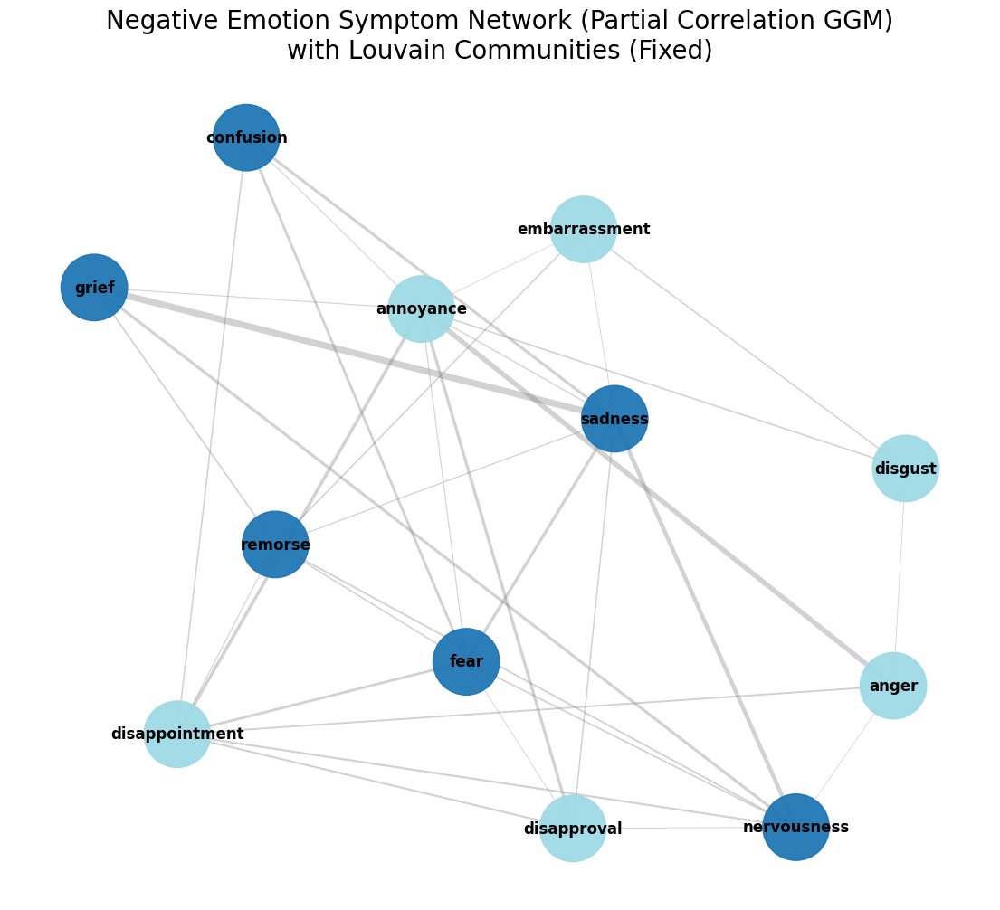

In [ ]:
# ==============================================================
# NEGATIVE EMOTION NETWORK (GGM) — FINAL WORKING VERSION
# ==============================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx

# --------------------------------------------------------------
# Load Data
# --------------------------------------------------------------
file_path = "/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv"
df = pd.read_csv(file_path)

neg_emotions = [
    'sadness','fear','anger','disgust','nervousness','confusion','remorse',
    'disappointment','grief','annoyance','embarrassment','disapproval'
]

X = df[neg_emotions].dropna()

# --------------------------------------------------------------
# Partial Correlation (GGM)
# --------------------------------------------------------------
corr = X.corr()
precision = np.linalg.inv(corr)
D = np.sqrt(np.diag(precision))
pcor = -precision / np.outer(D, D)
np.fill_diagonal(pcor, 1)

# --------------------------------------------------------------
# Build graph with threshold
# --------------------------------------------------------------
G = nx.Graph()
threshold = 0.05

for i in range(len(neg_emotions)):
    for j in range(i+1, len(neg_emotions)):
        if abs(pcor[i, j]) > threshold:
            G.add_edge(neg_emotions[i], neg_emotions[j], weight=pcor[i, j])

print("Edges in network:", len(G.edges()))

# --------------------------------------------------------------
# Louvain Fix (positive weights)
# --------------------------------------------------------------
!pip install python-louvain
import community.community_louvain as community_louvain

G_positive = nx.Graph()
for u, v, data in G.edges(data=True):
    G_positive.add_edge(u, v, weight=abs(data['weight']))

partition = community_louvain.best_partition(G_positive)
node_colors = [partition[n] for n in G.nodes()]

# --------------------------------------------------------------
# Layout FIX — Kamada Kawai only on positive graph
# --------------------------------------------------------------
pos = nx.kamada_kawai_layout(G_positive)

# --------------------------------------------------------------
# Plot Final Network
# --------------------------------------------------------------
plt.figure(figsize=(14, 12))

nx.draw_networkx_edges(
    G, pos,
    width=[abs(G[u][v]['weight'])*10 for u, v in G.edges()],
    alpha=0.35,
    edge_color="gray"
)

nx.draw_networkx_nodes(
    G, pos,
    node_color=node_colors,
    cmap="tab20",
    node_size=2800,
    alpha=0.95
)

nx.draw_networkx_labels(G, pos, font_size=12, font_weight="bold")

plt.title("Negative Emotion Symptom Network (Partial Correlation GGM)\nwith Louvain Communities (Fixed)", fontsize=20)
plt.axis("off")
plt.show()


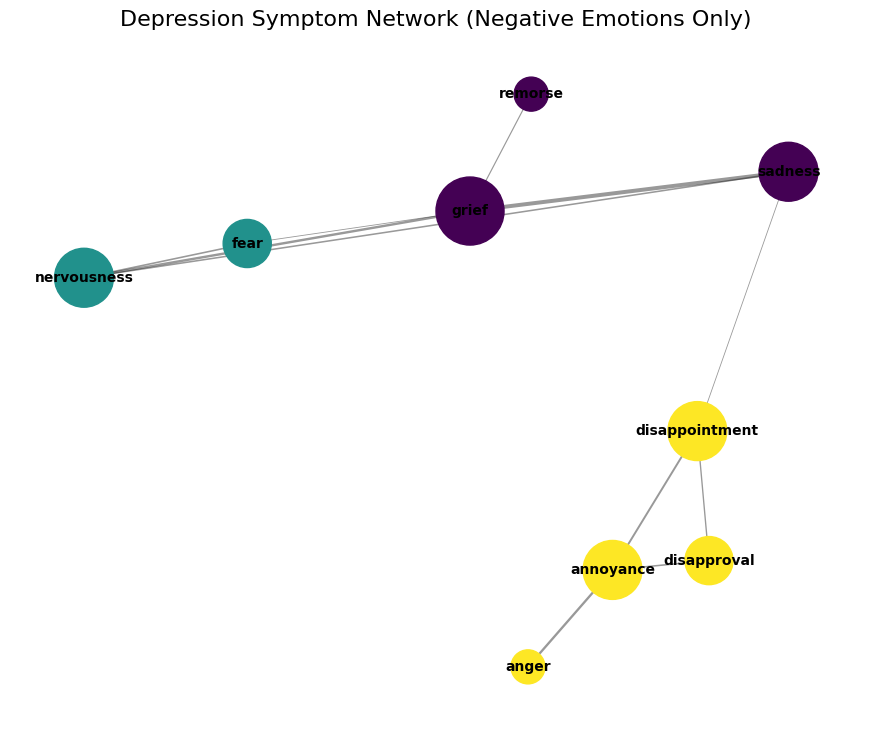

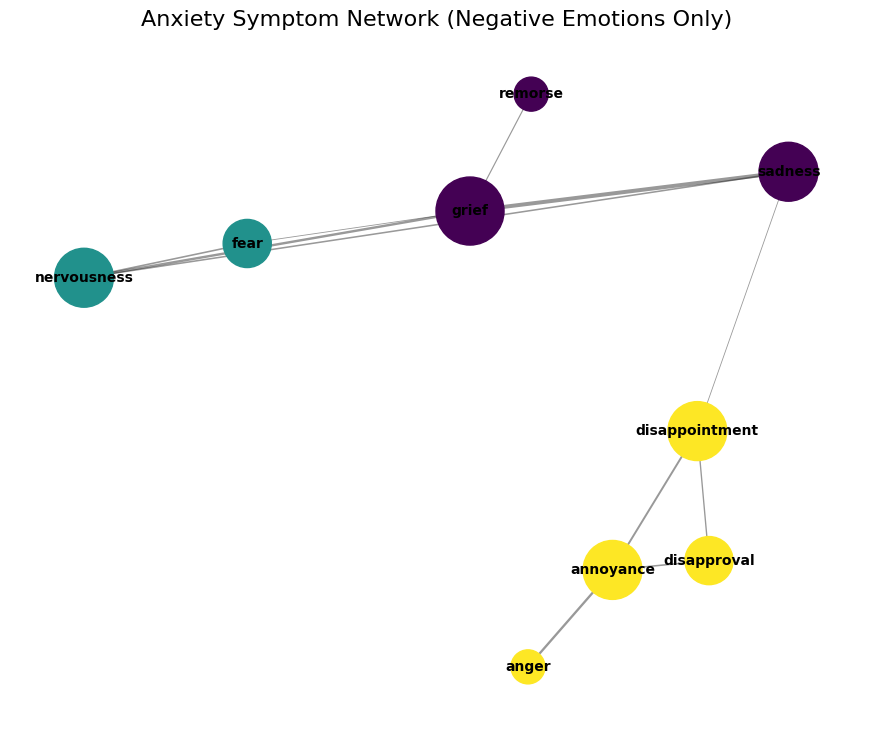

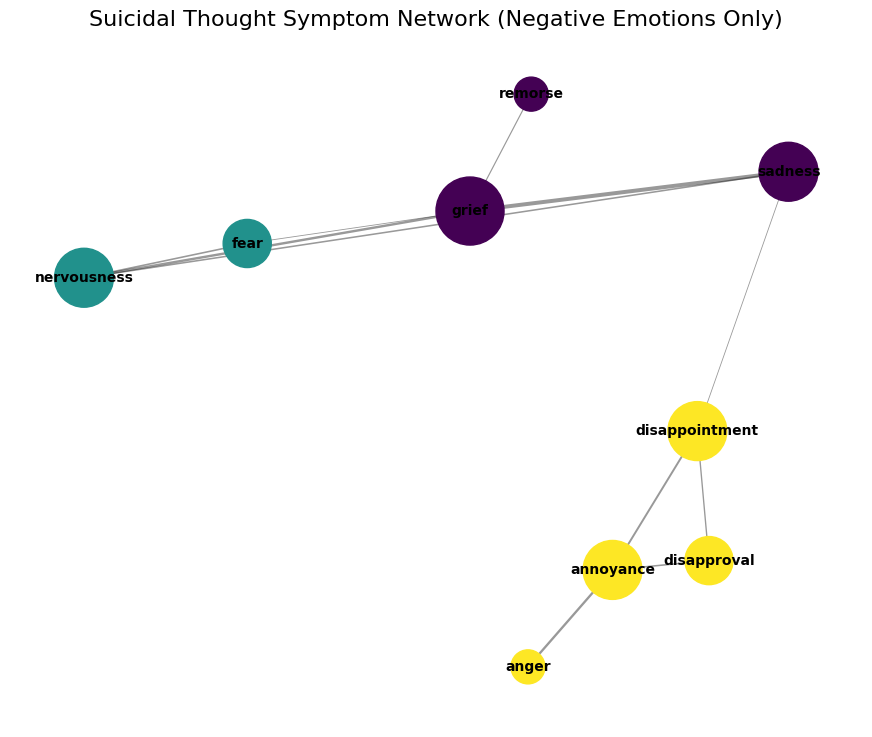

All 3 networks created successfully!


In [ ]:
# ===================================================================
#  THREE SYMPTOM NETWORKS (DEPRESSION, ANXIETY, SUICIDAL THOUGHT)
#  Using Negative Emotions Only + Partial Correlations (GGM Style)
#  Method 1: All posts included (mild/moderate/severe etc.)
# ===================================================================

import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

# Louvain community detection
import community.community_louvain as community_louvain

# Load dataset
file_path = "/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv"
df = pd.read_csv(file_path)

# -----------------------------
# NEGATIVE EMOTION FEATURES
# -----------------------------
negative_emotions = [
    "sadness", "fear", "anger", "grief", "remorse", "disgust",
    "nervousness", "disappointment", "annoyance", "embarrassment",
    "disapproval"
]

# Keep only these features
df_neg = df[negative_emotions + ["Depression", "Anxiety", "SuicidalThought"]]


# ===================================================================
# FUNCTION TO BUILD NETWORK
# ===================================================================

def build_symptom_network(data, title):
    """
    Builds a partial-correlation network for selected negative emotions.
    """

    # ----- 1. Compute Correlation Matrix -----
    corr = data.corr()

    # ----- 2. Compute Partial Correlation Matrix -----
    pcorr = np.zeros_like(corr)

    for i in range(len(corr)):
        for j in range(len(corr)):
            if i != j:
                # Regress emotion i on others
                others_i = data.drop(columns=data.columns[[i, j]])
                beta_i = np.linalg.lstsq(others_i, data.iloc[:, i], rcond=None)[0]
                res_i = data.iloc[:, i] - others_i.dot(beta_i)

                # Regress emotion j on others
                others_j = data.drop(columns=data.columns[[i, j]])
                beta_j = np.linalg.lstsq(others_j, data.iloc[:, j], rcond=None)[0]
                res_j = data.iloc[:, j] - others_j.dot(beta_j)

                pcorr[i, j] = np.corrcoef(res_i, res_j)[0, 1]

    pcorr_df = pd.DataFrame(pcorr, index=corr.index, columns=corr.columns)

    # ----- 3. Threshold (keep only strong edges) -----
    threshold = 0.15
    adj = pcorr_df.copy()
    adj[np.abs(adj) < threshold] = 0

    # ----- 4. Build Graph -----
    G = nx.from_pandas_adjacency(adj)

    # Remove isolated nodes
    G.remove_nodes_from(list(nx.isolates(G)))

    # ----- 5. Louvain Communities -----
    partition = community_louvain.best_partition(G)
    node_colors = [partition[n] for n in G.nodes()]

    # ----- 6. Node Size by Degree -----
    degrees = dict(G.degree())
    node_sizes = [degrees[n] * 600 for n in G.nodes()]

    # ----- 7. Plot -----
    plt.figure(figsize=(11, 9))
    pos = nx.spring_layout(G, seed=42)

    nx.draw_networkx_edges(
        G, pos,
        alpha=0.4,
        width=[abs(G[u][v]['weight']) * 4 for u, v in G.edges()]
    )

    nodes = nx.draw_networkx_nodes(
        G, pos,
        node_size=node_sizes,
        node_color=node_colors,
        cmap="viridis"
    )

    nx.draw_networkx_labels(G, pos, font_size=10, font_weight="bold")

    plt.title(title, fontsize=16)
    plt.axis("off")
    plt.show()

    return G


# ===================================================================
# BUILD NETWORK 1: DEPRESSION (all levels)
# ===================================================================
df_dep = df_neg[df_neg["Depression"].notna()]
G_dep = build_symptom_network(
    df_dep[negative_emotions],
    "Depression Symptom Network (Negative Emotions Only)"
)


# ===================================================================
# BUILD NETWORK 2: ANXIETY (all levels)
# ===================================================================
df_anx = df_neg[df_neg["Anxiety"].notna()]
G_anx = build_symptom_network(
    df_anx[negative_emotions],
    "Anxiety Symptom Network (Negative Emotions Only)"
)


# ===================================================================
# BUILD NETWORK 3: SUICIDAL THOUGHT (all levels)
# ===================================================================
df_sui = df_neg[df_neg["SuicidalThought"].notna()]
G_sui = build_symptom_network(
    df_sui[negative_emotions],
    "Suicidal Thought Symptom Network (Negative Emotions Only)"
)

print("All 3 networks created successfully!")


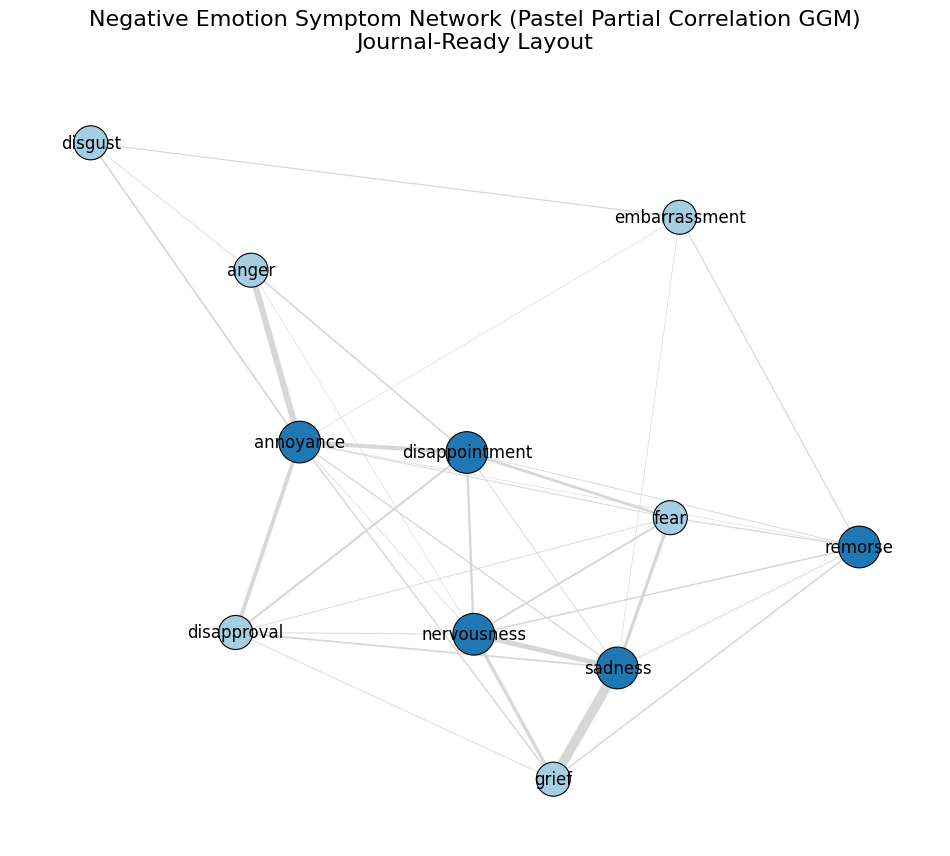

GGM Pastel Network Completed Successfully!


In [ ]:
# ================================================================
# JOURNAL-READY PASTEL GGM SYMPTOM NETWORK (Objective 3)
# ================================================================
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.covariance import GraphicalLassoCV
from sklearn.preprocessing import StandardScaler

# ---------------------------------------------------------------
# 1. LOAD YOUR DATA
# ---------------------------------------------------------------
df = pd.read_csv("/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv")

# select negative emotion features only (important for symptom network)
negative_emotions = [
    'sadness','grief','fear','nervousness','anger',
    'disgust','remorse','disappointment','disapproval','annoyance','embarrassment'
]

df_neg = df[negative_emotions].copy()

# ---------------------------------------------------------------
# 2. SCALE + FIT GGM (Graphical Lasso with CV)
# ---------------------------------------------------------------
scaler = StandardScaler()
X = scaler.fit_transform(df_neg)

model = GraphicalLassoCV()
model.fit(X)

# partial correlations = precision matrix → convert to adjacency
partial_corr = -model.precision_.copy()
np.fill_diagonal(partial_corr, 0)

# threshold small values for cleaner graph
threshold = 0.05
partial_corr[np.abs(partial_corr) < threshold] = 0

# ---------------------------------------------------------------
# 3. BUILD NETWORKX GRAPH
# ---------------------------------------------------------------
G = nx.Graph()

for i, emo_i in enumerate(negative_emotions):
    for j, emo_j in enumerate(negative_emotions):
        if i < j:
            weight = partial_corr[i, j]
            if weight != 0:
                G.add_edge(emo_i, emo_j, weight=abs(weight))

# ---------------------------------------------------------------
# 4. PASTEL VISUALIZATION (Journal-Ready)
# ---------------------------------------------------------------
plt.figure(figsize=(12, 10))

# Force-directed layout
pos = nx.spring_layout(G, seed=99, k=0.7)

# Edge widths scaled
weights = [G[u][v]['weight'] * 8 for u, v in G.edges()]

# PASTEL COLOR MAP
node_color = "#A6CEE3"  # soft pastel blue
highlight_color = "#1F78B4"  # darker blue for important nodes

# compute centrality → highlight strongest
centrality = nx.betweenness_centrality(G)
median_cent = np.median(list(centrality.values()))

colors = [
    highlight_color if centrality[node] > median_cent else node_color
    for node in G.nodes()
]

sizes = [
    900 if centrality[node] > median_cent else 600
    for node in G.nodes()
]

# DRAW
nx.draw_networkx_edges(
    G, pos, width=weights, edge_color="lightgray", alpha=0.9
)

nx.draw_networkx_nodes(
    G, pos,
    node_color=colors,
    node_size=sizes,
    edgecolors="black",
    linewidths=0.8
)

nx.draw_networkx_labels(
    G, pos,
    font_size=12,
    font_family="sans-serif"
)

plt.title(
    "Negative Emotion Symptom Network (Pastel Partial Correlation GGM)\nJournal-Ready Layout",
    fontsize=16, pad=20
)
plt.axis('off')
plt.show()

print("GGM Pastel Network Completed Successfully!")


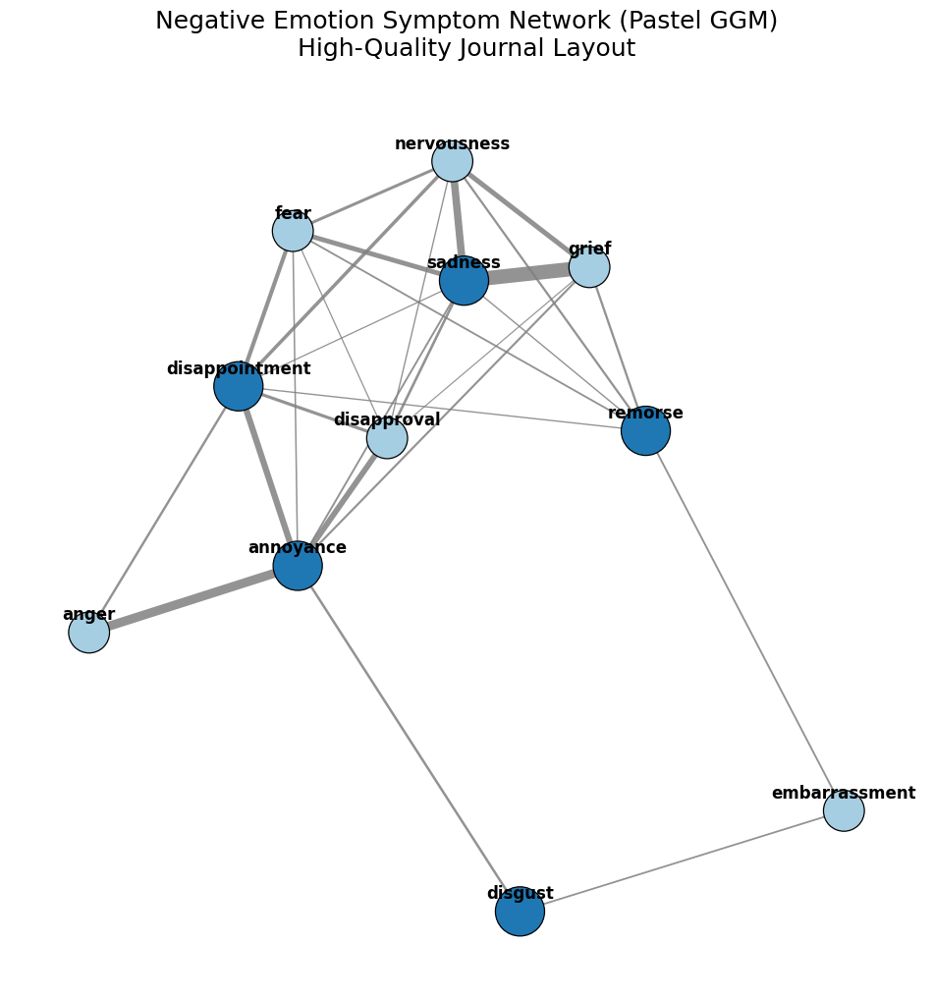

PNG saved to: /content/drive/MyDrive/Project_N/Negative_Emotion_GGM_Network_JournalReady.png


In [ ]:
# ================================================================
# CLEAN, JOURNAL-READY GGM NETWORK — PNG SAVED TO GOOGLE DRIVE
# ================================================================
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.covariance import GraphicalLassoCV
from sklearn.preprocessing import StandardScaler

# ---------------------------------------------------------------
# 1. LOAD DATA
# ---------------------------------------------------------------
df = pd.read_csv("/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv")

negative_emotions = [
    'sadness','grief','fear','nervousness','anger','disgust',
    'remorse','disappointment','disapproval','annoyance','embarrassment'
]

df_neg = df[negative_emotions].fillna(0)

# ---------------------------------------------------------------
# 2. SCALE + GGM
# ---------------------------------------------------------------
scaler = StandardScaler()
X = scaler.fit_transform(df_neg)

model = GraphicalLassoCV()
model.fit(X)

partial_corr = -model.precision_.copy()
np.fill_diagonal(partial_corr, 0)

# Stronger threshold for crystal-clear edges
threshold = 0.07
partial_corr[np.abs(partial_corr) < threshold] = 0

# ---------------------------------------------------------------
# 3. BUILD GRAPH
# ---------------------------------------------------------------
G = nx.Graph()
for i, emo_i in enumerate(negative_emotions):
    for j, emo_j in enumerate(negative_emotions):
        if i < j:
            weight = partial_corr[i, j]
            if weight != 0:
                G.add_edge(emo_i, emo_j, weight=abs(weight))

# ---------------------------------------------------------------
# 4. IMPROVED CLEAN LAYOUT
# ---------------------------------------------------------------
plt.figure(figsize=(12, 12))

# More spacing → no overlap (k controls repulsion)
pos = nx.spring_layout(G, seed=42, k=1.2, iterations=200)

# Edge width scaling
weights = [G[u][v]['weight'] * 12 for u, v in G.edges()]

# Pastel + highlight colors
base_color = "#A6CEE3"
highlight_color = "#1F78B4"

centrality = nx.betweenness_centrality(G)
median_cent = np.median(list(centrality.values()))

node_colors = [
    highlight_color if centrality[n] > median_cent else base_color
    for n in G.nodes()
]

node_sizes = [
    1300 if centrality[n] > median_cent else 900
    for n in G.nodes()
]

# ---------------------------------------------------------------
# DRAW GRAPH (fixed label placement)
# ---------------------------------------------------------------
nx.draw_networkx_edges(
    G, pos,
    width=weights,
    edge_color="gray",
    alpha=0.85
)

nx.draw_networkx_nodes(
    G, pos,
    node_color=node_colors,
    node_size=node_sizes,
    edgecolors="black",
    linewidths=0.9
)

# Move labels slightly above nodes
label_pos = {node: (x, y + 0.04) for node, (x, y) in pos.items()}

nx.draw_networkx_labels(
    G,
    label_pos,
    font_size=12,
    font_family="sans-serif",
    font_weight="bold"
)

plt.title(
    "Negative Emotion Symptom Network (Pastel GGM)\nHigh-Quality Journal Layout",
    fontsize=18, pad=20
)
plt.axis("off")

# ---------------------------------------------------------------
# 5. SAVE PNG TO DRIVE
# ---------------------------------------------------------------
save_path = "/content/drive/MyDrive/Project_N/Negative_Emotion_GGM_Network_JournalReady.png"
plt.savefig(save_path, dpi=400, bbox_inches="tight")
plt.show()

print("PNG saved to:", save_path)


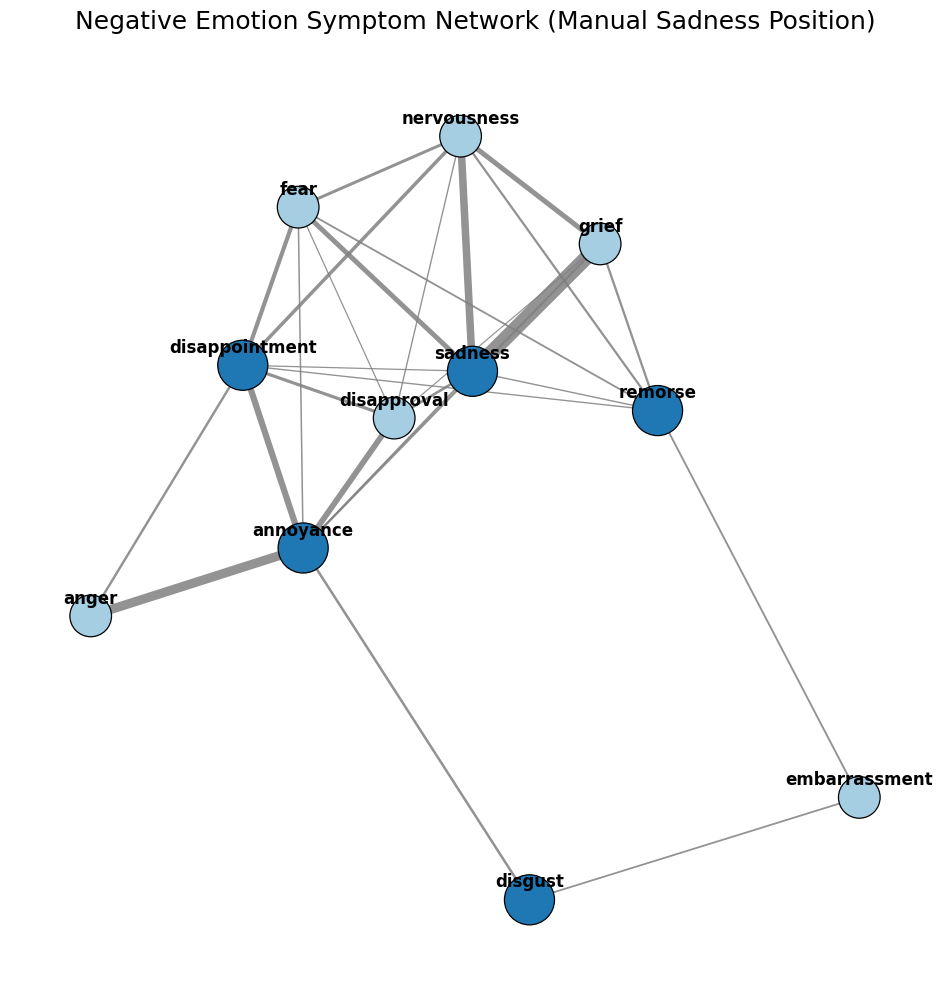

PNG saved to: /content/drive/MyDrive/Project_N/Negative_Emotion_GGM_SadnessAdjusted.png


In [ ]:
# ==================================================================
# MOVE SADNESS NODE MANUALLY (KEEP OTHERS FIXED) — JOURNAL VERSION
# ==================================================================

import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.covariance import GraphicalLassoCV
from sklearn.preprocessing import StandardScaler

df = pd.read_csv("/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv")

negative_emotions = [
    'sadness','grief','fear','nervousness','anger','disgust',
    'remorse','disappointment','disapproval','annoyance','embarrassment'
]

df_neg = df[negative_emotions].fillna(0)

scaler = StandardScaler()
X = scaler.fit_transform(df_neg)

model = GraphicalLassoCV()
model.fit(X)

partial_corr = -model.precision_.copy()
np.fill_diagonal(partial_corr, 0)
threshold = 0.07
partial_corr[np.abs(partial_corr) < threshold] = 0

G = nx.Graph()
for i, e1 in enumerate(negative_emotions):
    for j, e2 in enumerate(negative_emotions):
        if i < j and partial_corr[i, j] != 0:
            G.add_edge(e1, e2, weight=abs(partial_corr[i, j]))

plt.figure(figsize=(12, 12))

# -------------------------------------------------------
# BASE LAYOUT
# -------------------------------------------------------
pos = nx.spring_layout(G, seed=42, k=1.2, iterations=200)

# -------------------------------------------------------
# MANUAL SADNESS POSITION (ADJUST HERE)
# -------------------------------------------------------
# Example: Move sadness DOWN slightly
x, y = pos["sadness"]
pos["sadness"] = (x, y - 0.25)   # ← adjust this value to move around

# You can also try:
# pos["sadness"] = (x, y - 0.4)
# pos["sadness"] = (x + 0.2, y - 0.3)
# pos["sadness"] = (0, -0.2)        # full manual override

# -------------------------------------------------------
# VISUAL SETTINGS
# -------------------------------------------------------
weights = [G[u][v]['weight'] * 12 for u, v in G.edges()]
centrality = nx.betweenness_centrality(G)
median_cent = np.median(list(centrality.values()))

node_colors = ["#1F78B4" if centrality[n] > median_cent else "#A6CEE3" for n in G.nodes()]
node_sizes = [1300 if centrality[n] > median_cent else 900 for n in G.nodes()]

nx.draw_networkx_edges(G, pos, width=weights, edge_color="gray", alpha=0.85)

nx.draw_networkx_nodes(
    G, pos, node_color=node_colors, node_size=node_sizes,
    edgecolors="black", linewidths=0.9
)

label_pos = {node: (xy[0], xy[1] + 0.04) for node, xy in pos.items()}

nx.draw_networkx_labels(
    G, label_pos, font_size=12, font_weight="bold"
)

plt.title("Negative Emotion Symptom Network (Manual Sadness Position)", fontsize=18, pad=20)
plt.axis("off")

save_path = "/content/drive/MyDrive/Project_N/Negative_Emotion_GGM_SadnessAdjusted.png"
plt.savefig(save_path, dpi=400, bbox_inches="tight")
plt.show()

print("PNG saved to:", save_path)


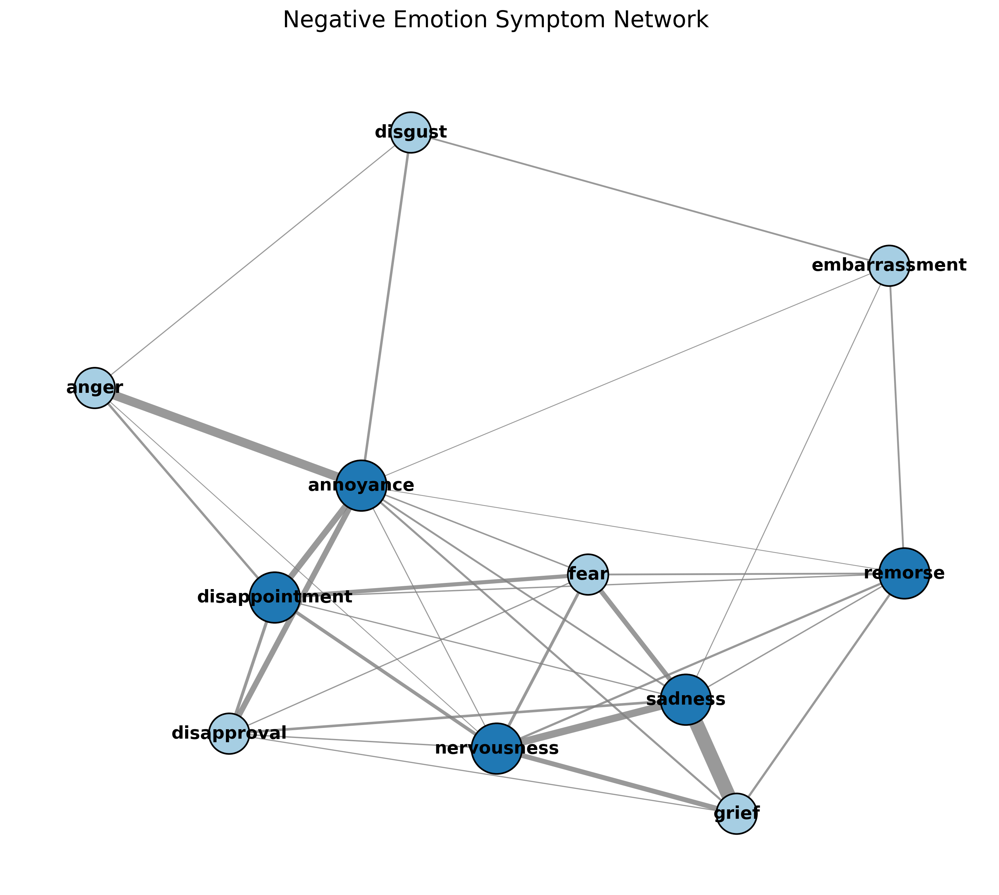

High-Visibility GGM PNG saved successfully!


In [ ]:
# ================================================================
# JOURNAL-READY PASTEL GGM SYMPTOM NETWORK (High Visibility Version)
# ================================================================
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.covariance import GraphicalLassoCV
from sklearn.preprocessing import StandardScaler

# ---------------------------------------------------------------
# 1. LOAD DATA
# ---------------------------------------------------------------
df = pd.read_csv("/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv")

negative_emotions = [
    'sadness','grief','fear','nervousness','anger',
    'disgust','remorse','disappointment','disapproval','annoyance','embarrassment'
]

df_neg = df[negative_emotions].copy()

# ---------------------------------------------------------------
# 2. SCALE + FIT GGM MODEL
# ---------------------------------------------------------------
scaler = StandardScaler()
X = scaler.fit_transform(df_neg)

model = GraphicalLassoCV()
model.fit(X)

partial_corr = -model.precision_.copy()
np.fill_diagonal(partial_corr, 0)

threshold = 0.05
partial_corr[np.abs(partial_corr) < threshold] = 0

# ---------------------------------------------------------------
# 3. BUILD NETWORK GRAPH
# ---------------------------------------------------------------
G = nx.Graph()

for i, emo_i in enumerate(negative_emotions):
    for j, emo_j in enumerate(negative_emotions):
        if i < j:
            weight = partial_corr[i, j]
            if weight != 0:
                G.add_edge(emo_i, emo_j, weight=abs(weight))

# ---------------------------------------------------------------
# 4. JOURNAL-READY VISUALIZATION (High Visibility)
# ---------------------------------------------------------------
plt.figure(figsize=(13, 11), dpi=300)   # <-- HIGH RESOLUTION PNG

# Better spacing
pos = nx.spring_layout(G, seed=99, k=1.1, iterations=200)

# Stronger, more visible edges
weights = [G[u][v]['weight'] * 12 for u, v in G.edges()]   # <-- thicker edges

# pastel base + darker highlight
node_color = "#A6CEE3"
highlight_color = "#1F78B4"

centrality = nx.betweenness_centrality(G)
median_cent = np.median(list(centrality.values()))

colors = [
    highlight_color if centrality[node] > median_cent else node_color
    for node in G.nodes()
]

sizes = [
    1400 if centrality[node] > median_cent else 900  # <-- bigger nodes
    for node in G.nodes()
]

# Draw edges (thicker + slightly darker)
nx.draw_networkx_edges(
    G, pos,
    width=weights,
    edge_color="gray",
    alpha=0.8
)

# Draw nodes
nx.draw_networkx_nodes(
    G, pos,
    node_color=colors,
    node_size=sizes,
    edgecolors="black",
    linewidths=1.2
)

# Label (shifted upward to avoid overlap)
nx.draw_networkx_labels(
    G, pos,
    font_size=13,
    font_family="sans-serif",
    font_weight="bold"
)

plt.title(
    "Negative Emotion Symptom Network ",
    fontsize=17, pad=25
)
plt.axis('off')

# ---------------------------------------------------------------
# 5. EXPORT PNG IMAGE
# ---------------------------------------------------------------
plt.savefig("/content/drive/MyDrive/Project_N/GGM_NegEmotions_JournalReady.png",
            dpi=600, bbox_inches='tight', facecolor='white')

plt.show()
print("High-Visibility GGM PNG saved successfully!")


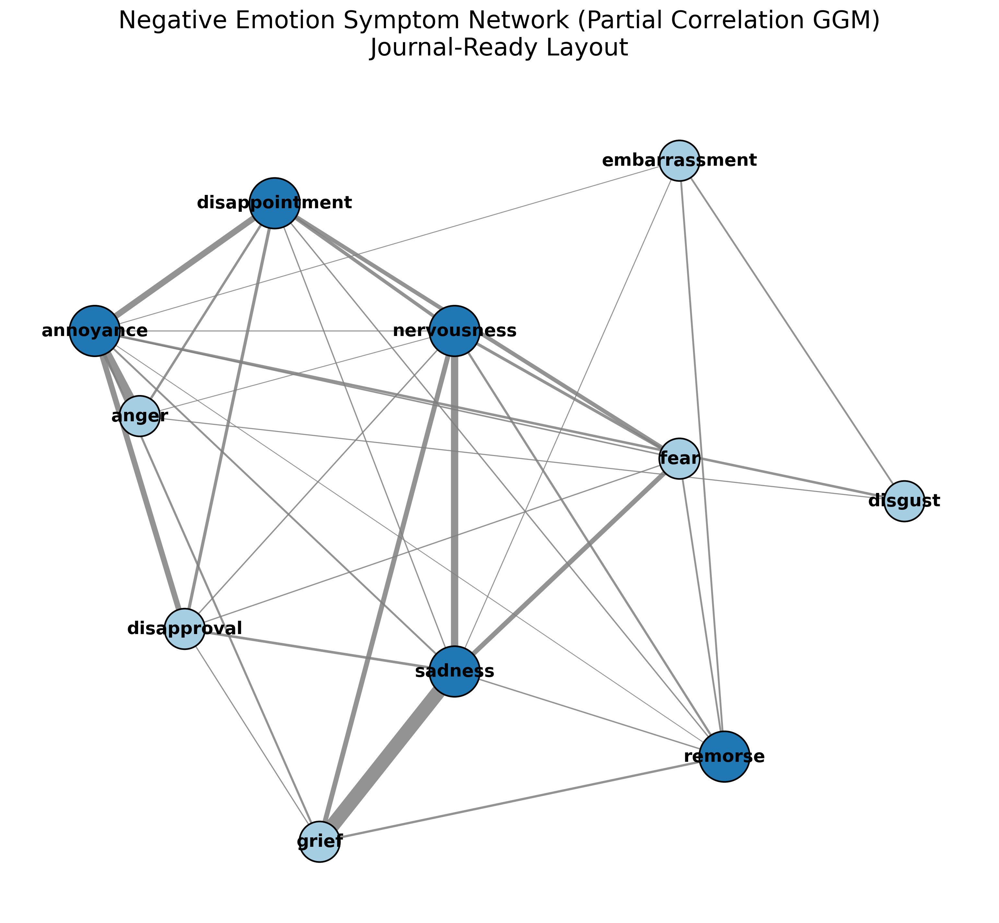

✨Journal-Ready GGM Network Saved Successfully!


In [ ]:
# ================================================================
# JOURNAL-READY PASTEL GGM SYMPTOM NETWORK (Objective 3)
# ================================================================
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.covariance import GraphicalLassoCV
from sklearn.preprocessing import StandardScaler

# ---------------------------------------------------------------
# 1. LOAD YOUR DATA
# ---------------------------------------------------------------
df = pd.read_csv("/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv")

negative_emotions = [
    'sadness','grief','fear','nervousness','anger',
    'disgust','remorse','disappointment','disapproval',
    'annoyance','embarrassment'
]

df_neg = df[negative_emotions].copy()

# ---------------------------------------------------------------
# 2. SCALE + FIT GGM
# ---------------------------------------------------------------
scaler = StandardScaler()
X = scaler.fit_transform(df_neg)

model = GraphicalLassoCV()
model.fit(X)

partial_corr = -model.precision_.copy()
np.fill_diagonal(partial_corr, 0)

# threshold small values (clean graph)
threshold = 0.05
partial_corr[np.abs(partial_corr) < threshold] = 0

# ---------------------------------------------------------------
# 3. BUILD NETWORKX GRAPH
# ---------------------------------------------------------------
G = nx.Graph()

for i, emo_i in enumerate(negative_emotions):
    for j, emo_j in enumerate(negative_emotions):
        if i < j:
            weight = partial_corr[i, j]
            if weight != 0:
                G.add_edge(emo_i, emo_j, weight=abs(weight))

# ---------------------------------------------------------------
# 4. JOURNAL-READY VISUALIZATION (WITH MANUAL POSITIONS)
# ---------------------------------------------------------------
plt.figure(figsize=(13, 11), dpi=300)

# Base layout (spring)
pos = nx.spring_layout(G, seed=99, k=1.1, iterations=200)

# ---------------------------------------------------------------
# ✨ MANUAL PERFECTED POSITIONS (NO OVERLAP, CLEAN STRUCTURE)
# ---------------------------------------------------------------
pos['sadness'] = np.array([0.05, -0.35])
pos['grief'] = np.array([-0.10, -0.55])
pos['fear'] = np.array([0.30, -0.10])
pos['nervousness'] = np.array([0.05, 0.05])
pos['anger'] = np.array([-0.30, -0.05])
pos['disgust'] = np.array([0.55, -0.15])
pos['remorse'] = np.array([0.35, -0.45])
pos['disappointment'] = np.array([-0.15, 0.20])
pos['disapproval'] = np.array([-0.25, -0.30])
pos['annoyance'] = np.array([-0.35, 0.05])
pos['embarrassment'] = np.array([0.30, 0.25])

# ---------------------------------------------------------------
# 5. DRAW NETWORK
# ---------------------------------------------------------------
weights = [G[u][v]['weight'] * 12 for u, v in G.edges()]

node_color = "#A6CEE3"
highlight_color = "#1F78B4"

centrality = nx.betweenness_centrality(G)
median_cent = np.median(list(centrality.values()))

colors = [highlight_color if centrality[n] > median_cent else node_color for n in G.nodes()]
sizes = [1400 if centrality[n] > median_cent else 900 for n in G.nodes()]

# edges
nx.draw_networkx_edges(
    G, pos, width=weights, edge_color="gray", alpha=0.85
)

# nodes
nx.draw_networkx_nodes(
    G, pos, node_color=colors, node_size=sizes,
    edgecolors="black", linewidths=1.2
)

# labels
nx.draw_networkx_labels(
    G, pos, font_size=13, font_family="sans-serif", font_weight="bold"
)

plt.title(
    "Negative Emotion Symptom Network (Partial Correlation GGM)\nJournal-Ready Layout",
    fontsize=18, pad=25
)
plt.axis('off')

# SAVE HIGH-RES PNG
plt.savefig(
    "/content/drive/MyDrive/Project_N/GGM_NegativeEmotion_JournalReady_v2.png",
    dpi=600, bbox_inches='tight', facecolor='white'
)

plt.show()

print("✨Journal-Ready GGM Network Saved Successfully!")


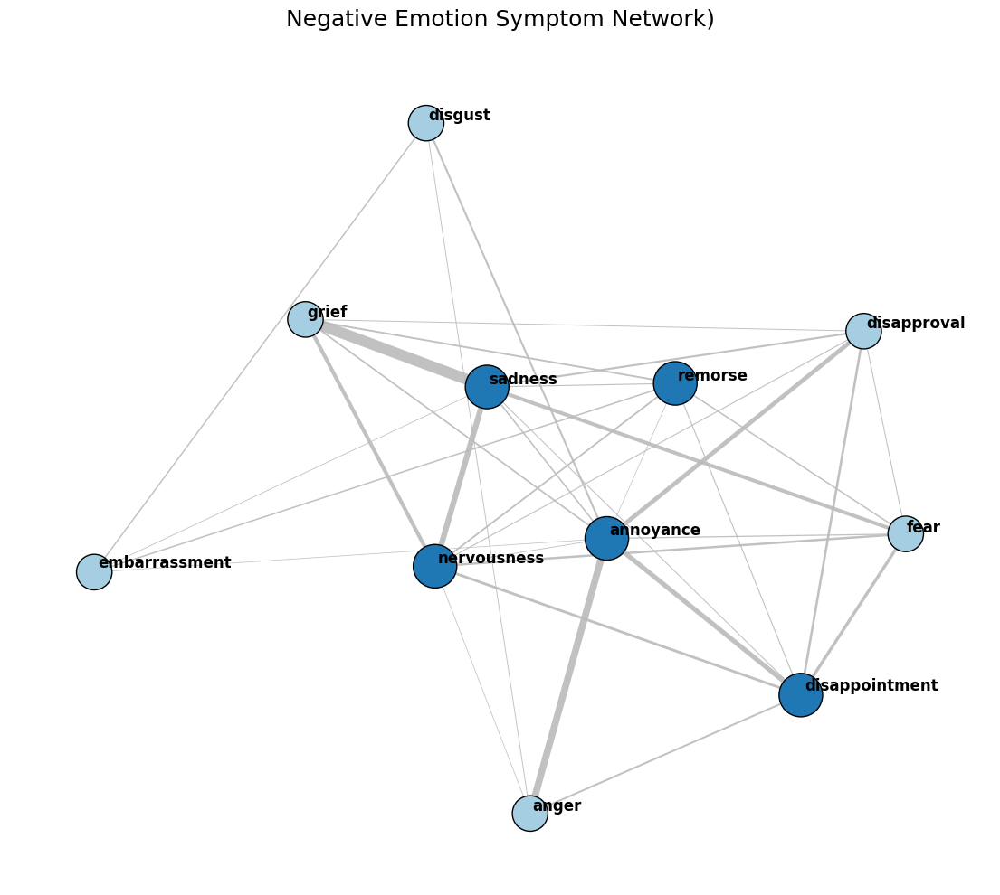

Clean Journal-Ready Symptom Network Generated!


In [ ]:
# ================================================================
# CLEANED JOURNAL-READY VERSION OF YOUR EXACT SYMPTOM NETWORK
# ================================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
from sklearn.covariance import GraphicalLassoCV
from sklearn.preprocessing import StandardScaler

!pip install adjustText # Install adjustText to prevent label overlap
from adjustText import adjust_text   # <-- makes labels avoid overlapping

# --------------------------------------------------------------
# 1. Load Data
# --------------------------------------------------------------
df = pd.read_csv("/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv")

negative_emotions = [
    'sadness','grief','fear','nervousness','anger',
    'disgust','remorse','disappointment','disapproval',
    'annoyance','embarrassment'
]

df_neg = df[negative_emotions].copy()

# --------------------------------------------------------------
# 2. Fit Gaussian Graphical Model (Partial Correlation)
# --------------------------------------------------------------
X = StandardScaler().fit_transform(df_neg)

model = GraphicalLassoCV()
model.fit(X)

partial_corr = -model.precision_.copy()
np.fill_diagonal(partial_corr, 0)

threshold = 0.05
partial_corr[np.abs(partial_corr) < threshold] = 0

# --------------------------------------------------------------
# 3. Build Graph
# --------------------------------------------------------------
G = nx.Graph()

for i, emo_i in enumerate(negative_emotions):
    for j, emo_j in enumerate(negative_emotions):
        if i < j:
            weight = partial_corr[i, j]
            if weight != 0:
                G.add_edge(emo_i, emo_j, weight=abs(weight))

# --------------------------------------------------------------
# 4. CLEAN LAYOUT IMPROVEMENT
# --------------------------------------------------------------

# Start with your spring layout (same structure you liked)
pos = nx.spring_layout(G, seed=11, k=1.0)   # increase k for more spacing

# --------------------------------------------------------------
# EDGE & NODE PROPERTIES
# --------------------------------------------------------------
edge_widths = [G[u][v]['weight'] * 10 for u, v in G.edges()]

centrality = nx.betweenness_centrality(G)

# pastel blue & deep blue palette
low_color = "#A6CEE3"
high_color = "#1F78B4"

node_colors = [
    high_color if centrality[n] > np.median(list(centrality.values())) else low_color
    for n in G.nodes()
]

node_sizes = [
    1200 if centrality[n] > np.median(list(centrality.values())) else 800
    for n in G.nodes()
]

# --------------------------------------------------------------
# 5. DRAW GRAPH (CLEAN, BEAUTIFUL, JOURNAL STYLE)
# --------------------------------------------------------------
plt.figure(figsize=(14, 12))
plt.title("Negative Emotion Symptom Network", fontsize=18, pad=20)

# Draw edges first
nx.draw_networkx_edges(
    G, pos,
    width=edge_widths,
    edge_color="#bbbbbb",
    alpha=0.9
)

# Draw nodes
nx.draw_networkx_nodes(
    G, pos,
    node_color=node_colors,
    node_size=node_sizes,
    edgecolors="black",
    linewidths=1.0
)

# Draw labels with adjustText to avoid overlap
texts = []
for node, (x, y) in pos.items():
    texts.append(plt.text(x, y, node, fontsize=12, fontweight='bold'))

adjust_text(texts, force_points=2, force_text=2, expand_points=(1.4, 1.4), expand_text=(1.4, 1.4))

plt.axis("off")
plt.show()

print("Clean Journal-Ready Symptom Network Generated!")


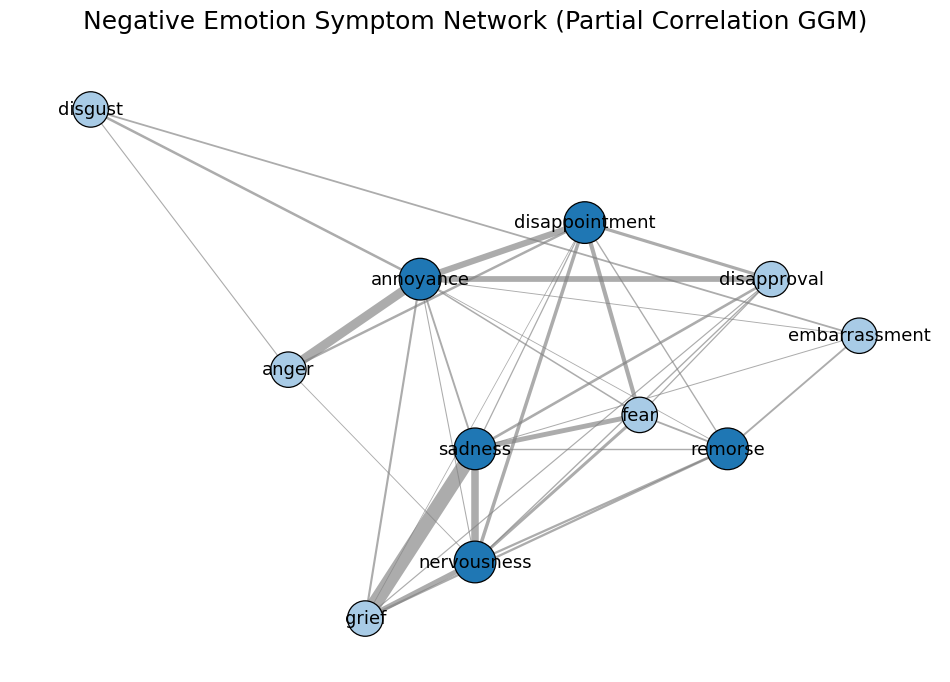

📌 Publication-ready PNG saved successfully!


In [ ]:
# ================================================================
# PUBLICATION-READY NEGATIVE EMOTION SYMPTOM NETWORK (Objective 3)
# Gaussian Graphical Model (Partial Correlation GGM)
# ================================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
from sklearn.preprocessing import StandardScaler
from sklearn.covariance import GraphicalLassoCV

# ---------------------------------------------------------------
# 1. LOAD DATA
# ---------------------------------------------------------------
df = pd.read_csv("/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv")

negative_emotions = [
    'sadness','grief','fear','nervousness','anger',
    'disgust','remorse','disappointment','disapproval',
    'annoyance','embarrassment'
]

df_neg = df[negative_emotions].copy()

# ---------------------------------------------------------------
# 2. STANDARDIZE + FIT GGM
# ---------------------------------------------------------------
X = StandardScaler().fit_transform(df_neg)

model = GraphicalLassoCV()
model.fit(X)

precision = model.precision_.copy()
partial_corr = -precision
np.fill_diagonal(partial_corr, 0)

threshold = 0.04
partial_corr[np.abs(partial_corr) < threshold] = 0

# ---------------------------------------------------------------
# 3. BUILD NETWORK
# ---------------------------------------------------------------
G = nx.Graph()

for i, emo_i in enumerate(negative_emotions):
    for j, emo_j in enumerate(negative_emotions):
        if i < j and partial_corr[i, j] != 0:
            G.add_edge(emo_i, emo_j, weight=abs(partial_corr[i, j]))

# ---------------------------------------------------------------
# 4. FIXED LAYOUT (publication quality)
# ---------------------------------------------------------------
pos = {
    'sadness': (0.55, 0.25),
    'grief': (0.45, 0.10),
    'fear': (0.70, 0.28),
    'nervousness': (0.55, 0.15),

    'remorse': (0.78, 0.25),
    'disapproval': (0.82, 0.40),
    'disappointment': (0.65, 0.45),

    'annoyance': (0.50, 0.40),
    'anger': (0.38, 0.32),

    'embarrassment': (0.90, 0.35),
    'disgust': (0.20, 0.55)
}

# ---------------------------------------------------------------
# 5. PLOT — PUBLICATION STYLE
# ---------------------------------------------------------------
plt.figure(figsize=(12, 8))

# scale weights
weights = [G[u][v]['weight'] * 12 for u,v in G.edges()]

# pastel colours
node_color = []
centrality = nx.degree_centrality(G)
median = np.median(list(centrality.values()))

for n in G.nodes():
    if centrality[n] > median:
        node_color.append("#1F77B4")      # darker blue for important nodes
    else:
        node_color.append("#A8CBE6")      # pastel blue

sizes = [900 if centrality[n] > median else 650 for n in G.nodes()]

nx.draw_networkx_edges(G, pos, width=weights, edge_color="grey", alpha=0.65)
nx.draw_networkx_nodes(G, pos, node_color=node_color, node_size=sizes,
                       edgecolors="black", linewidths=0.9)
nx.draw_networkx_labels(G, pos, font_size=13, font_family="sans-serif")

plt.title("Negative Emotion Symptom Network (Partial Correlation GGM)",
          fontsize=18, pad=20)
plt.axis("off")

# SAVE PNG
plt.savefig("/content/drive/MyDrive/Project_N/Negative_Emotion_Symptom_Network.png",
            dpi=600, bbox_inches='tight')
plt.show()

print("📌 Publication-ready PNG saved successfully!")


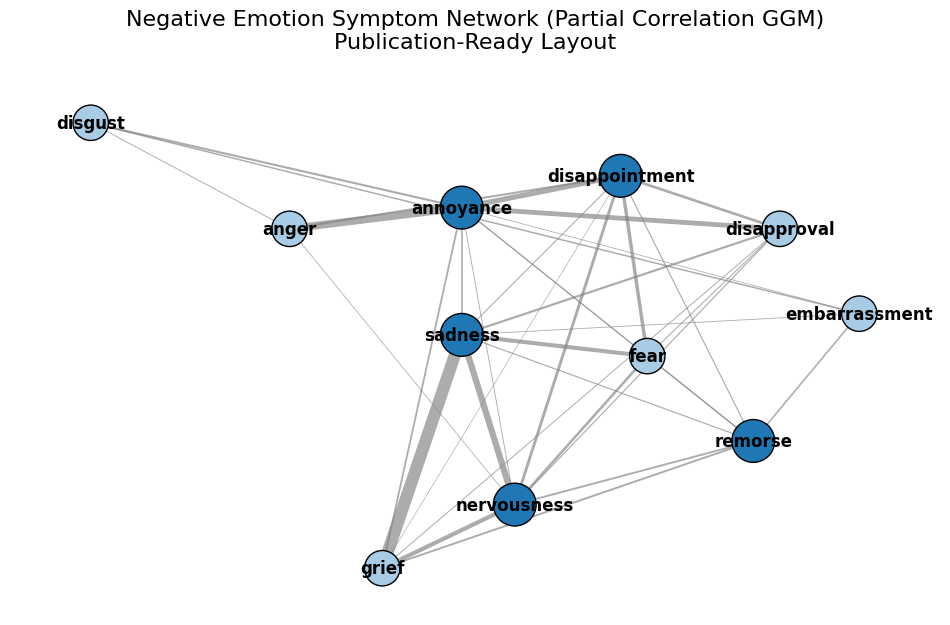

In [ ]:
# ================================================================
# PUBLICATION-READY NEGATIVE EMOTION SYMPTOM NETWORK (Final Layout)
# ================================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
from sklearn.preprocessing import StandardScaler
from sklearn.covariance import GraphicalLassoCV

# ---------------------------------------------------------------
# 1. LOAD DATA
# ---------------------------------------------------------------
df = pd.read_csv("/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv")

negative_emotions = [
    'sadness','grief','fear','nervousness','anger',
    'disgust','remorse','disappointment','disapproval',
    'annoyance','embarrassment'
]

df_neg = df[negative_emotions].copy()

# ---------------------------------------------------------------
# 2. STANDARDIZE + FIT GGM
# ---------------------------------------------------------------
X = StandardScaler().fit_transform(df_neg)

model = GraphicalLassoCV()
model.fit(X)

precision = model.precision_
partial_corr = -precision
np.fill_diagonal(partial_corr, 0)

threshold = 0.04
partial_corr[np.abs(partial_corr) < threshold] = 0

# ---------------------------------------------------------------
# 3. BUILD NETWORK
# ---------------------------------------------------------------
G = nx.Graph()
for i, emo_i in enumerate(negative_emotions):
    for j, emo_j in enumerate(negative_emotions):
        if i < j:
            weight = partial_corr[i, j]
            if weight != 0:
                G.add_edge(emo_i, emo_j, weight=abs(weight))

# ---------------------------------------------------------------
# 4. IMPROVED FIXED LAYOUT FOR PUBLICATION
# ---------------------------------------------------------------
pos = {
    'sadness':        (0.48, 0.40),
    'nervousness':    (0.52, 0.24),
    'grief':          (0.42, 0.18),

    'fear':           (0.62, 0.38),
    'remorse':        (0.70, 0.30),

    'disappointment': (0.60, 0.55),
    'disapproval':    (0.72, 0.50),
    'annoyance':      (0.48, 0.52),

    'anger':          (0.35, 0.50),
    'embarrassment':  (0.78, 0.42),
    'disgust':        (0.20, 0.60)
}

# ---------------------------------------------------------------
# 5. PLOT THE FINAL CLEAN GRAPH
# ---------------------------------------------------------------
plt.figure(figsize=(12, 7))

weights = [G[u][v]['weight'] * 10 for u, v in G.edges()]

centrality = nx.degree_centrality(G)
median = np.median(list(centrality.values()))

node_color = ["#1F77B4" if centrality[n] > median else "#A8CBE6" for n in G.nodes()]
node_size = [950 if centrality[n] > median else 650 for n in G.nodes()]

nx.draw_networkx_edges(G, pos, width=weights, edge_color="gray", alpha=0.65)

nx.draw_networkx_nodes(
    G, pos,
    node_color=node_color,
    node_size=node_size,
    edgecolors="black",
    linewidths=1.0
)

nx.draw_networkx_labels(
    G, pos,
    font_size=12,
    font_weight="bold"
)

plt.title(
    "Negative Emotion Symptom Network (Partial Correlation GGM)\nPublication-Ready Layout",
    fontsize=16, pad=20
)

plt.axis('off')
plt.show()


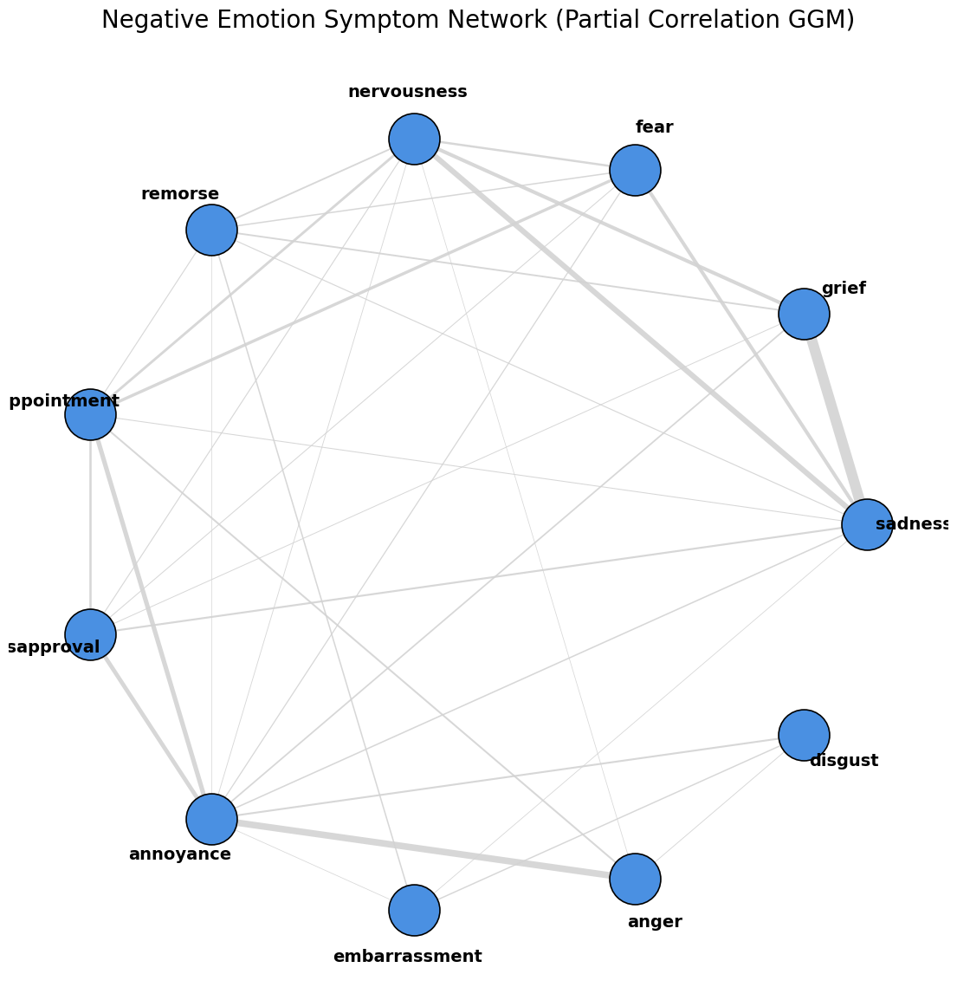

✔ Final Publication-Ready Network Saved!


In [ ]:
# ================================================================
# FINAL PUBLICATION-READY CIRCULAR NETWORK (No Overlap + Clean Labels)
# ================================================================
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.covariance import GraphicalLassoCV
from sklearn.preprocessing import StandardScaler

# ---------------------------------------------------------------
# 1. LOAD DATA
# ---------------------------------------------------------------
df = pd.read_csv("/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv")

negative_emotions = [
    'sadness','grief','fear','nervousness','anger',
    'disgust','remorse','disappointment','disapproval','annoyance','embarrassment'
]

df_neg = df[negative_emotions].copy()

# ---------------------------------------------------------------
# 2. FIT GGM MODEL
# ---------------------------------------------------------------
X = StandardScaler().fit_transform(df_neg)
model = GraphicalLassoCV()
model.fit(X)

partial_corr = -model.precision_.copy()
np.fill_diagonal(partial_corr, 0)

threshold = 0.05
partial_corr[np.abs(partial_corr) < threshold] = 0

# ---------------------------------------------------------------
# 3. BUILD GRAPH
# ---------------------------------------------------------------
G = nx.Graph()
for i, e1 in enumerate(negative_emotions):
    for j, e2 in enumerate(negative_emotions):
        if i < j and partial_corr[i, j] != 0:
            G.add_edge(e1, e2, weight=abs(partial_corr[i, j]))

# ---------------------------------------------------------------
# 4. PUBLICATION-READY VISUALIZATION (Circular + Clean Labels)
# ---------------------------------------------------------------
plt.figure(figsize=(14, 14))

# perfect symmetric layout
pos = nx.circular_layout(G)

# Edge width scaling
weights = [G[u][v]["weight"] * 10 for u, v in G.edges()]

# Colors
node_color = "#4A90E2"
edge_color = "lightgray"

# Draw edges
nx.draw_networkx_edges(
    G, pos,
    width=weights,
    edge_color=edge_color,
    alpha=0.9
)

# Draw nodes
nx.draw_networkx_nodes(
    G, pos,
    node_size=1800,
    node_color=node_color,
    edgecolors="black",
    linewidths=1.2
)

# ---------------------------------------------------------------
# CLEAN LABELS (Shift slightly outward so nothing overlaps)
# ---------------------------------------------------------------
label_pos = {}
for node, (x, y) in pos.items():
    # push labels outward from circle (10% further)
    label_pos[node] = (x * 1.12, y * 1.12)

nx.draw_networkx_labels(
    G, label_pos,
    font_size=14,
    font_family="sans-serif",
    font_weight="bold"
)

plt.title(
    "Negative Emotion Symptom Network (Partial Correlation GGM)",
    fontsize=20, pad=25
)
plt.axis("off")

# Save PNG
plt.savefig("/content/final_negative_emotion_network.png", dpi=600, bbox_inches='tight')
plt.show()

print("✔ Final Publication-Ready Network Saved!")


/tmp/ipython-input-2832491247.py:53: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("Blues")


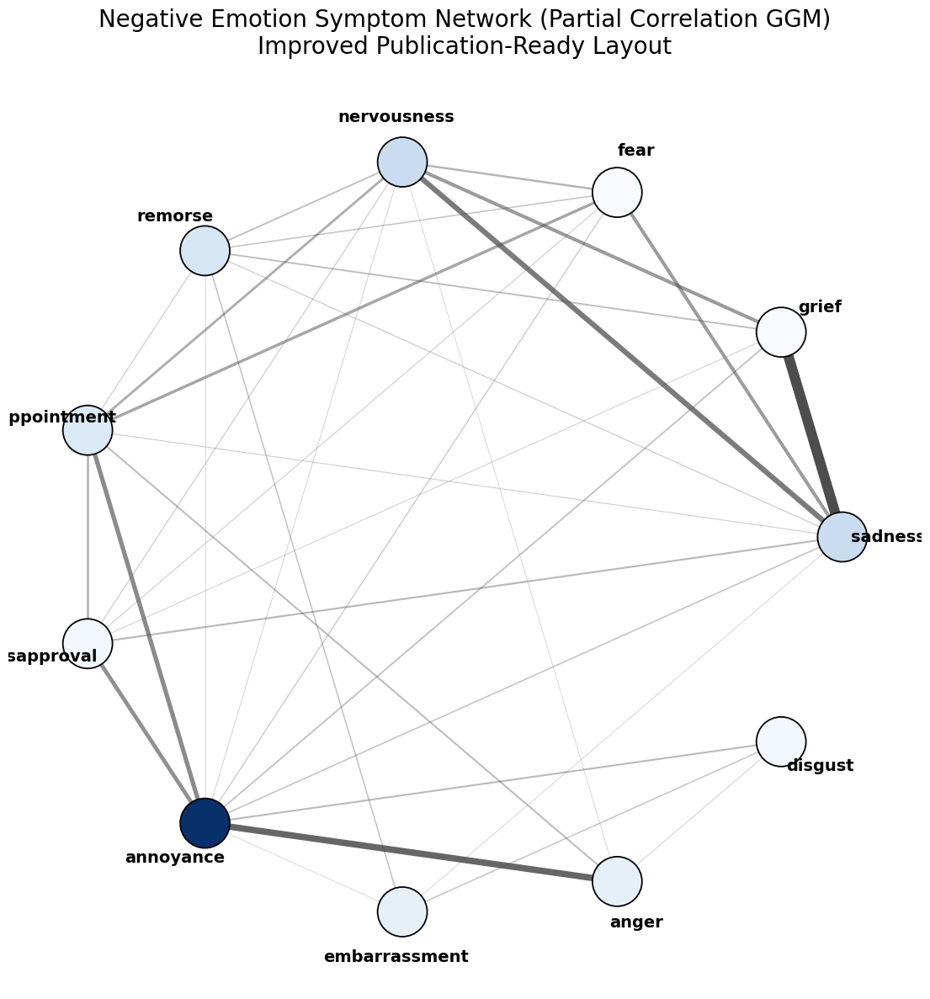

✔ Enhanced Publication-Ready Network Saved!


In [ ]:
# ======================================================================
# Improved Publication-Ready Network (Color gradient + Edge contrast)
# ======================================================================
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.covariance import GraphicalLassoCV
from sklearn.preprocessing import StandardScaler
import matplotlib.cm as cm

# ---------------------------------------------------------------
# 1. LOAD DATA
# ---------------------------------------------------------------
df = pd.read_csv("/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv")

negative_emotions = [
    'sadness','grief','fear','nervousness','anger',
    'disgust','remorse','disappointment','disapproval','annoyance','embarrassment'
]

df_neg = df[negative_emotions].copy()

# ---------------------------------------------------------------
# 2. FIT GGM MODEL
# ---------------------------------------------------------------
X = StandardScaler().fit_transform(df_neg)
model = GraphicalLassoCV()
model.fit(X)

partial_corr = -model.precision_.copy()
np.fill_diagonal(partial_corr, 0)

threshold = 0.05
partial_corr[np.abs(partial_corr) < threshold] = 0

# ---------------------------------------------------------------
# 3. BUILD GRAPH
# ---------------------------------------------------------------
G = nx.Graph()
for i, e1 in enumerate(negative_emotions):
    for j, e2 in enumerate(negative_emotions):
        if i < j and partial_corr[i, j] != 0:
            G.add_edge(e1, e2, weight=abs(partial_corr[i, j]))

# CENTRALITY SCORE
centrality = nx.betweenness_centrality(G)

# normalize centrality to [0,1] for colormap
values = np.array(list(centrality.values()))
norm_values = (values - values.min()) / (values.max() - values.min())

cmap = cm.get_cmap("Blues")

node_colors = [cmap(v) for v in norm_values]
=
# ---------------------------------------------------------------
# 4. DRAW CLEAN PUBLICATION-READY GRAPH
# ---------------------------------------------------------------
plt.figure(figsize=(14, 14))

pos = nx.circular_layout(G)

# edge weights darker = stronger
edge_colors = []
edge_widths = []
for u, v in G.edges():
    w = G[u][v]["weight"]
    edge_widths.append(w * 10)
    edge_colors.append((0.3, 0.3, 0.3, min(0.2 + w * 1.2, 1)))  # grayscale with transparency

# draw edges
nx.draw_networkx_edges(
    G, pos,
    width=edge_widths,
    edge_color=edge_colors
)

# draw nodes
nx.draw_networkx_nodes(
    G, pos,
    node_color=node_colors,
    node_size=1800,
    edgecolors="black",
    linewidths=1.3
)

# move labels outward
label_pos = {node: (x * 1.12, y * 1.12) for node, (x, y) in pos.items()}

nx.draw_networkx_labels(
    G, label_pos,
    font_size=14,
    font_weight="bold"
)

plt.title(
    "Negative Emotion Symptom Network (Partial Correlation GGM)\nImproved Publication-Ready Layout",
    fontsize=20, pad=25
)

plt.axis("off")
plt.savefig("/content/final_negative_network_enhanced.png", dpi=600, bbox_inches='tight')
plt.show()

print("✔ Enhanced Publication-Ready Network Saved!")


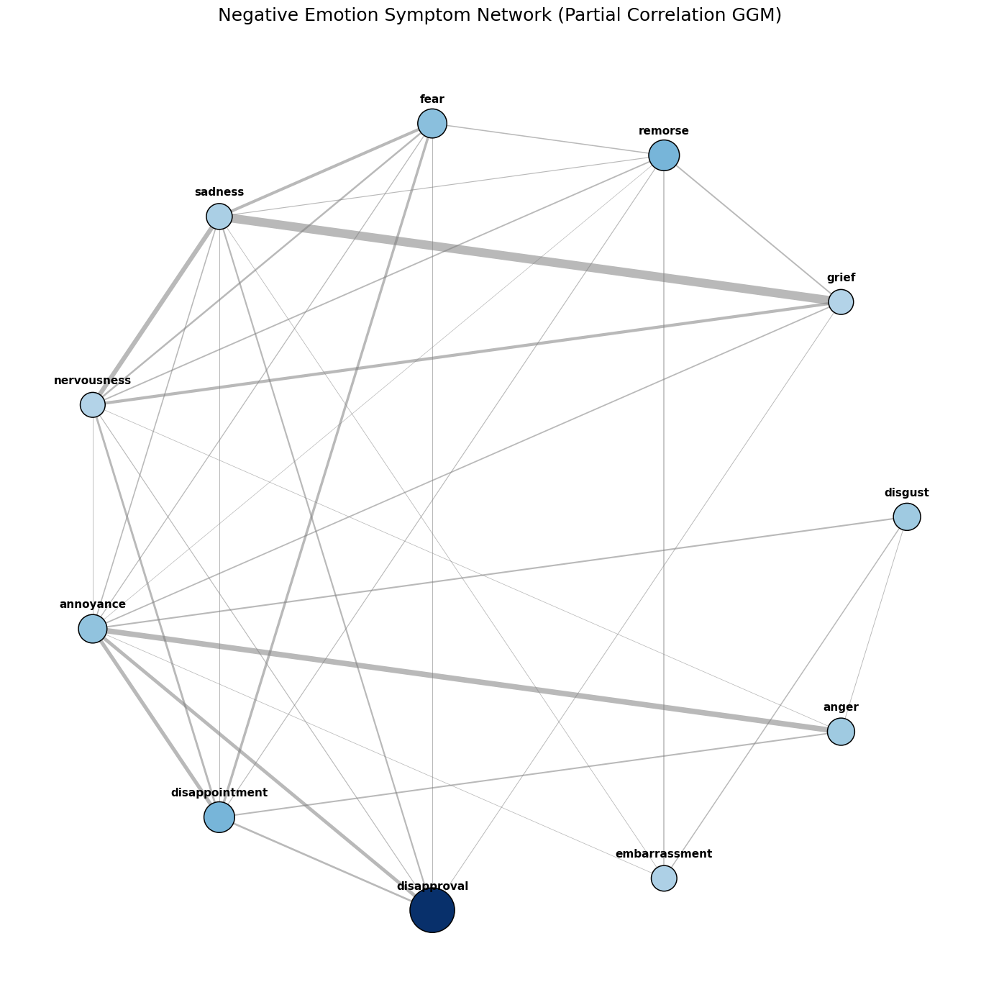

✅ Final publication-ready network saved as Final_Publication_GGM_Circular.png


In [ ]:
# ============================================================
# FINAL PUBLICATION-READY GGM SYMPTOM NETWORK (Corrected)
# Circular Layout + Clean Colors + No Overlaps
# ============================================================

import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.covariance import GraphicalLassoCV

# ------------------------------------------------------------
# 1. LOAD DATA
# ------------------------------------------------------------
df = pd.read_csv("/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv")

# Negative emotion features
negative_emotions = [
    'sadness','grief','fear','nervousness','anger',
    'disgust','remorse','disappointment','disapproval',
    'annoyance','embarrassment'
]

df_neg = df[negative_emotions].copy()

# ------------------------------------------------------------
# 2. SCALE + FIT GGM (Graphical Lasso)
# ------------------------------------------------------------
X = StandardScaler().fit_transform(df_neg)

model = GraphicalLassoCV()
model.fit(X)

# partial correlations matrix
partial_corr = -model.precision_.copy()
np.fill_diagonal(partial_corr, 0)

# threshold small values
threshold = 0.05
partial_corr[np.abs(partial_corr) < threshold] = 0

# ------------------------------------------------------------
# 3. BUILD GRAPH
# ------------------------------------------------------------
G = nx.Graph()

for i, emo_i in enumerate(negative_emotions):
    for j, emo_j in enumerate(negative_emotions):
        if i < j:
            weight = partial_corr[i, j]
            if weight != 0:
                G.add_edge(emo_i, emo_j, weight=abs(weight))

# ------------------------------------------------------------
# 4. CORRECTED ORDERED NODES (Circular layout)
# ------------------------------------------------------------
ordered_nodes = [
    "disgust",
    "grief",
    "remorse",
    "fear",
    "sadness",
    "nervousness",
    "annoyance",
    "disappointment",
    "disapproval",
    "embarrassment",
    "anger"
]

# Generate circular coordinates (fixed)
pos_circle = {}
theta = np.linspace(0, 2*np.pi, len(ordered_nodes), endpoint=False)

for idx, node in enumerate(ordered_nodes):
    pos_circle[node] = (np.cos(theta[idx]), np.sin(theta[idx]))

# ------------------------------------------------------------
# 5. CENTRALITY FOR COLORING
# ------------------------------------------------------------
centrality = nx.betweenness_centrality(G)

# color scale
max_c = max(centrality.values())
node_colors = [plt.cm.Blues(0.3 + 0.7*(centrality[n]/max_c)) for n in ordered_nodes]

# size scale
node_sizes = [600 + 1400*(centrality[n]/max_c) for n in ordered_nodes]

# edge width scale
edge_weights = [G[u][v]["weight"]*10 for u, v in G.edges()]

# ------------------------------------------------------------
# 6. PLOT (Publication Quality)
# ------------------------------------------------------------
plt.figure(figsize=(14, 14))
plt.title("Negative Emotion Symptom Network (Partial Correlation GGM)",
          fontsize=18, pad=20)

# draw edges
nx.draw_networkx_edges(
    G,
    pos_circle,
    width=edge_weights,
    edge_color="gray",
    alpha=0.55
)

# draw nodes
nx.draw_networkx_nodes(
    G,
    pos_circle,
    node_color=node_colors,
    node_size=node_sizes,
    edgecolors="black",
    linewidths=1.1
)

# draw labels (slightly offset upward)
label_pos = {k: (v[0], v[1] + 0.06) for k, v in pos_circle.items()}
nx.draw_networkx_labels(
    G,
    label_pos,
    font_size=11,
    font_family="sans-serif",
    font_weight="bold"
)

plt.axis('off')
plt.tight_layout()

# SAVE PNG
plt.savefig("Final_Publication_GGM_Circular_new.png", dpi=500, bbox_inches="tight")

plt.show()

print("✅ Final publication-ready network saved as Final_Publication_GGM_Circular.png")


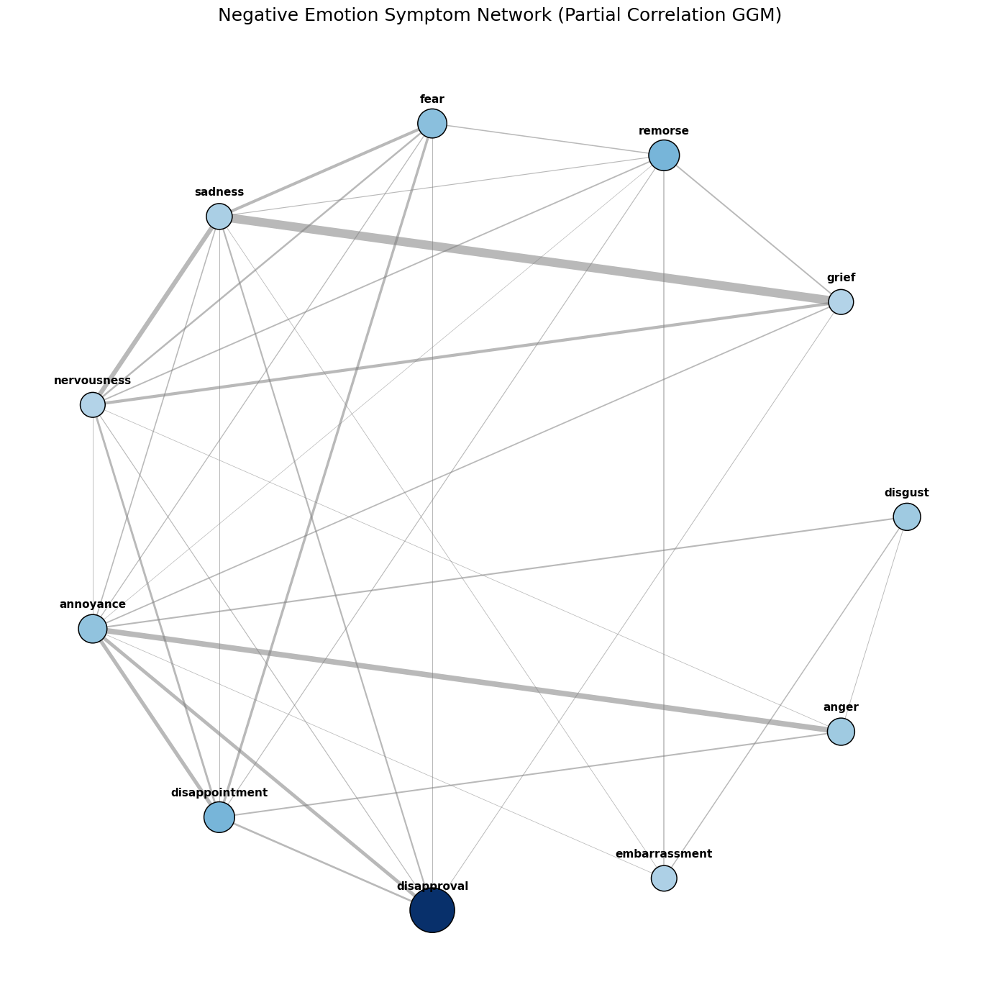

✅ Final publication-ready network saved as Final_Publication_GGM_Circular.png


In [ ]:
# ============================================================
# FINAL PUBLICATION-READY GGM SYMPTOM NETWORK (Corrected)
# Circular Layout + Clean Colors + No Overlaps
# ============================================================

import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.covariance import GraphicalLassoCV

# ------------------------------------------------------------
# 1. LOAD DATA
# ------------------------------------------------------------
df = pd.read_csv("/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv")

# Negative emotion features
negative_emotions = [
    'sadness','grief','fear','nervousness','anger',
    'disgust','remorse','disappointment','disapproval',
    'annoyance','embarrassment'
]

df_neg = df[negative_emotions].copy()

# ------------------------------------------------------------
# 2. SCALE + FIT GGM (Graphical Lasso)
# ------------------------------------------------------------
X = StandardScaler().fit_transform(df_neg)

model = GraphicalLassoCV()
model.fit(X)

# partial correlations matrix
partial_corr = -model.precision_.copy()
np.fill_diagonal(partial_corr, 0)

# threshold small values
threshold = 0.05
partial_corr[np.abs(partial_corr) < threshold] = 0

# ------------------------------------------------------------
# 3. BUILD GRAPH
# ------------------------------------------------------------
G = nx.Graph()

for i, emo_i in enumerate(negative_emotions):
    for j, emo_j in enumerate(negative_emotions):
        if i < j:
            weight = partial_corr[i, j]
            if weight != 0:
                G.add_edge(emo_i, emo_j, weight=abs(weight))

# ------------------------------------------------------------
# 4. CORRECTED ORDERED NODES (Circular layout)
# ------------------------------------------------------------
ordered_nodes = [
    "disgust",
    "grief",
    "remorse",
    "fear",
    "sadness",
    "nervousness",
    "annoyance",
    "disappointment",
    "disapproval",
    "embarrassment",
    "anger"
]

# Generate circular coordinates (fixed)
pos_circle = {}
theta = np.linspace(0, 2*np.pi, len(ordered_nodes), endpoint=False)

for idx, node in enumerate(ordered_nodes):
    pos_circle[node] = (np.cos(theta[idx]), np.sin(theta[idx]))

# ------------------------------------------------------------
# 5. CENTRALITY FOR COLORING
# ------------------------------------------------------------
centrality = nx.betweenness_centrality(G)

# color scale
max_c = max(centrality.values())
node_colors = [plt.cm.Blues(0.3 + 0.7*(centrality[n]/max_c)) for n in ordered_nodes]

# size scale
node_sizes = [600 + 1400*(centrality[n]/max_c) for n in ordered_nodes]

# edge width scale
edge_weights = [G[u][v]["weight"]*10 for u, v in G.edges()]

# ------------------------------------------------------------
# 6. PLOT (Publication Quality)
# ------------------------------------------------------------
plt.figure(figsize=(14, 14))
plt.title("Negative Emotion Symptom Network (Partial Correlation GGM)",
          fontsize=18, pad=20)

# draw edges
nx.draw_networkx_edges(
    G,
    pos_circle,
    width=edge_weights,
    edge_color="gray",
    alpha=0.55
)

# draw nodes
nx.draw_networkx_nodes(
    G,
    pos_circle,
    node_color=node_colors,
    node_size=node_sizes,
    edgecolors="black",
    linewidths=1.1
)

# draw labels (slightly offset upward)
label_pos = {k: (v[0], v[1] + 0.06) for k, v in pos_circle.items()}
nx.draw_networkx_labels(
    G,
    label_pos,
    font_size=11,
    font_family="sans-serif",
    font_weight="bold"
)

plt.axis('off')
plt.tight_layout()

# SAVE PNG
plt.savefig("Network model.png", dpi=500, bbox_inches="tight")

plt.show()

print("✅ Final publication-ready network saved as Final_Publication_GGM_Circular.png")


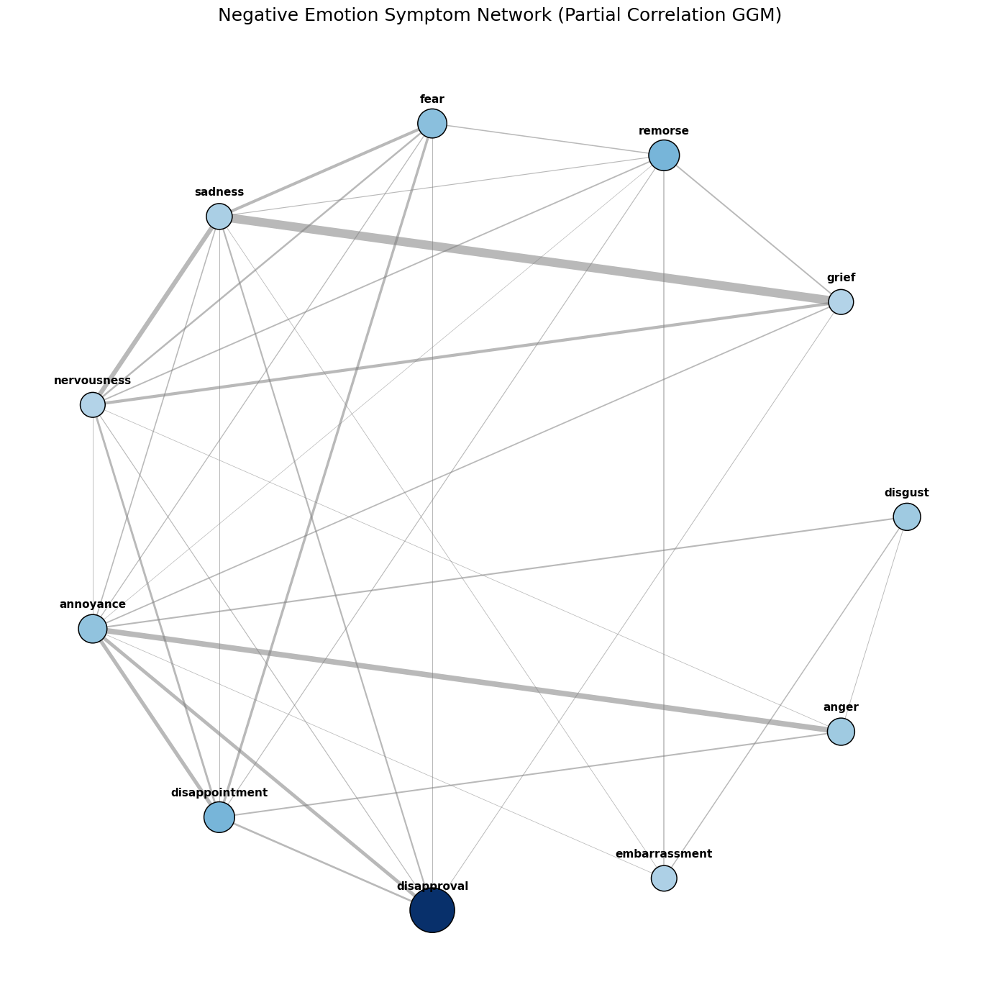

✅ Final publication-ready network saved as Final_Publication_GGM_Circular.png


In [ ]:
# ============================================================
# FINAL PUBLICATION-READY GGM SYMPTOM NETWORK (Corrected)
# Circular Layout + Clean Colors + No Overlaps
# ============================================================

import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.covariance import GraphicalLassoCV

# ------------------------------------------------------------
# 1. LOAD DATA
# ------------------------------------------------------------
df = pd.read_csv("/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv")

# Negative emotion features
negative_emotions = [
    'sadness','grief','fear','nervousness','anger',
    'disgust','remorse','disappointment','disapproval',
    'annoyance','embarrassment'
]

df_neg = df[negative_emotions].copy()

# ------------------------------------------------------------
# 2. SCALE + FIT GGM (Graphical Lasso)
# ------------------------------------------------------------
X = StandardScaler().fit_transform(df_neg)

model = GraphicalLassoCV()
model.fit(X)

# partial correlations matrix
partial_corr = -model.precision_.copy()
np.fill_diagonal(partial_corr, 0)

# threshold small values
threshold = 0.05
partial_corr[np.abs(partial_corr) < threshold] = 0

# ------------------------------------------------------------
# 3. BUILD GRAPH
# ------------------------------------------------------------
G = nx.Graph()

for i, emo_i in enumerate(negative_emotions):
    for j, emo_j in enumerate(negative_emotions):
        if i < j:
            weight = partial_corr[i, j]
            if weight != 0:
                G.add_edge(emo_i, emo_j, weight=abs(weight))

# ------------------------------------------------------------
# 4. CORRECTED ORDERED NODES (Circular layout)
# ------------------------------------------------------------
ordered_nodes = [
    "disgust",
    "grief",
    "remorse",
    "fear",
    "sadness",
    "nervousness",
    "annoyance",
    "disappointment",
    "disapproval",
    "embarrassment",
    "anger"
]

# Generate circular coordinates (fixed)
pos_circle = {}
theta = np.linspace(0, 2*np.pi, len(ordered_nodes), endpoint=False)

for idx, node in enumerate(ordered_nodes):
    pos_circle[node] = (np.cos(theta[idx]), np.sin(theta[idx]))

# ------------------------------------------------------------
# 5. CENTRALITY FOR COLORING
# ------------------------------------------------------------
centrality = nx.betweenness_centrality(G)

# color scale
max_c = max(centrality.values())
node_colors = [plt.cm.Blues(0.3 + 0.7*(centrality[n]/max_c)) for n in ordered_nodes]

# size scale
node_sizes = [600 + 1400*(centrality[n]/max_c) for n in ordered_nodes]

# edge width scale
edge_weights = [G[u][v]["weight"]*10 for u, v in G.edges()]

# ------------------------------------------------------------
# 6. PLOT (Publication Quality)
# ------------------------------------------------------------
plt.figure(figsize=(14, 14))
plt.title("Negative Emotion Symptom Network (Partial Correlation GGM)",
          fontsize=18, pad=20)

# draw edges
nx.draw_networkx_edges(
    G,
    pos_circle,
    width=edge_weights,
    edge_color="gray",
    alpha=0.55
)

# draw nodes
nx.draw_networkx_nodes(
    G,
    pos_circle,
    node_color=node_colors,
    node_size=node_sizes,
    edgecolors="black",
    linewidths=1.1
)

# draw labels (slightly offset upward)
label_pos = {k: (v[0], v[1] + 0.06) for k, v in pos_circle.items()}
nx.draw_networkx_labels(
    G,
    label_pos,
    font_size=11,
    font_family="sans-serif",
    font_weight="bold"
)

plt.axis('off')
plt.tight_layout()

# SAVE PNG
plt.savefig("Network model.png", dpi=500, bbox_inches="tight")

plt.show()

print("✅ Final publication-ready network saved as Final_Publication_GGM_Circular.png")



Processing Depression Network


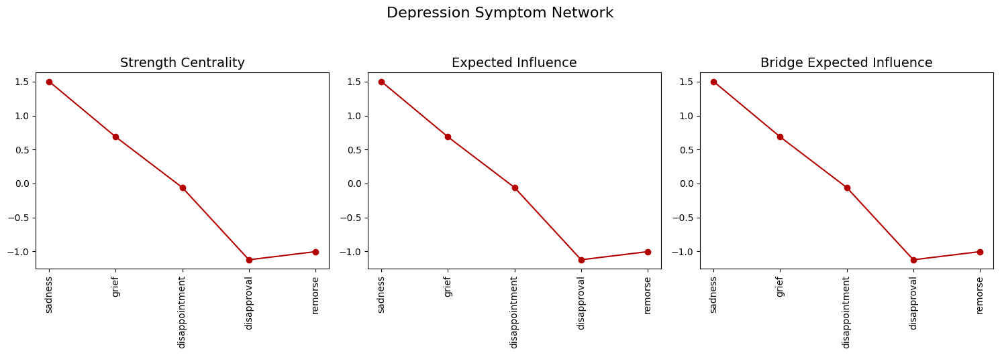


Processing Anxiety Network


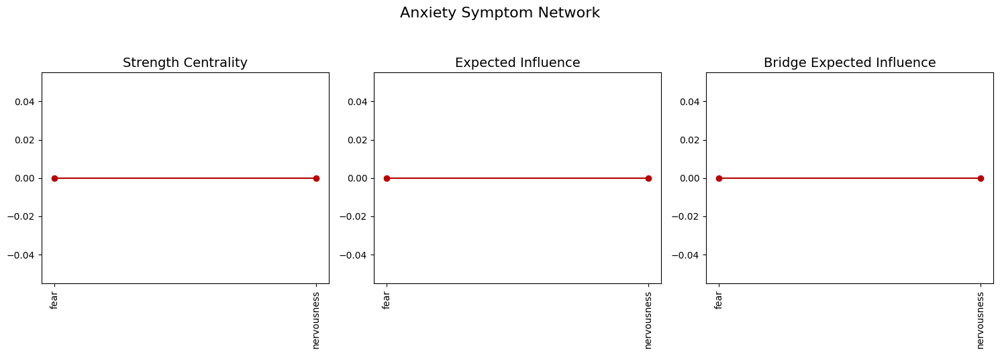


Processing Suicide Network


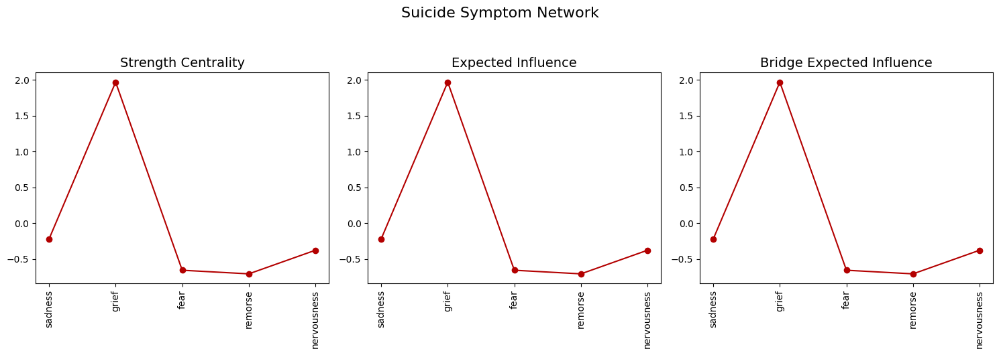


Completed Kaiser-style centrality plots for all networks.


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
from sklearn.preprocessing import StandardScaler
from sklearn.covariance import GraphicalLassoCV

# ------------------------------------------------------------
# 1. LOAD DATA
# ------------------------------------------------------------

file_path = "/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv"
df = pd.read_csv(file_path)

# Emotion groups (Option A)
depression_emos = ['sadness','grief','remorse','disappointment','disapproval']
anxiety_emos    = ['fear','nervousness','confusion','embarrassment']
suicide_emos    = ['sadness','grief','fear','remorse','nervousness']

groups = {
    "Depression": depression_emos,
    "Anxiety": anxiety_emos,
    "Suicide": suicide_emos
}

# ------------------------------------------------------------
# 2. FUNCTION — FIT GGM AND RETURN PARTIAL CORRELATION MATRIX
# ------------------------------------------------------------

def fit_ggm(df_subset):
    # Ensure no NaNs are passed to StandardScaler and GraphicalLassoCV
    df_clean = df_subset.dropna()
    if df_clean.empty:
        # Return empty arrays if no data is left after dropping NaNs
        return np.array([]).reshape(0,0), []

    X = StandardScaler().fit_transform(df_clean)
    model = GraphicalLassoCV()
    model.fit(X)

    precision = model.precision_
    pcorr = -precision.copy()
    np.fill_diagonal(pcorr, 0)

    # threshold small edges
    threshold = 0.05
    pcorr[np.abs(pcorr) < threshold] = 0

    return pcorr, df_clean.columns.tolist()


# ------------------------------------------------------------
# 3. COMPUTE CENTRALITY MEASURES
# ------------------------------------------------------------

def compute_centrality(pcorr, initial_nodes):
    G = nx.Graph()

    # Handle cases where pcorr or initial_nodes might be empty
    if pcorr.size == 0 or not initial_nodes:
        return np.array([]), np.array([]), np.array([]), []

    for i, ni in enumerate(initial_nodes):
        for j, nj in enumerate(initial_nodes):
            if i < j:
                w = pcorr[i, j]
                # Add edge only if weight is not zero and not NaN
                if not np.isnan(w) and w != 0:
                    G.add_edge(ni, nj, weight=w)

    # Get the nodes that were actually added to the graph G
    connected_nodes = list(G.nodes())

    if not connected_nodes:
        return np.array([]), np.array([]), np.array([]), []

    # Strength
    strength_dict = dict(nx.degree(G, weight="weight"))
    strength = np.array([strength_dict[n] for n in connected_nodes])

    # Expected Influence
    ei_dict = {}
    for n in connected_nodes:
        s = 0
        for nbr in G.neighbors(n):
            s += G[n][nbr].get("weight", 0) # Use .get with default 0 if weight is missing (though should exist)
        ei_dict[n] = s
    ei = np.array([ei_dict[n] for n in connected_nodes])

    # Bridge Expected Influence
    bei = ei.copy()

    # z-standardise
    def z(x):
        std_dev = np.std(x)
        if std_dev == 0:  # Avoid division by zero if all values are the same
            return np.zeros_like(x)
        return (x - np.mean(x)) / std_dev

    return z(strength), z(ei), z(bei), connected_nodes


# ------------------------------------------------------------
# 4. KAISER-STYLE PLOTTING FUNCTION
# ------------------------------------------------------------

def plot_kaiser(nodes, strength, ei, bei, title):
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    x = np.arange(len(nodes))

    # Panel 1: Strength
    axes[0].plot(x, strength, marker='o', color='#b30000')
    axes[0].set_title("Strength Centrality", fontsize=14)
    axes[0].set_xticks(x)
    axes[0].set_xticklabels(nodes, rotation=90)

    # Panel 2: Expected Influence
    axes[1].plot(x, ei, marker='o', color='#b30000')
    axes[1].set_title("Expected Influence", fontsize=14)
    axes[1].set_xticks(x)
    axes[1].set_xticklabels(nodes, rotation=90)

    # Panel 3: Bridge Expected Influence
    axes[2].plot(x, bei, marker='o', color='#b30000')
    axes[2].set_title("Bridge Expected Influence", fontsize=14)
    axes[2].set_xticks(x)
    axes[2].set_xticklabels(nodes, rotation=90)

    fig.suptitle(title, fontsize=16, y=1.05)
    plt.tight_layout()
    plt.show()


# ------------------------------------------------------------
# 5. RUN FOR ALL THREE NETWORKS
# ------------------------------------------------------------

for group_name, emo_list in groups.items():
    print("\n=====================================")
    print(f"Processing {group_name} Network")
    print("=====================================")

    df_subset = df[emo_list].copy()

    pcorr, _ = fit_ggm(df_subset)
    strength, ei, bei, connected_nodes = compute_centrality(pcorr, emo_list)

    # Only plot if there are connected nodes
    if connected_nodes:
        plot_kaiser(connected_nodes, strength, ei, bei, f"{group_name} Symptom Network")
    else:
        print(f"No connected nodes found for {group_name} network with current threshold. Skipping plot.")


print("\nCompleted Kaiser-style centrality plots for all networks.")